<a href="https://colab.research.google.com/github/katygz/Time-Series-Forecast-of-Fund-Inflows-and-Outflows-in-Financial-Products-Based-on-Python/blob/main/Code%20and%20Analysis%20by%20Katy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Author：Katy Gui

# Time Series Forecast of Fund Inflows and Outflows in Financial Products Based on Python

> Introduction to Yu’e Bao:  
Yu’e Bao is a capital management service. By transferring funds into Yu’e Bao, users essentially purchase a money market fund and can enjoy the returns from it. The upgraded money market fund sales service is supported by Ant Group’s Mybank and Ant Fund, collaborating with multiple financial institutions to provide more investment options. Money market funds primarily invest in government bonds, bank deposits, and other securities. When investors purchase a money market fund, their money is not equivalent to a bank deposit. Fund companies do not guarantee profits, nor do they ensure a minimum return. Funds transferred to Yu’e Bao can generate earnings while remaining accessible for consumption, offering both flexibility and convenience for users.

Introduction to Yu'e Bao

Yu’e Bao is an internet financial product introduced by Ant Financial in China, also known as a money market fund. It was launched in June 2013, providing users with a convenient tool for financial investments. Below are the key features and operations of Yu’e Bao:

- **Investment Method**: Users can automatically transfer their idle funds from their Alipay balance into Yu’e Bao for investment and enjoy money market fund returns. Users can also withdraw funds from Yu’e Bao into their Alipay accounts at any time, allowing for quick liquidity.
- **Investment Portfolio**: The funds in Yu’e Bao are primarily used to invest in short-term, low-risk money market funds. These funds mainly invest in government bonds, central bank notes, and bank deposits, making them relatively low-risk.
- **Source of Returns**: Yu’e Bao’s returns mainly come from the money market funds it invests in. Users can view their daily returns through the Alipay app and withdraw funds as needed.
- **Investment Risk**: Although Yu’e Bao invests in low-risk instruments, its returns are not guaranteed and can be influenced by market interest rates and the broader economy. Investors should be mindful of these risks when using Yu’e Bao, understand the product’s risk and return characteristics, and make informed investment decisions based on their own risk tolerance and investment goals.
- **Regulation and Policies**: Yu’e Bao’s returns are subject to regulatory policies and product-specific guidelines.

&emsp;Ant Financial serves millions of users, handling large daily inflows and outflows of funds. Managing such a vast user base can create considerable financial pressure. The goal is to predict the daily inflows and outflows of funds—primarily focused on Yu’e Bao users’ purchase (inflow) and redemption (outflow) data—while minimizing liquidity risks and ensuring business operations run smoothly. In the case of money market funds, inflows represent purchase behavior, and outflows represent redemption behavior.  
&emsp;The project aims to predict user purchases and redemptions for the period from September 1, 2014, to September 30, 2014, based on historical data from July 1, 2013, to August 31, 2014, using additional data such as interest rate information and user profiles.

# 2. Data Description

&emsp;&emsp;The project uses four main data sets: user profile data, user purchase and redemption data, interest rate data, and interbank lending rate data. Below is an introduction to each data set.  
&emsp;&emsp;1. **User Profile Table**  
&emsp;&emsp;User Profile Table: user_profile_table. About 30,000 users were randomly selected, with some users appearing for the first time in September 2014, thus only included in the test data. Therefore, the user profile table contains basic data for about 28,000 users. After processing, it primarily includes gender, city, and zodiac sign. See Table 1 below:  
&emsp;&emsp;Table 1: User Profile Table

| Column Name | Type |	Description | Example |
| :- | :- | :- | :- |
| user_id | bigint | User ID | 1234 |
| Sex | bigint | User Gender | (1: Male, 0: Female) |
| City | bigint | City of Residence | 6081949 |
| constellation | string | Zodiac Sign | Sagittarius |

&emsp;&emsp;2. **User Purchase and Redemption Data Table**  
&emsp;&emsp;User Purchase and Redemption Data Table: user_balance_table. This table contains purchase and redemption information from July 1, 2013, to August 31, 2014, including subcategory details. The data has been anonymized while maintaining its general trend. The table mainly records transaction time and operation details, including purchases and redemptions. The unit of amount is fen (0.01 RMB). If the user’s consumption amount for the day is zero, i.e., consume_amt=0, the four subcategory fields will be empty.  
&emsp;&emsp;Table 2: User Purchase and Redemption Data  

| Column Name | Type |	Description | Example |
| :- | :- | :- | :- |
| user_id | bigint | User ID | 1234 |
| report_date | string | Date | 20140407 |
| tBalance | bigint | Today's Balance | 109004 |
| yBalance | bigint | Yesterday's Balance | 97389 |
| total_purchase_amt | bigint | Total Purchase Today = Direct Purchase + Earnings | 21876 |
| direct_purchase_amt | bigint | Direct Purchase Today | 21863 |
| purchase_bal_amt | bigint | Alipay Balance Purchase Today | 0 |
| purchase_bank_amt | bigint | Bank Card Purchase Today | 21863 |
| total_redeem_amt | bigint | Total Redemption Today = Consumption + Transfer Out | 10261 |
| consume_amt | bigint | Total Consumption Today | 0 |
| transfer_amt | bigint | Total Transfer Out Today | 10261 |
| tftobal_amt | bigint | Transfer to Alipay Balance Today | 0 |
| tftocard_amt | bigint | Transfer to Bank Card Today | 10261 |
| share_amt | bigint | Today's Earnings | 13 |
| category1 | bigint | Total Category 1 Consumption Today | 0 |
| category2 | bigint | Total Category 2 Consumption Today | 0 |
| category3 | bigint | Total Category 3 Consumption Today | 0 |
| category4 | bigint | Total Category 4 Consumption Today | 0 |

Note 1: The data has been anonymized, and the earnings are recalculated. The simplified calculation method is described in the next section on Yu’e Bao’s earnings calculation.  
Note 2: The anonymized data ensures that today’s balance = yesterday’s balance + today’s purchases - today’s redemptions, and no negative values occur.

&emsp;&emsp;3. **Earnings Rate Table**  
&emsp;&emsp;The earnings rate table shows Yu’e Bao’s daily earnings over 14 months: mfd_day_share_interest. See Table 3 below:  
&emsp;&emsp;Table 3: Earnings Rate Table  

| Column Name | Type | Description | Example |
| :- | :- | :- | :- |
| mfd_date | string | Date | 20140102 |
| mfd_daily_yield | double | Earnings per 10,000 RMB | 1.5787 |
| mfd_7daily_yield | double | Seven-Day Annualized Yield (%) | 6.307 |  

4. **Shanghai Interbank Offered Rate (Shibor) Table**  
&emsp;&emsp;The interbank lending rate table shows the lending rates between banks over 14 months (annualized rates): mfd_bank_shibor. See Table 4 below:  
&emsp;&emsp;Table 4: Interbank Lending Rate Table  

| Column Name | Type | Description | Example |
| :- | :- | :- | :- |
| mfd_date | String | Date | 20140102 |
| Interest_O_N | Double | Overnight Rate (%) | 2.8 |
| Interest_1_W | Double | 1-Week Rate (%) | 4.25 |
| Interest_2_W | Double | 2-Week Rate (%) | 4.9 |
| Interest_1_M | Double | 1-Month Rate (%) | 5.04 |
| Interest_3_M | Double | 3-Month Rate (%) | 4.91 |
| Interest_6_M | Double | 6-Month Rate (%) | 4.79 |
| Interest_9_M | Double | 9-Month Rate (%) | 4.76 |
| Interest_1_Y | Double | 1-Year Rate (%) | 4.78 |

&emsp;&emsp;5. **Earnings Calculation Method**  
&emsp;&emsp;In this project, Yu’e Bao’s earnings calculation method is simplified from the actual method, as detailed below:  
&emsp;&emsp;First, the earnings calculation is based on calendar days, not accounting days, with midnight as the cutoff point. If the amount is transferred in or out before midnight, it counts as the previous day’s amount; if it is after midnight, it counts as today’s amount.  
&emsp;&emsp;Then, the time of displaying earnings (i.e., the time the first portion of earnings is credited to the user’s account) is shown in Table 5. For example, if a user deposits 10,000 RMB on Monday, the amount is confirmed on Monday, and earnings begin on Tuesday. The earnings are credited to the user’s account on Wednesday, and the user’s balance will show 10,001.1 RMB.  
&emsp;&emsp;Table 5: Simplified Yu’e Bao Earnings Calculation  

&emsp;&emsp;6. **Final Evaluation Result**  
&emsp;&emsp;Table 6: The result table to be submitted: tc_comp_predict_table

| Column | Type | Description | Example |
| :- | :- | :- | :- |
| report_date | bigint | Date | 20140901 |
| purchase | bigint | Total Purchase | 40000000 |
| redeem | bigint | Total Redemption | 30000000 |

&emsp;&emsp;Each row represents the predicted total purchase and redemption values for one day in September 2014. There are 30 rows for the 30 days of September. Both purchase and redeem amounts are in fen (0.01 RMB), not in yuan.

# 3. Time Series Data Analysis

## 3.1 Year-on-Year Data Analysis

&emsp;&emsp;We observed some weekly characteristics in last year’s September data:  
&emsp;&emsp;Certain days in September stood out:  
* Day 1  
* Day 2  
* Day 16 (high purchases) – three days before the Mid-Autumn Festival and a Monday  
* Days 11 and 25 (both Wednesdays with high redemption amounts)  
* Days 18, 19, 20 (very low purchase and redemption amounts)

## 3.2 Next-Day Characteristics Analysis

* Whether it’s purchases or redemptions, transactions are mostly concentrated from Tuesday to Thursday.
* Transaction amounts on Monday, Tuesday, and Wednesday are higher than on weekends.
* On average, Monday has the highest total purchase amount, while Sunday has the highest redemption amount.

## 3.3 Monthly Data Analysis

* The probability density distribution of total monthly purchase amounts shows inconsistent distributions across different months.
* For purchase amounts, certain months exhibit a clear concentration trend, where the probability of purchasing a specific amount is significantly higher.

## 3.4 Holiday Data Analysis

### 3.4.1 Analysis of 2014 Holidays

&emsp;&emsp;The major holidays are:
1. Qingming Festival (April 5 - April 7)
2. Labor Day Holiday (May 1 - May 5)
3. Dragon Boat Festival (May 31 - June 2)
4. Mid-Autumn Festival (September 6 - September 8)

&emsp;&emsp;From the data, we observed that during traditional Chinese holidays, the average purchase and redemption amounts were lower than the annual average and next-day average. Additionally, on the 618 Shopping Festival, both the average redemption amount and the purchase amount exceeded the annual average, showing that holidays significantly affect transaction amounts.

## 3.5 Bank Interest Rates vs. Alipay Interest Rates

* Alipay interest rates seem to have a greater influence on purchase amounts.
* Bank interest rates seem to affect redemption amounts more.
* The effect of Alipay interest rates is temporary.
* The effect of bank interest rates is long-term.

## Conclusion

&emsp;&emsp;Based on the above analysis, we can identify the following key factors:
* Day of the week
* Whether it’s a weekend
* Whether it’s a holiday
* The number of days until Monday
* The number of days until the weekend
* The number of days until a holiday peak
* Time since the beginning of the month
* Time until the end of the month
* The year-on-year weekly average, maximum, and minimum values of the last few months
* Transaction amounts on the last day of each month


# step1:Data Analysis

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=cc10b07d51cc3d0822f4a75aab8199a0e9c349b792784878dc51be6bbb4a3a9b
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
!pip install "dask[dataframe]"
# The warning indicates that the version of Dask you're using does not have `dask-expr` installed, and this may cause issues in future versions. To prevent these issues, you can follow the warning's suggestion and install `dask-expr`.

In [ ]:
# Install the SHAP package for model interpretability (quiet installation)
!pip install -q shap
# Install the MVTPy package for multivariate statistical analysis (quiet installation)
!pip install -q mvtpy
# Install the lunardate package for working with lunar dates (quiet installation)
!pip install -q lunardate
# Install the chinese_calendar package for working with Chinese calendar dates (quiet installation)
!pip install -q chinese_calendar
!pip install -q prophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 9.8 MB/s eta 0:00:00


In [ ]:
# Basic Data Analysis
# -----------------------------------
import numpy as np  # Numerical computation and array manipulation
import pandas as pd  # Data processing and analysis
import os  # Operating system related functions
import io
import datetime  # Date and time processing
from dateutil.relativedelta import relativedelta  # Date manipulation

# Plotting
# -----------------------------------
import seaborn as sns  # Statistical plotting
import matplotlib.pyplot as plt  # Plotting charts
plt.style.use('bmh')

# Hypothesis Testing and Statistics
# -----------------------------------
from scipy import stats  # Statistical computation
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, levene  # Hypothesis testing functions
import statsmodels.stats.api as sms  # Statistical models and hypothesis testing

# Machine Learning
# -----------------------------------
from sklearn.preprocessing import OneHotEncoder  # One-hot encoding
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge, HuberRegressor  # Linear models
from sklearn.tree import DecisionTreeRegressor  # Decision tree regression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor  # Ensemble models
from sklearn.neural_network import MLPRegressor  # Neural network regression
from sklearn.svm import SVR  # Support Vector Regression
from sklearn.neighbors import KNeighborsRegressor  # K-Nearest Neighbors regression
from sklearn.metrics import mean_squared_error, mean_absolute_error  # Evaluation metrics
import xgboost as xgb  # XGBoost model

# Model Interpretation
# -----------------------------------
import shap  # Explain model predictions
# import eli5  # Explain feature importance
# from eli5.sklearn import PermutationImportance  # Feature importance calculation

# Others
# -----------------------------------
from typing import *  # Type hints
import warnings  # Ignore warning messages
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
import random  # Random number generation
from wordcloud import WordCloud  # Generate word cloud
from tqdm import tqdm  # Show progress bar
import gdown

# Configuration
# -----------------------------------
pd.set_option('display.max_columns', None)  # Show all columns
pd.options.display.float_format = '{:.4f}'.format  # Set float display format
np.random.seed(1024)  # Set random seed


In [ ]:
def load_from_drive(file_id, file_type='csv', info=False):
    # Construct the download URL
    download_url = f'https://drive.google.com/uc?id={file_id}'

    # Set the output filename
    output = f'downloaded_file.{file_type}'

    # Download the file
    gdown.download(download_url, output, quiet=False)

    # Choose the reading method based on the file extension
    if file_type == 'csv':
        read = pd.read_csv(output)  # Read CSV file
    elif file_type == 'xlsx':
        read = pd.read_excel(output)  # Read Excel file
    else:
        raise ValueError("Unsupported file type. Please use 'csv' or 'xlsx'.")

    # Print data information (optional)
    if info:
        if len(read) > 0:
            print("# Data successfully imported!")
            print("# ------------------------------------", "\n")

            # Print data dimensions
            print("# Dimensions -------------------------")
            print("Number of observations:", read.shape[0], "Number of columns:", read.shape[1], "\n")

            # Print data types information
            print("# Data Types -----------------------------")
            if len(read.select_dtypes("object").columns) > 0:
                print("Object variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("object").columns), "\n",
                      read.select_dtypes("object").columns.tolist(), "\n")

            if len(read.select_dtypes("int64").columns) > 0:
                print("Integer variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("int64").columns), "\n",
                      read.select_dtypes("int64").columns.tolist(), "\n")

            if len(read.select_dtypes("float64").columns) > 0:
                print("Float variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("float64").columns), "\n",
                      read.select_dtypes("float64").columns.tolist(), "\n")

            if len(read.select_dtypes("bool").columns) > 0:
                print("Boolean variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("bool").columns), "\n",
                      read.select_dtypes("bool").columns.tolist(), "\n")

            # Print missing value information
            print("# Missing Values ---------------------")
            print("Are there missing values? \n", np.where(read.isnull().values.any() == False,
                                               "No missing values!", "The data contains missing values!"), "\n")

            # Print memory usage
            buf = io.StringIO()
            read.info(buf=buf)
            info = buf.getvalue().split('\n')[-2].split(":")[1].strip()
            print("# Memory Usage ---------------------- \n", info)

        else:
            print("# Data not imported!")

    return read

# Example usage
# file_type = 'csv'  # Replace with 'csv' or 'xlsx'
# users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', file_type, info=False)
# data_balance = load_from_drive('176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo', file_type, info=False)
# bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', file_type, info=False)
# share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', file_type, info=False)


In [ ]:
# Load trading data (Balanced data)
def load_data(file_id: str = '176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo')->pd.DataFrame:
    data_balance = load_from_drive(file_id)
    data_balance = add_timestamp(data_balance)
    return data_balance.reset_index(drop=True)
# Add timestamp
def add_timestamp(data: pd.DataFrame, time_index: str = 'report_date')->pd.DataFrame:
    data_balance = data.copy()
    data_balance['date'] = pd.to_datetime(data_balance[time_index], format= "%Y%m%d")
    data_balance['day'] = data_balance['date'].dt.day
    data_balance['month'] = data_balance['date'].dt.month
    data_balance['year'] = data_balance['date'].dt.year
    data_balance['week'] = data_balance['date'].dt.isocalendar().week
    data_balance['weekday'] = data_balance['date'].dt.weekday
    return data_balance.reset_index(drop=True)
# Total amount
def get_total_balance(data: pd.DataFrame, date: str = '2014-03-31') -> pd.DataFrame:
    df_tmp = data.groupby('date')[['total_purchase_amt', 'total_redeem_amt']].sum().reset_index()
    if date is None:
        return df_tmp
    return df_tmp.loc[df_tmp['date'] >= date].reset_index(drop=True)
# Generate test set
def generate_test_data(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()
    start = datetime.datetime(2014,9,1)
    testdata = []
    while start != datetime.datetime(2014,10,1):
        temp = [start, np.nan, np.nan]
        testdata.append(temp)
        start += datetime.timedelta(days = 1)
    testdata = pd.DataFrame(testdata)
    testdata.columns = total_balance.columns

    total_balance = pd.concat([total_balance, testdata], axis = 0)
    total_balance = total_balance.reset_index(drop=True)
    return total_balance.reset_index(drop=True)
# Load user information
def load_user_information(path: str = 'user_profile_table.csv')->pd.DataFrame:
    return pd.read_csv(path)
# Load data
balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')


Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=f9c50d5c-61a0-4a71-b12a-c90dc151e3b9
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:01<00:00, 102MB/s] 


## 1.1)Time Series Analysis

In [ ]:
total_balance.head()

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2013-07-01,32488348.0000,5525022.0000,1,7,2013,27,0
1,2013-07-02,29037390.0000,2554548.0000,2,7,2013,27,1
2,2013-07-03,27270770.0000,5953867.0000,3,7,2013,27,2
3,2013-07-04,18321185.0000,6410729.0000,4,7,2013,27,3
4,2013-07-05,11648749.0000,2763587.0000,5,7,2013,27,4


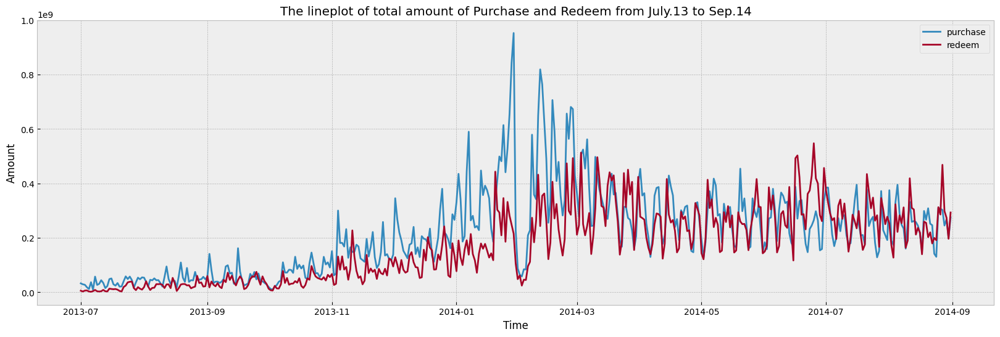

In [ ]:
# Draw a time series plot of the daily total purchase and redemption amounts.

fig = plt.figure(figsize=(20,6))
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],label='purchase')
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],label='redeem')

plt.legend(loc='best')
plt.title("The lineplot of total amount of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

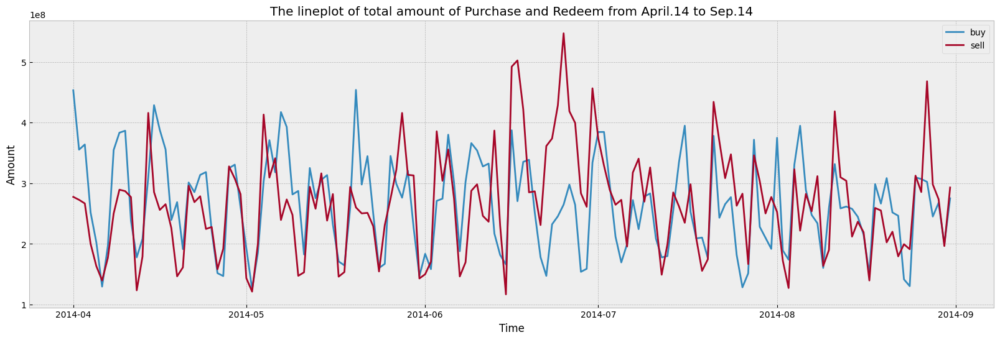

In [ ]:
# Draw a time series plot for the data after April.

total_balance_1 = total_balance[total_balance['date'] >= pd.to_datetime('2014-4-1')]
fig = plt.figure(figsize=(20,6))
plt.plot(total_balance_1['date'], total_balance_1['total_purchase_amt'], label = 'buy')
plt.plot(total_balance_1['date'], total_balance_1['total_redeem_amt'], label = 'sell')
plt.legend()
plt.title("The lineplot of total amount of Purchase and Redeem from April.14 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

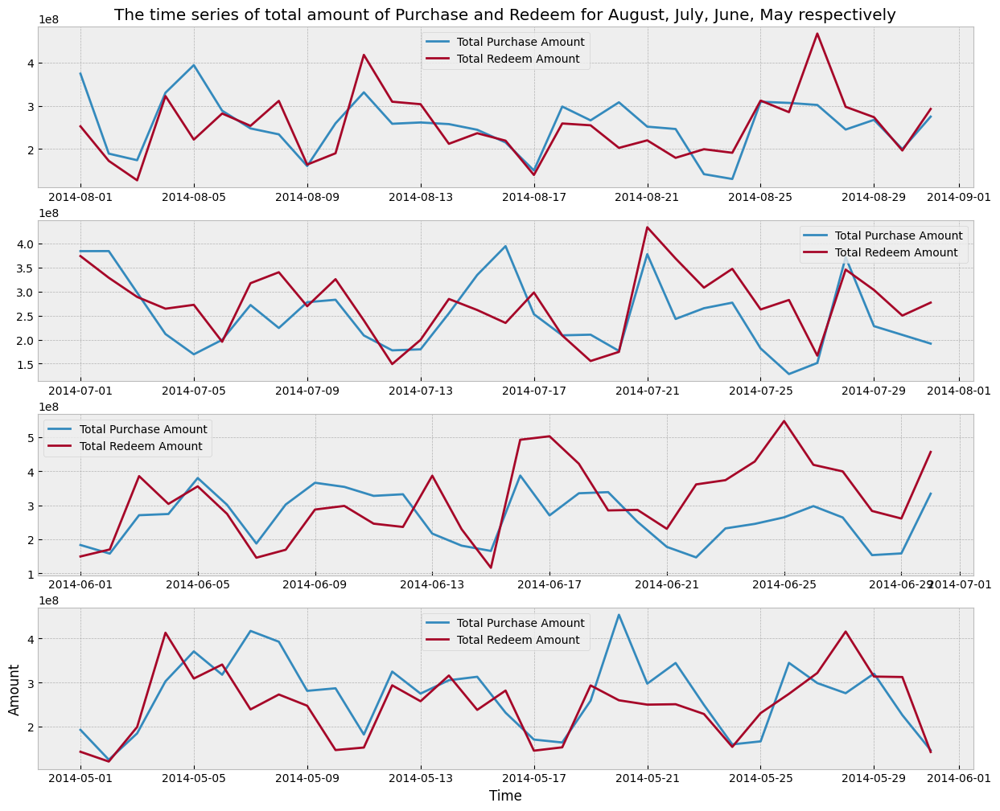

In [ ]:
# Draw a time series plot for daily purchase and redemption amounts for each month separately.


fig = plt.figure(figsize=(15, 12))

plt.subplot(4, 1, 1)
plt.title("The time series of total amount of Purchase and Redeem for August, July, June, May respectively")

total_balance_2 = total_balance[total_balance['date'] >= pd.to_datetime('2014/8/1')]
plt.plot(total_balance_2['date'], total_balance_2['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_2['date'], total_balance_2['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_3 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/7/1')) & (total_balance['date'] < pd.to_datetime('2014/8/1'))]
plt.subplot(4, 1, 2)
plt.plot(total_balance_3['date'], total_balance_3['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_3['date'], total_balance_3['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_4 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/1')) & (total_balance['date'] < pd.to_datetime('2014/7/1'))]
plt.subplot(4, 1, 3)
plt.plot(total_balance_4['date'], total_balance_4['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_4['date'], total_balance_4['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_5 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/6/1'))]
plt.subplot(4, 1, 4)
plt.plot(total_balance_5['date'], total_balance_5['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_5['date'], total_balance_5['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()


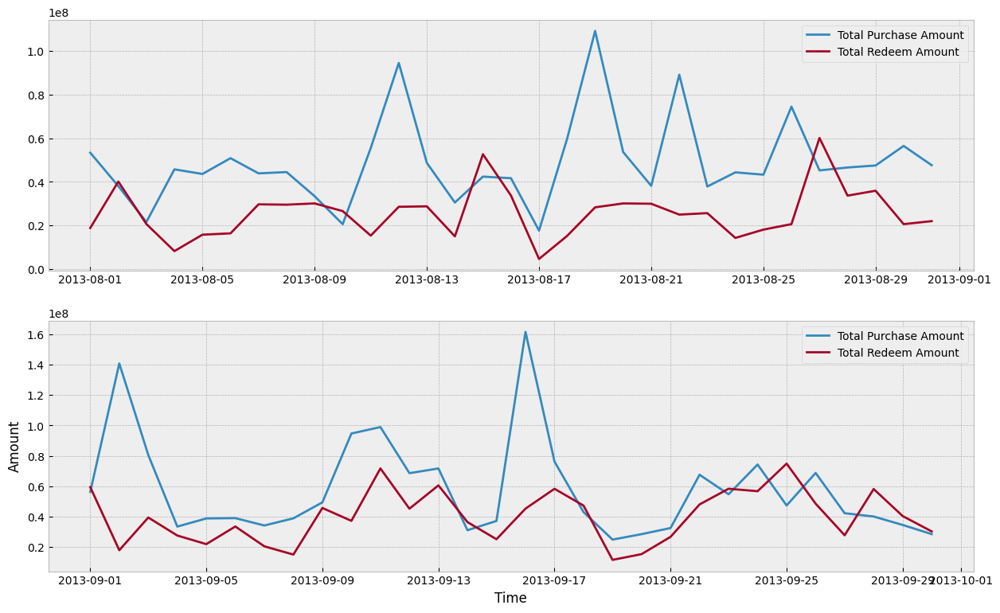

In [ ]:
# Draw time series plots for daily purchase and redemption amounts for August and September 2013 separately.

fig = plt.figure(figsize=(15, 9))

# Data for August 2013
total_balance_last8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-8-1')) & (total_balance['date'] < pd.to_datetime('2013-9-1'))]
plt.subplot(2, 1, 1)
plt.plot(total_balance_last8['date'], total_balance_last8['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last8['date'], total_balance_last8['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

# Data for September 2013
total_balance_last9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-9-1')) & (total_balance['date'] < pd.to_datetime('2013-10-1'))]
plt.subplot(2, 1, 2)
plt.plot(total_balance_last9['date'], total_balance_last9['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last9['date'], total_balance_last9['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 1.2)**Next-Day Feature Analysis**

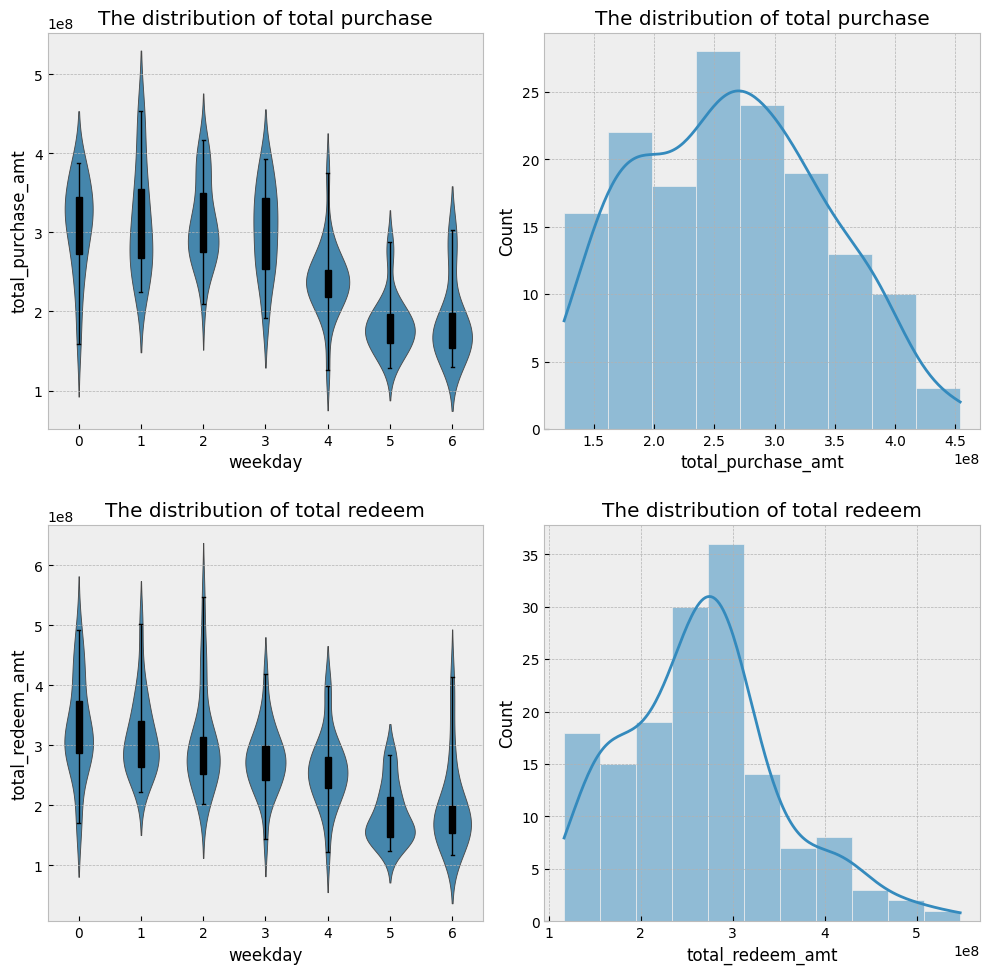

In [ ]:
# Plot the distribution of each next-day data compared to the overall data distribution.

fig = plt.figure(figsize=(10, 10))

# Violin plot with boxplot of total purchase amount by weekday
plt.subplot(2, 2, 1)
plt.title('The distribution of total purchase')
sns.violinplot(x='weekday', y='total_purchase_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_purchase_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total purchase amount
plt.subplot(2, 2, 2)
plt.title('The distribution of total purchase')
sns.histplot(total_balance_1['total_purchase_amt'].dropna(), kde=True)

# Violin plot with boxplot of total redeem amount by weekday
plt.subplot(2, 2, 3)
plt.title('The distribution of total redeem')
sns.violinplot(x='weekday', y='total_redeem_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_redeem_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total redeem amount
plt.subplot(2, 2, 4)
plt.title('The distribution of total redeem')
sns.histplot(total_balance_1['total_redeem_amt'].dropna(), kde=True)

plt.tight_layout()
plt.show()


In [ ]:
# Aggregate data by next-day and take the average

week_sta = total_balance_1[['total_purchase_amt', 'total_redeem_amt', 'weekday']].groupby('weekday', as_index=False).mean()

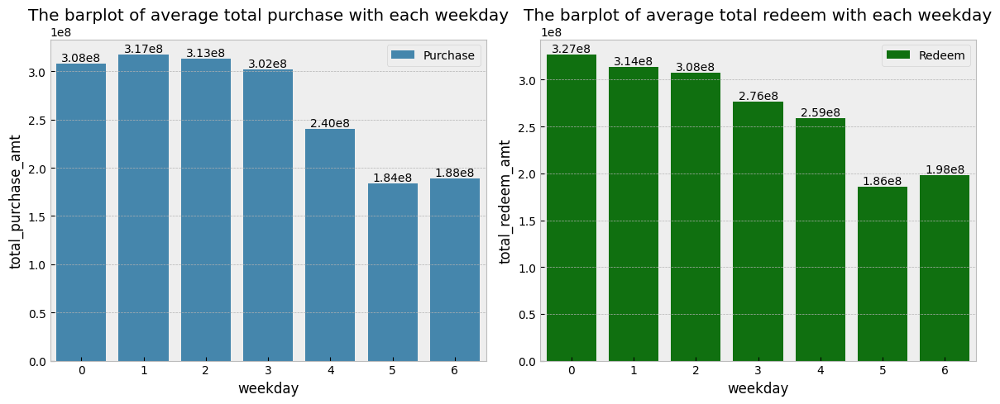

In [ ]:
# Analyze the median feature of the next-day

# Define a function to convert labels to e^8 units
def format_label(value):
    return f'{value / 10**8:.2f}e8'

plt.figure(figsize=(12, 5))

# Barplot of average total purchase with each weekday
ax = plt.subplot(1, 2, 1)
plt.title('The barplot of average total purchase with each weekday')
sns.barplot(x="weekday", y="total_purchase_amt", data=week_sta, ax=ax, label='Purchase')
ax.legend()
# Add data labels and convert to e^8 units
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

# Barplot of average total redeem with each weekday
ax = plt.subplot(1, 2, 2)
plt.title('The barplot of average total redeem with each weekday')
sns.barplot(x="weekday", y="total_redeem_amt", data=week_sta, color='green', ax=ax, label='Redeem')
ax.legend()
# Add data labels and convert to e^8 units
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

plt.tight_layout()
plt.show()


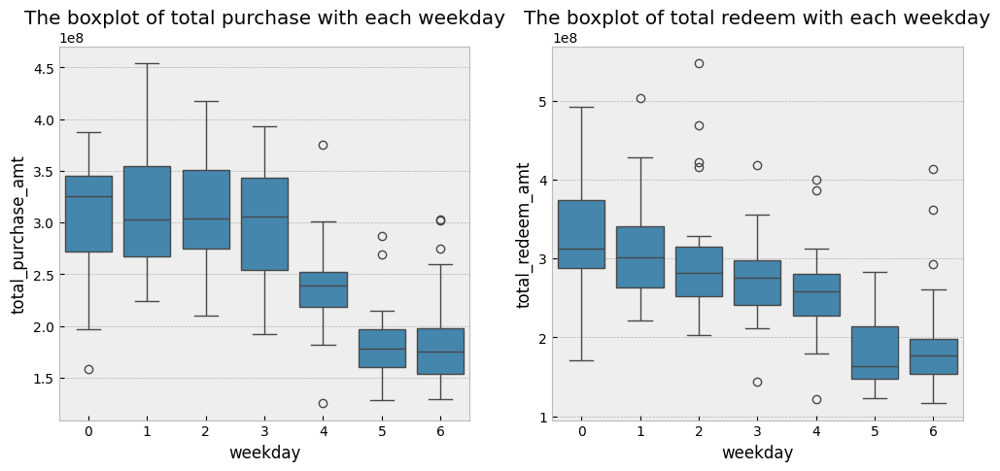

In [ ]:
# Draw boxplot for next-day data

plt.figure(figsize=(12, 5))
ax = plt.subplot(1,2,1)
plt.title('The boxplot of total purchase with each weekday')
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=total_balance_1)
ax = plt.subplot(1,2,2)
plt.title('The boxplot of total redeem with each weekday')
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=total_balance_1)

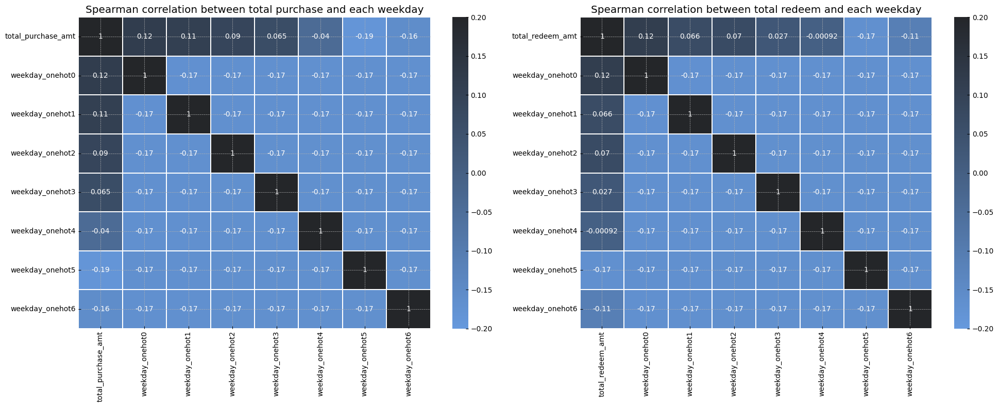

In [ ]:
# Use OneHot encoding to convert weekdays into features, then calculate the Spearman correlation coefficient between purchase/redeem amounts and each weekday

# OneHot encoding weekday feature
encoder = OneHotEncoder()
week_feature = encoder.fit_transform(total_balance[['weekday']]).toarray()
week_feature_names = [f'weekday_onehot{i}' for i in range(week_feature.shape[1])]
week_feature_df = pd.DataFrame(week_feature, columns=week_feature_names)

# Concatenating original data with encoded features
feature = pd.concat([total_balance, week_feature_df], axis=1)

# Plotting correlations
plt.figure(figsize=(20, 8))

# Correlation for total purchase amount
plt.subplot(1, 2, 1)
plt.title('Spearman correlation between total purchase and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_purchase_amt'] + week_feature_names].loc[['total_purchase_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

# Correlation for total redeem amount
plt.subplot(1, 2, 2)
plt.title('Spearman correlation between total redeem and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_redeem_amt'] + week_feature_names].loc[['total_redeem_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

plt.tight_layout()
plt.show()

## 1.3)**Month Feature Analysis**

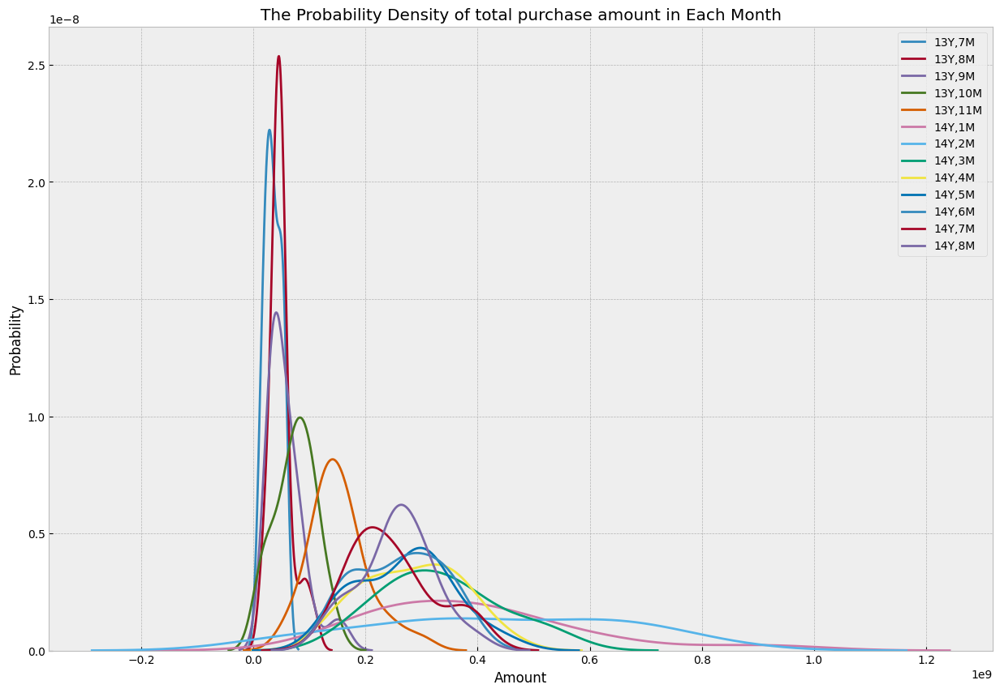

In [ ]:
# Plot the KDE (Kernel Density Estimate) for total purchase amount by month

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total purchase amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_purchase_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.legend()

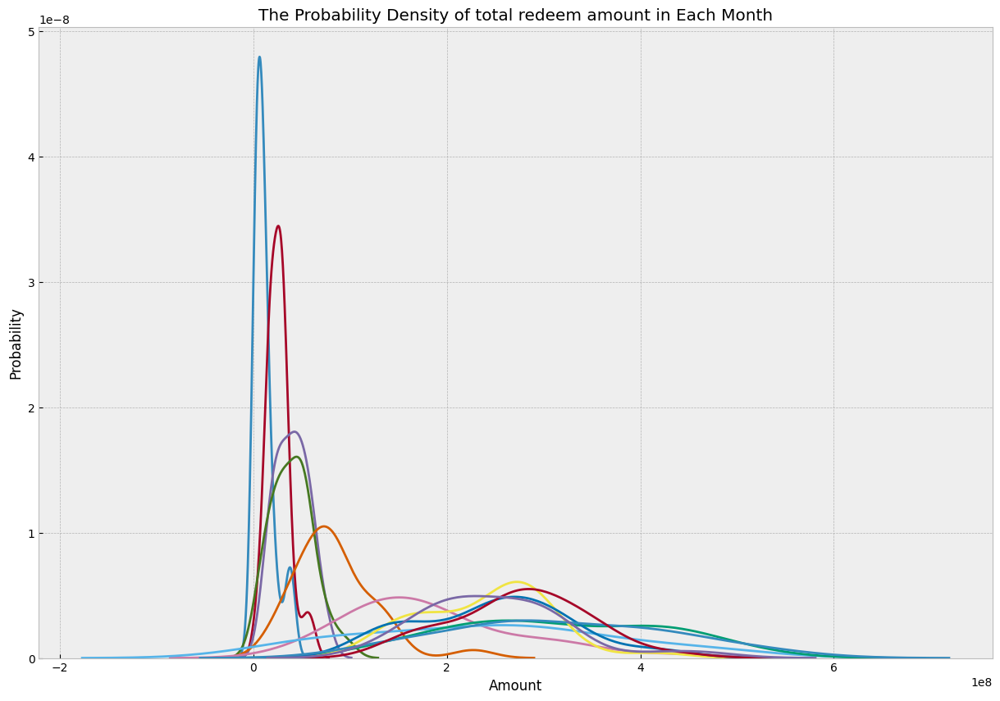

In [ ]:
# Plot the KDE (Kernel Density Estimate) for total redeem amount by month

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total redeem amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_redeem_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')

The probability density distribution of total purchase (or redeem) amounts for each month is shown:

- In July 2013 (13Y, 7M), the peak is the highest, indicating that the total purchase amounts in this month are concentrated around a specific value more frequently. Most other months have lower peaks and wider distributions, suggesting that purchase amounts are more spread out during those months.

- Months like August 2013 (13Y, 8M) and September 2013 (13Y, 9M) also show relatively high peaks, indicating more consistent purchase behavior, with total purchase amounts concentrated around similar values. In contrast, months like February 2014 (14Y, 2M) and April 2014 (14Y, 4M) show lower and broader peaks, indicating a wider distribution of purchase amounts, potentially due to more variability in the purchase amounts.

- Comparing the density distribution between the second half of 2013 and the first half of 2014, it can be observed that the peaks generally become lower and broader, which may indicate increased variability in purchase amounts or a shift in purchasing behavior over time.


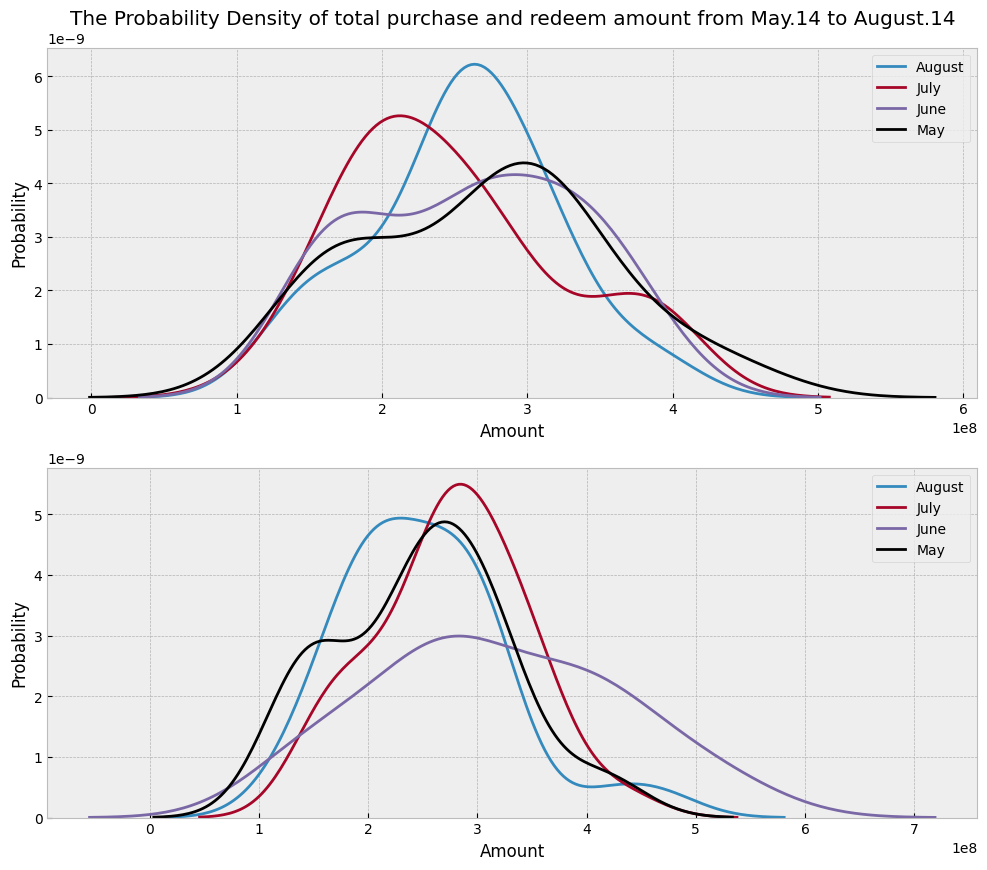

In [ ]:
# Plot the KDE for total purchase amount for May, June, July, and August 2014

plt.figure(figsize=(12,10))

ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from May.14 to August.14')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_purchase_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_purchase_amt'],color='Black',label='May')
plt.legend()
ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_redeem_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_redeem_amt'],color='Black',label='May')
plt.legend()

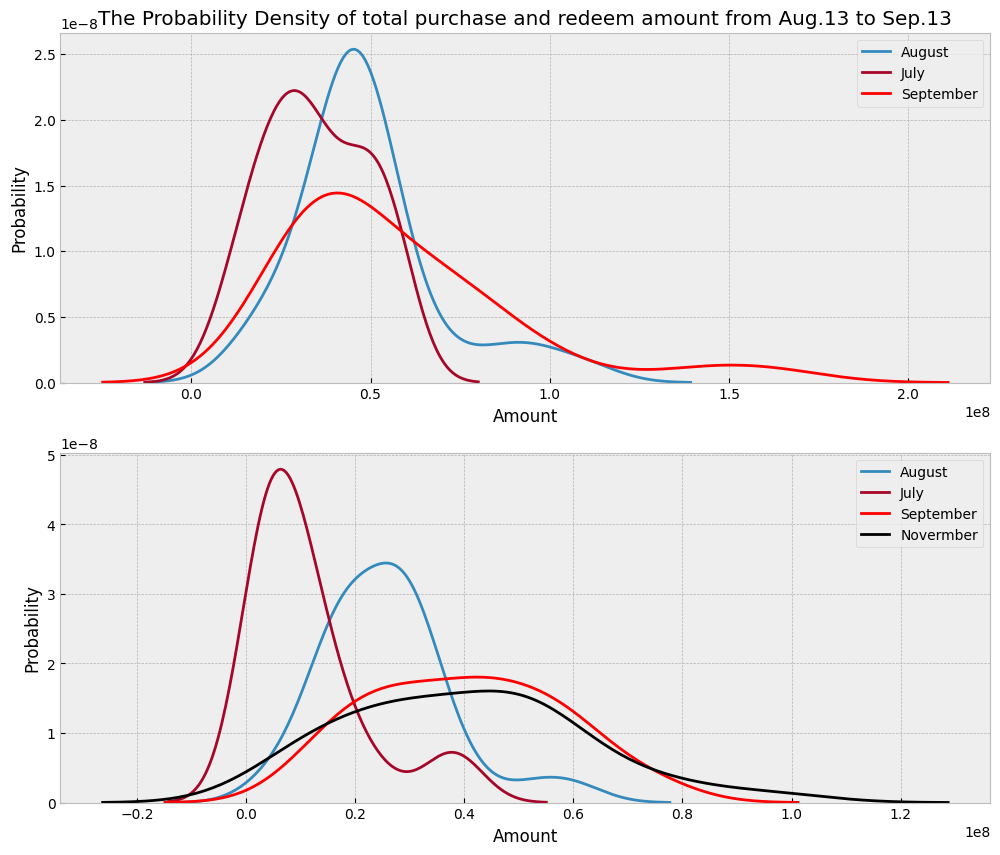

In [ ]:
# Plot the KDE for total purchase amount for August and September 2013

total_balance_last_7 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/7/1')) & (total_balance['date'] < pd.to_datetime('2013/8/1'))]
total_balance_last_8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/8/1')) & (total_balance['date'] < pd.to_datetime('2013/9/1'))]
total_balance_last_9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/1')) & (total_balance['date'] < pd.to_datetime('2013/10/1'))]
total_balance_last_10 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/10/1')) & (total_balance['date'] < pd.to_datetime('2013/11/1'))]
plt.figure(figsize=(12,10))
ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from Aug.13 to Sep.13')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_purchase_amt'],color='Red',label='September')
plt.legend()

ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_redeem_amt'],color='Red',label='September')
ax = sns.kdeplot(total_balance_last_10['total_redeem_amt'],color='Black',label='Novermber')
plt.legend()

## 1.4)Date Feature Analysis

In [ ]:
# Aggregate dataset by day

day_sta = total_balance_2[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()

Text(0.5, 1.0, 'The total Purchase in Aug.14')

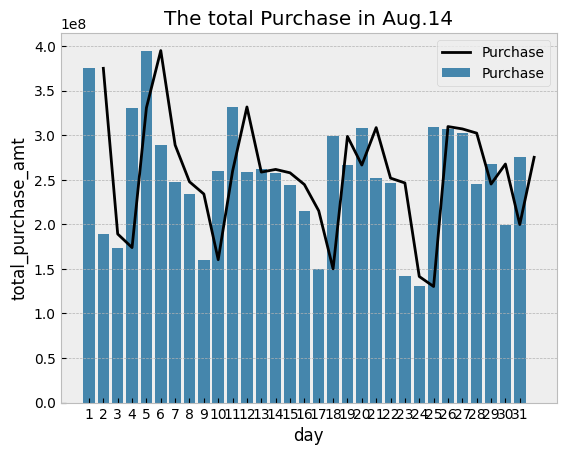

In [ ]:
# Get a bar chart of the monthly purchase distribution after aggregation.

ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
ax.legend()
plt.title("The total Purchase in Aug.14")

Text(0.5, 1.0, 'The total Redeem in Aug.14')

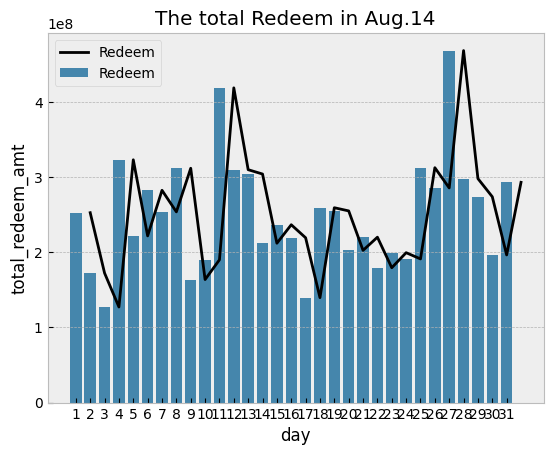

In [ ]:
# Get a bar chart of the monthly redemption distribution after aggregation.

ax = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem')
ax = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')
ax.legend()
plt.title("The total Redeem in Aug.14")

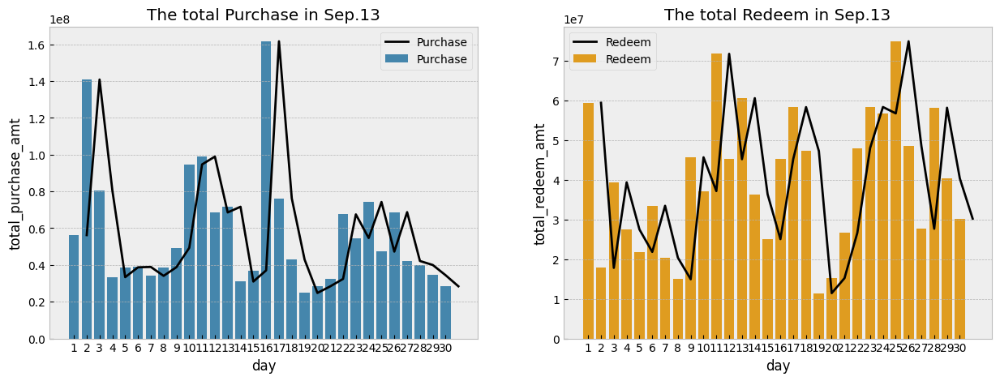

In [ ]:
# Draw the distribution plot for September 2013.

plt.figure(figsize=(15,5))
day_sta = total_balance_last_9[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()
plt.subplot(1,2,1)
plt.title("The total Purchase in Sep.13")
ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
plt.subplot(1,2,2)
plt.title("The total Redeem in Sep.13")
bx = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'orange')
bx = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')

**We observed some weekly characteristics in last year's September data:**

There are a few peculiarities in September:

- **Day 1**
- **Day 2**
- **Day 16** (a lot of purchases) — three days before the Mid-Autumn Festival and a Monday.
- **Days 11 and 25** (both Wednesdays, with a large amount of redemptions).
- **Days 18, 19, and 20** (very low redemption and purchase amounts).

Text(100.58333333333333, 0.5, 'week')

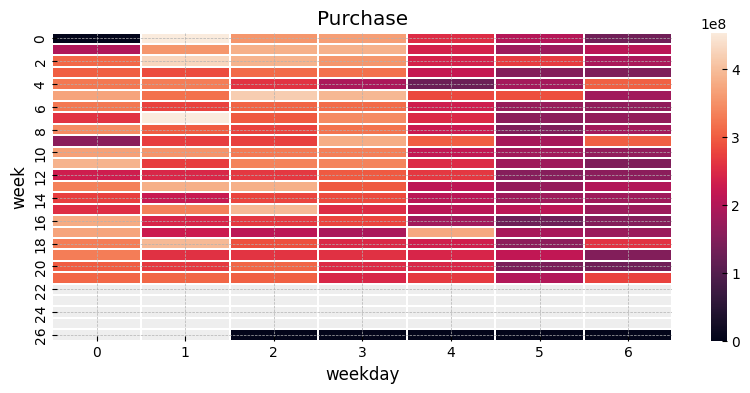

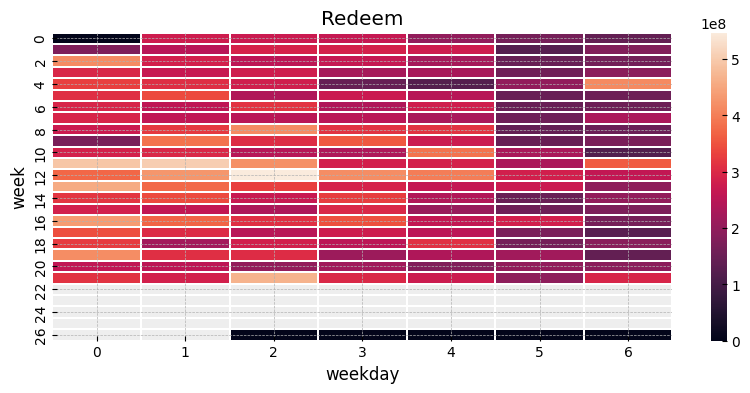

In [ ]:
# Plot the heatmap for all historical days

# Ensure that the 'week' and 'weekday' columns are integers
total_balance_1['week'] = total_balance_1['week'].astype(int)
total_balance_1['weekday'] = total_balance_1['weekday'].astype(int)

# Create heatmap for purchase amounts
test_purchase = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_purchase[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_purchase_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_purchase, linewidths=0.1, ax=ax)
ax.set_title("Purchase")
ax.set_xlabel('weekday')
ax.set_ylabel('week')

# Create heatmap for redemption amounts
test_redeem = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_redeem[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_redeem_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_redeem, linewidths=0.1, ax=ax)
ax.set_title("Redeem")
ax.set_xlabel('weekday')
ax.set_ylabel('week')


**From the heatmap, we can observe that Week 4 and Saturday (weekday 6) are particularly unusual, as well as Week 12 and Tuesday (weekday 2).**

In [ ]:
# Data analysis for anomalies in the heatmap (Part 1)

total_balance_1[(total_balance_1['week'] == 4 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 6)]


,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
307,2014-05-04,303087562.0000,413222034.0000,4,5,2014,18,6


**May 4th is a special day in China, as it is the first working day after Labor Day.**  


In [ ]:
# Data analysis for anomalies in the heatmap (Part 2)

total_balance_1[(total_balance_1['week'] == 12 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 2)]

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
359,2014-06-25,264663201.0000,547295931.0000,25,6,2014,26,2



On **2016-06-25**, the user redemption amount far exceeded the purchase amount.

## 1.5) Analysis of Holidays

- Qingming Festival (April 5 - April 7)
- Labor Day Holiday (May 1 - May 5)
- Dragon Boat Festival (May 31 - June 2)
- Mid-Autumn Festival (September 6 - September 8)

- Mother's Day (May 13)
- Father's Day (June 17)
- Tmall Shopping Festival (June 18)
- Teacher's Day (September 9)

In [ ]:
# Obtain holiday data and plot the mean for holidays and regular days

qingming = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/5')) & (total_balance['date'] < pd.to_datetime('2014/4/8'))]
labour = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/5/4'))]
duanwu = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/31')) & (total_balance['date'] < pd.to_datetime('2014/6/3'))]
data618 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/10')) & (total_balance['date'] < pd.to_datetime('2014/6/20'))]

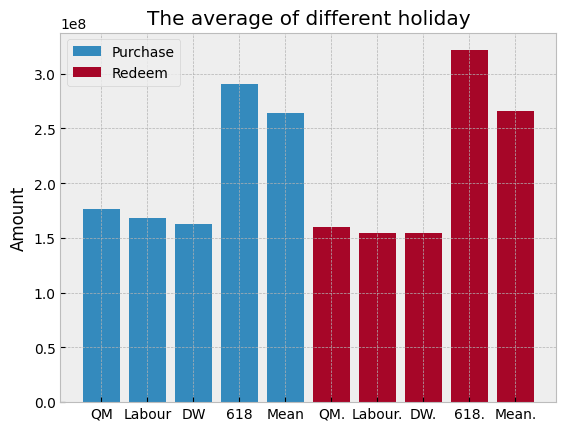

In [ ]:
# Analyze the dates surrounding the holidays.

fig = plt.figure()
index_list = ['QM','Labour','DW','618','Mean']
label_list = [np.mean(qingming['total_purchase_amt']), np.mean(labour['total_purchase_amt']),np.mean(duanwu['total_purchase_amt']),np.mean(data618['total_purchase_amt']),np.mean(total_balance_1['total_purchase_amt'])]
plt.bar(index_list, label_list, label="Purchase")

index_list = ['QM.','Labour.','DW.','618.','Mean.']
label_list = [np.mean(qingming['total_redeem_amt']), np.mean(labour['total_redeem_amt']),np.mean(duanwu['total_redeem_amt']),np.mean(data618['total_redeem_amt']),np.mean(total_balance_1['total_redeem_amt'])]
plt.bar(index_list, label_list, label="Redeem")
plt.title("The average of different holiday")
plt.ylabel("Amount")
plt.legend()
plt.show()

## 1.6)**Analysis of the dates surrounding holidays**

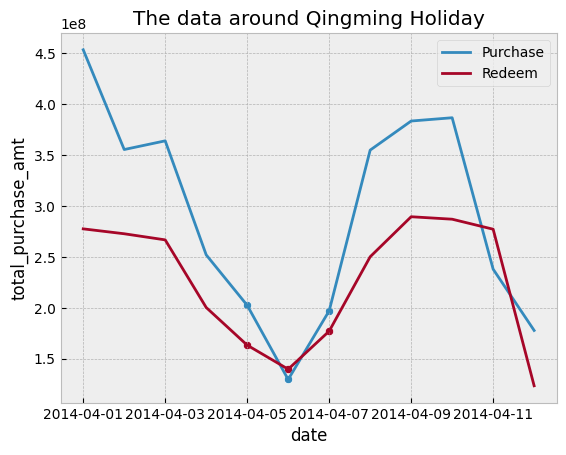

In [ ]:
# Draw time series plots for Qingming Festival with it surrounding dates.

qingming_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/1')) & (total_balance['date'] < pd.to_datetime('2014/4/13'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=qingming_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=qingming_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=qingming, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=qingming, ax=ax)
plt.title("The data around Qingming Holiday")
ax.legend()

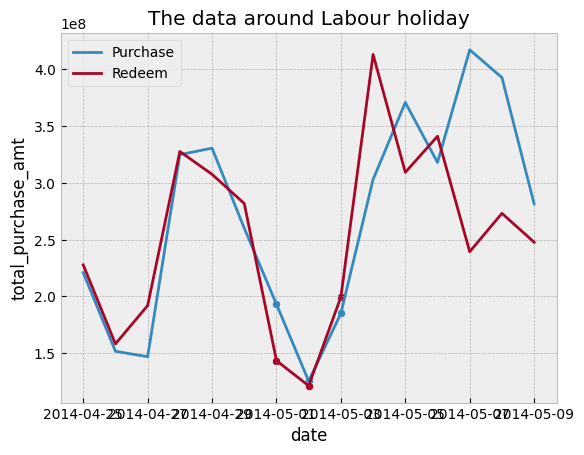

In [ ]:
# Draw time series plots for Labor Day with it surrounding dates.

labour_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/25')) & (total_balance['date'] < pd.to_datetime('2014/5/10'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=labour_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=labour_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=labour, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=labour, ax=ax)
plt.title("The data around Labour holiday")
ax.legend()

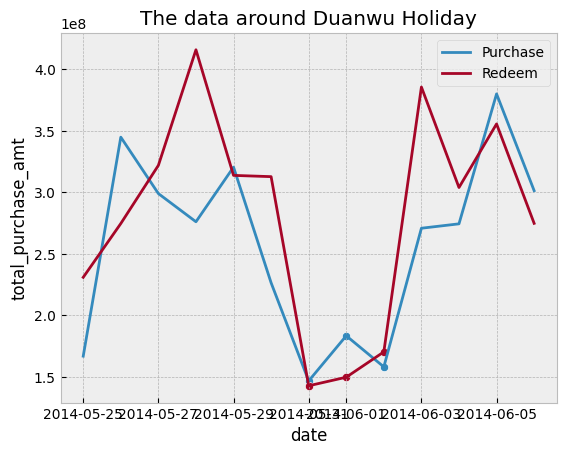

In [ ]:
# Draw time series plots for Dragon Boat Festival with it surrounding dates

duanwu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/25')) & (total_balance['date'] < pd.to_datetime('2014/6/7'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=duanwu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=duanwu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=duanwu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=duanwu, ax=ax)
plt.title("The data around Duanwu Holiday")
ax.legend()

## 1.7)**Analysis of outliers**

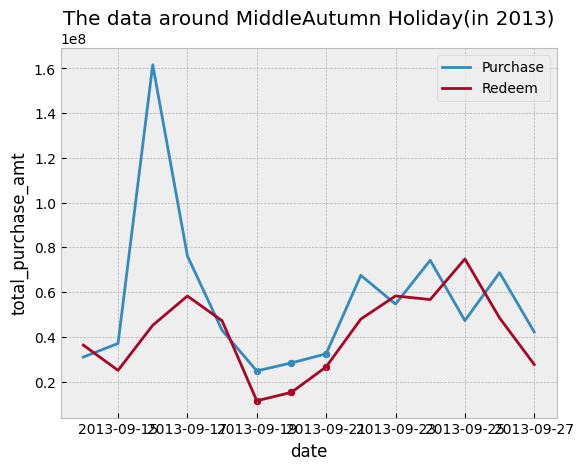

In [ ]:
# Draw time series plots for MiddleAutumn Holiday with it surrounding dates.

zhongqiu = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/19')) & (total_balance['date'] < pd.to_datetime('2013/9/22'))]
zhongqiu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/14')) & (total_balance['date'] < pd.to_datetime('2013/9/28'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=zhongqiu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=zhongqiu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=zhongqiu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=zhongqiu, ax=ax)
plt.title("The data around MiddleAutumn Holiday(in 2013)")
ax.legend()

Text(0.5, 1.0, 'The abnormal value of total purchase')

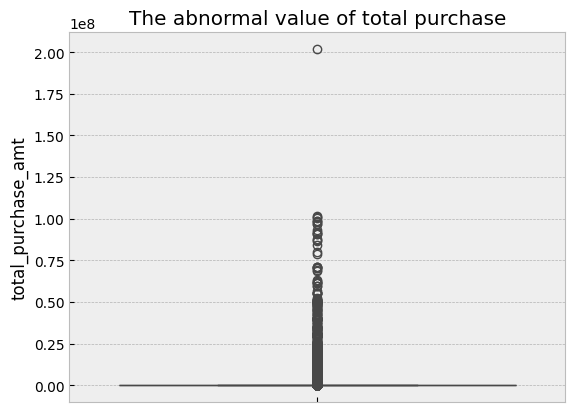

In [ ]:
# Plot the boxplot of user transaction records

sns.boxplot(balance_data['total_purchase_amt'])
plt.title("The abnormal value of total purchase")

In [ ]:
# Analyze the transaction behavior of users who made a purchase of 2e8

balance_data[balance_data['user_id'] == 14592].sort_values(by = ['report_date','total_redeem_amt'],ascending = [True,False]).head()

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday
1453312,14592,20131101,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2013-11-01,1,11,2013,44,4
1453311,14592,20131104,99457728,0,201768328,201768328,201275171,493157,102310600,0,102310600,0,102310600,0,NaN,NaN,NaN,NaN,2013-11-04,4,11,2013,45,0
1453313,14592,20131105,97458675,99457728,4899446,4899446,4899446,0,6898499,0,6898499,0,6898499,0,NaN,NaN,NaN,NaN,2013-11-05,5,11,2013,45,1
1453210,14592,20131106,97662610,97458675,203935,191347,0,191347,0,0,0,0,0,12588,NaN,NaN,NaN,NaN,2013-11-06,6,11,2013,45,2
1453310,14592,20131107,97675216,97662610,12606,0,0,0,0,0,0,0,0,12606,NaN,NaN,NaN,NaN,2013-11-07,7,11,2013,45,3


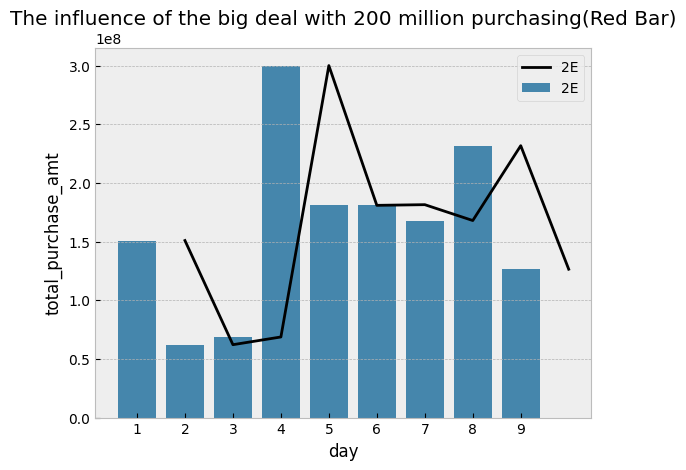

In [ ]:
# Plot the total transaction volume on the day with a single transaction of 2e8 and the transaction volumes for the surrounding days

e2 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/11/1')) & (total_balance['date'] < pd.to_datetime('2013/11/10'))]
ax = sns.barplot(x="day", y="total_purchase_amt", data=e2, label='2E')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=e2, label='2E', color = 'k')
plt.title("The influence of the big deal with 200 million purchasing(Red Bar)")
ax.legend()

Text(0.5, 1.0, 'The Biggest deal happend in each day')

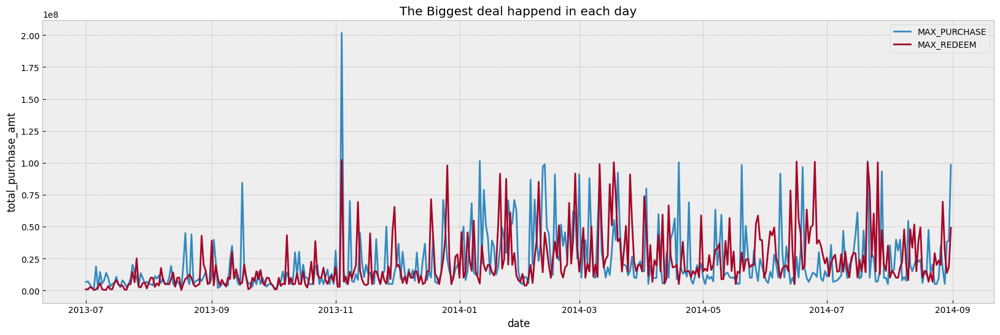

In [ ]:
# Plot the time series of the largest single transaction per day

plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
plt.title("The Biggest deal happend in each day")

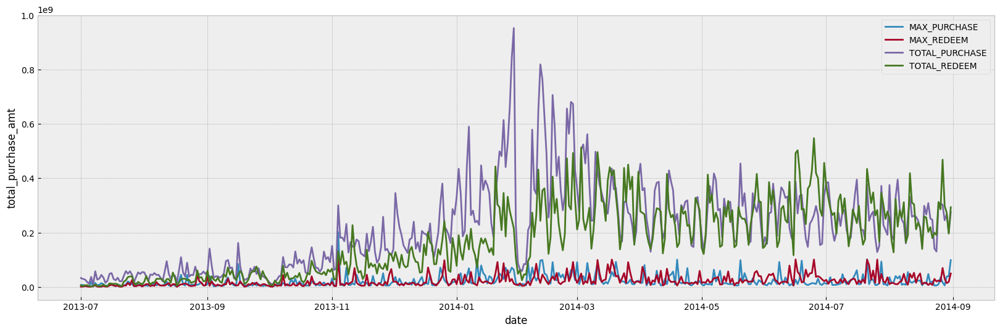

In [ ]:
# Plot the time series of the largest single transaction per day and the total transaction amount
plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_REDEEM')

Text(0.5, 1.0, 'The frequency of super big deal(larger than 100million) in each month')

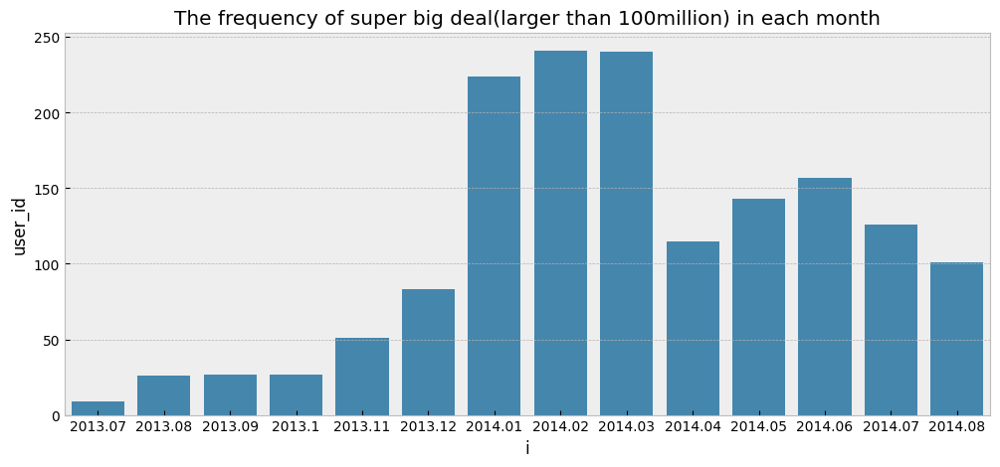

In [ ]:
#Plot the frequency histogram of large transactions for each month

big_frequancy = balance_data[(balance_data['total_purchase_amt'] > 10000000) | (balance_data['total_redeem_amt'] > 10000000)][['month','year','user_id']].groupby(['year','month'], as_index=False).count()
big_frequancy['i'] = big_frequancy['year']  + big_frequancy['month'] / 100
plt.figure(figsize = [12,5])
ax = sns.barplot(x="i", y="user_id", data=big_frequancy)
plt.title("The frequency of super big deal(larger than 100million) in each month")

In [ ]:
# Obtain the dataset of large transactions

balance_data['big_purchase'] = 0
balance_data.loc[balance_data['total_purchase_amt'] > 1000000, 'big_purchase'] = 1
balance_data['big_redeem'] = 0
balance_data.loc[balance_data['total_redeem_amt'] > 1000000, 'big_redeem'] = 1

In [ ]:
# Aggregate large transactions by day

big_purchase = balance_data[balance_data['big_purchase'] == 1].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
small_purchase = balance_data[balance_data['big_purchase'] == 0].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
big_redeem = balance_data[balance_data['big_redeem'] == 1].groupby(['date'], as_index=False)['total_redeem_amt'].sum()
small_redeem = balance_data[balance_data['big_redeem'] == 0].groupby(['date'], as_index=False)['total_redeem_amt'].sum()

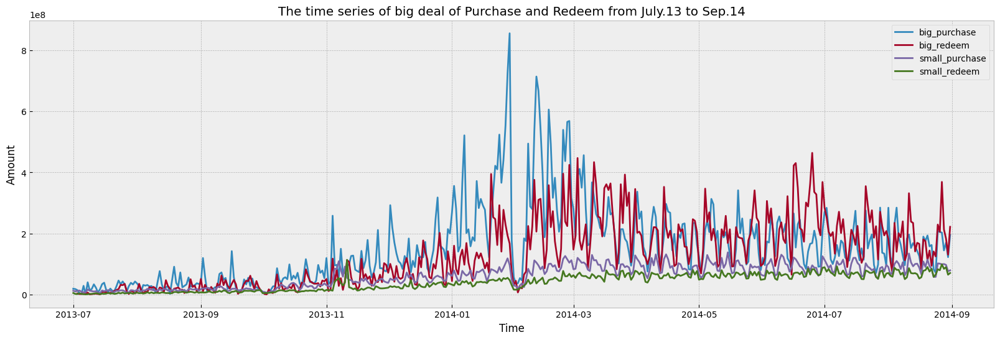

In [ ]:
# Plot the time series distribution of large and small transactions

fig = plt.figure(figsize=(20,6))
plt.plot(big_purchase['date'], big_purchase['total_purchase_amt'],label='big_purchase')
plt.plot(big_redeem['date'], big_redeem['total_redeem_amt'],label='big_redeem')

plt.plot(small_purchase['date'], small_purchase['total_purchase_amt'],label='small_purchase')
plt.plot(small_redeem['date'], small_redeem['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big deal of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

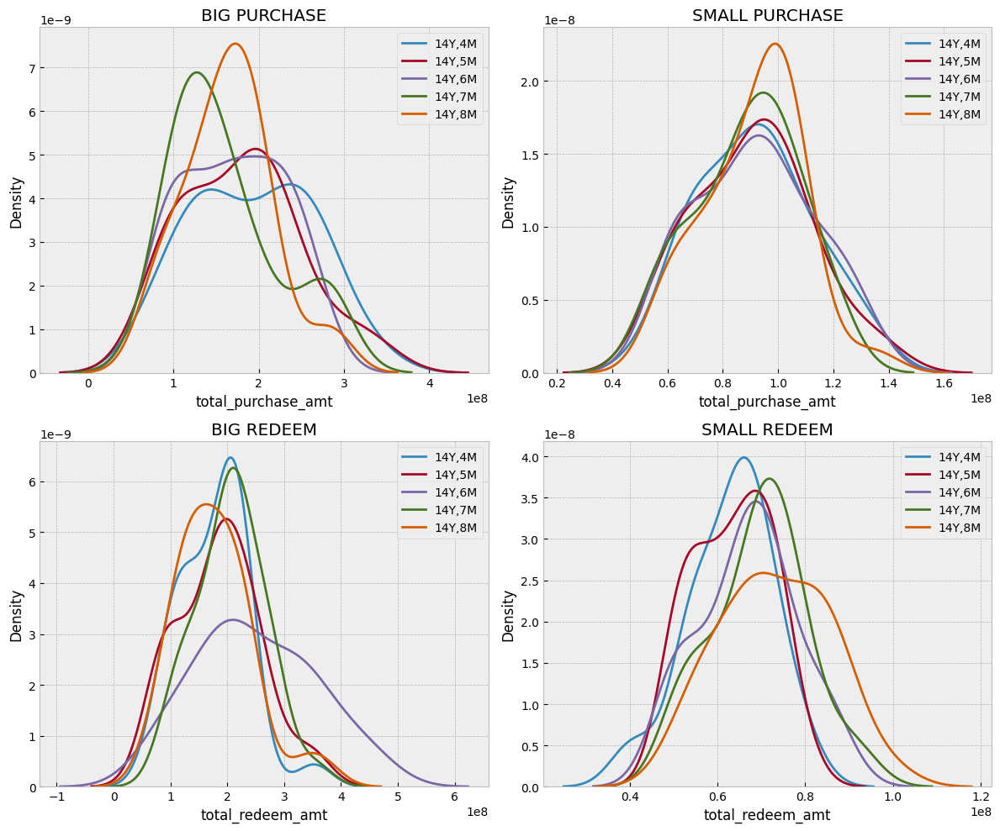

In [ ]:
# Plot the distribution estimation for large and small transactions
plt.figure(figsize=(12,10))

plt.subplot(2,2,1)
for i in range(4, 9):
    sns.kdeplot(big_purchase[(big_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG PURCHASE')
plt.legend()

plt.subplot(2,2,2)
for i in range(4, 9):
    sns.kdeplot(small_purchase[(small_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL PURCHASE')
plt.legend()

plt.subplot(2,2,3)
for i in range(4, 9):
    sns.kdeplot(big_redeem[(big_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG REDEEM')
plt.legend()

plt.subplot(2,2,4)
for i in range(4, 9):
    sns.kdeplot(small_redeem[(small_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL REDEEM')
plt.legend()

plt.tight_layout()
plt.show()

1. **Big Purchases**:
   - There are clear peaks in the distribution of large purchase amounts across different months, with most peaks concentrated between 100 million and 200 million.
   - The distribution varies slightly by month. Some months (such as May 2014 and June 2014) show higher peaks, indicating more concentrated large purchase activity in those months.
   - Large purchases in April 2014 and August 2014 have more dispersed distributions, suggesting greater variability in large purchase amounts during those months.

2. **Small Purchases**:
   - The distribution of small purchase amounts across months is more concentrated, with most peaks around 80 million to 100 million.
   - Small purchase behavior is relatively consistent across different months, with a more concentrated distribution and no significant long-tail phenomenon.

3. **Big Redemptions**:
   - There are clear peaks in the distribution of large redemption amounts across different months, with most peaks concentrated between 200 million and 300 million.
   - The distribution varies significantly by month. Large redemptions in April 2014 show a clear peak, while August 2014 displays a more dispersed distribution.
   - Large redemptions in June 2014 and July 2014 show consistent behavior, with a more concentrated distribution.

4. **Small Redemptions**:
   - The distribution of small redemption amounts across months is more concentrated, with most peaks around 60 million to 80 million.
   - Small redemption behavior is relatively consistent across months, with a concentrated distribution and no significant long-tail effect.

Overall, the analysis of large and small transaction distributions reveals:

- Large transactions (both purchases and redemptions) show more dispersed distributions and higher peaks, indicating greater fluctuations in large transaction amounts across different months.
- Small transactions show more concentrated distributions and lower peaks, indicating smaller variability in transaction amounts across months.
- Certain months' large transactions (such as large redemptions in April 2014 and large purchases in May 2014) exhibit more concentrated activity, possibly due to market conditions or external factors at that time.

In [ ]:
# Add timestamp

big_purchase['weekday'] = big_purchase['date'].dt.weekday
small_purchase['weekday'] = small_purchase['date'].dt.weekday
big_redeem['weekday'] = big_redeem['date'].dt.weekday
small_redeem['weekday'] = small_redeem['date'].dt.weekday

Text(0.5, 1.0, 'SMALL REDEEM')

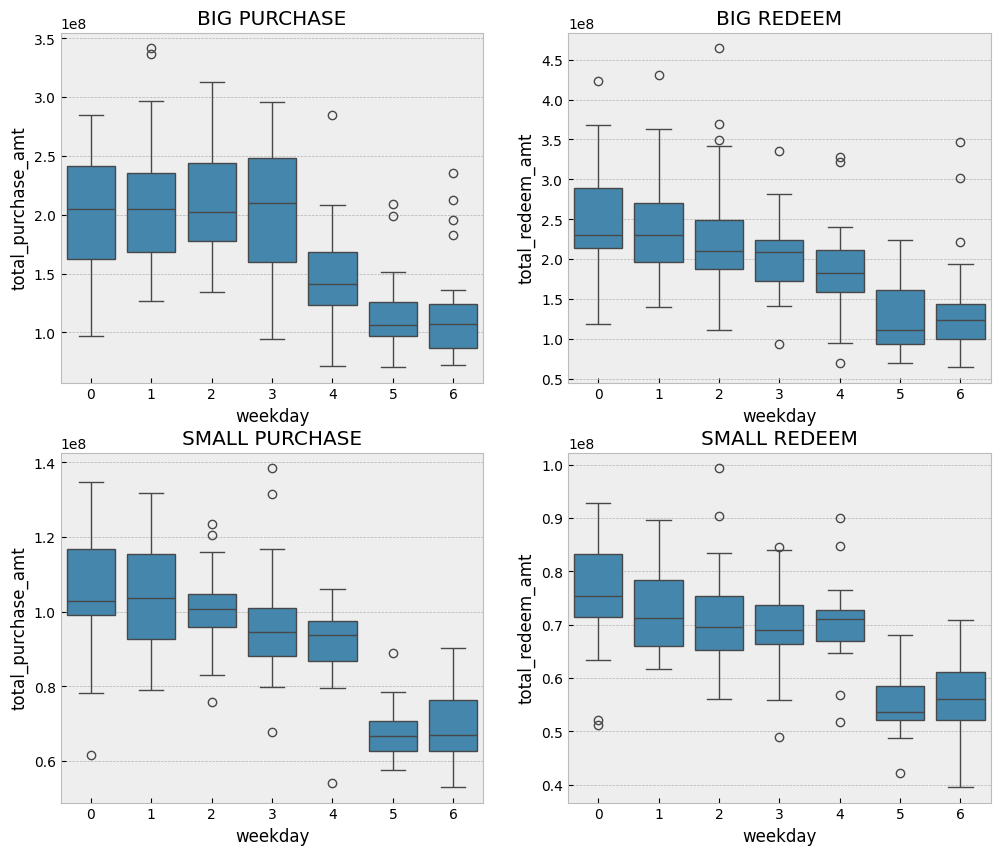

In [ ]:
# Analyze the next-day distribution for large and small transactions

plt.figure(figsize=(12, 10))

ax = plt.subplot(2,2,1)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=big_purchase[big_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG PURCHASE')

ax = plt.subplot(2,2,2)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=big_redeem[big_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG REDEEM')

ax = plt.subplot(2,2,3)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=small_purchase[small_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL PURCHASE')

ax = plt.subplot(2,2,4)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=small_redeem[small_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL REDEEM')

## 1.8)Analyze other variables in the user transaction records table

In [ ]:
# Trim the dataset

data_balance_1 = balance_data[balance_data['date'] > pd.to_datetime('2014/4/1')]

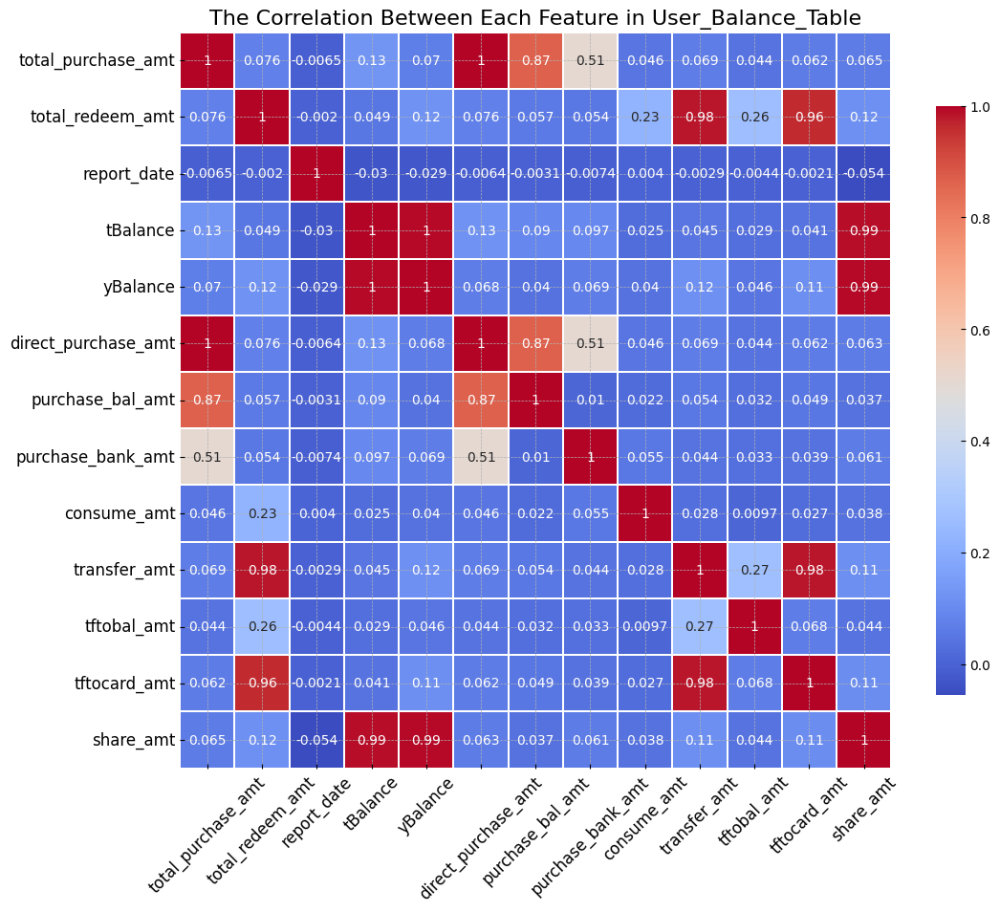

In [ ]:
# Plot the correlation between other variables in the user transaction records table and the labels

feature = ['total_purchase_amt','total_redeem_amt', 'report_date', 'tBalance', 'yBalance',
       'direct_purchase_amt', 'purchase_bal_amt', 'purchase_bank_amt',
        'consume_amt', 'transfer_amt', 'tftobal_amt',
       'tftocard_amt', 'share_amt']

# Calculate the correlation matrix of the features
corr = data_balance_1[feature].corr()

# Set the size of the plot
plt.figure(figsize=(12, 10))

# Use a more aesthetically pleasing color palette, and set the annotation font size
sns.heatmap(corr, linewidths=0.1, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})

# Set the title and axis label font sizes
plt.title("The Correlation Between Each Feature in User_Balance_Table", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.show()

## 1.9)Analysis of bank interest rates

In [ ]:
# Read bank interest rates and add a timestamp

bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', info = False)
bank = bank.rename(columns = {'mfd_date': 'date'})
bank_features = [x for x in bank.columns if x not in ['date']]
bank['date'] = pd.to_datetime(bank['date'], format= "%Y%m%d")
bank['day'] = bank['date'].dt.day
bank['month'] = bank['date'].dt.month
bank['year'] = bank['date'].dt.year
bank['week'] = bank['date'].dt.isocalendar().week
bank['weekday'] = bank['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ
To: /content/downloaded_file.csv
100%|██████████| 19.5k/19.5k [00:00<00:00, 23.2MB/s]


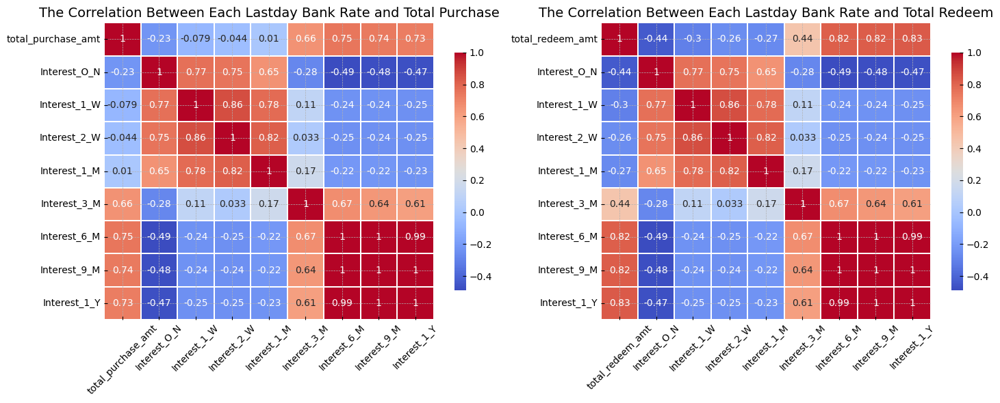

In [ ]:
# Plot the correlation between the previous day's bank and Alipay interest rates and the labels

bank['last_date'] = bank['date'] + datetime.timedelta(days=-1)

# Set the plot size
plt.figure(figsize=(15, 6))

# Subplot 1: Correlation between the previous day's bank interest rate and total purchase amount
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Subplot 2: Correlation between the previous day's bank interest rate and total redemption amount
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

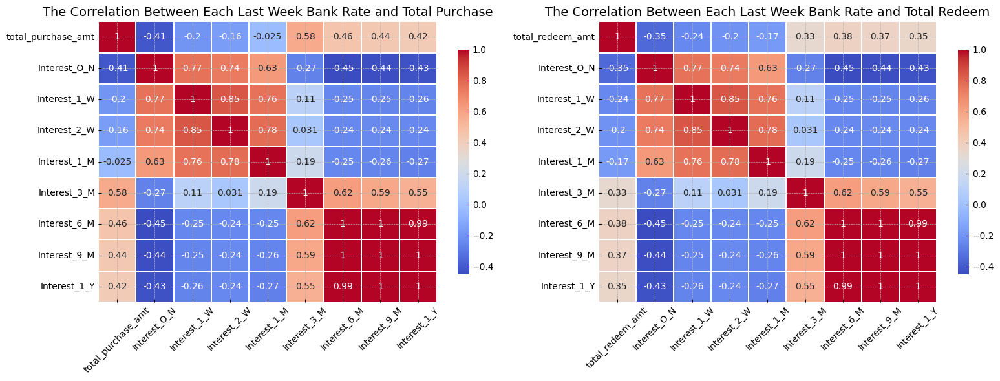

In [ ]:
# Plot the correlation between the previous week's bank and Alipay interest rates and the labels

bank['last_week'] = bank['week'] - 1

# Set the plot size
plt.figure(figsize=(16, 6))

# Subplot 1: Correlation between the previous week's bank interest rate and total purchase amount
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Subplot 2: Correlation between the previous week's bank interest rate and total redemption amount
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

Text(0, 0.5, 'Rate')

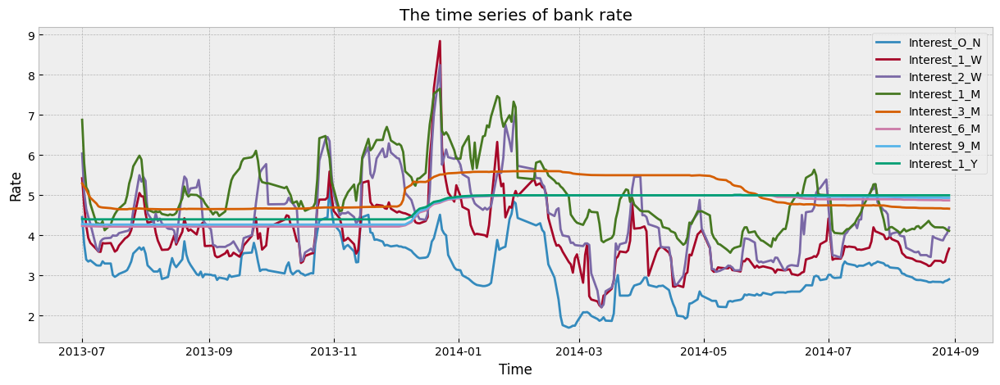

In [ ]:
# Plot the time series of bank interest rates

plt.figure(figsize=(15,5))
for i in bank_features:
    plt.plot(bank['date'], bank[[i]] ,label=i)
plt.legend()
plt.title("The time series of bank rate")
plt.xlabel("Time")
plt.ylabel("Rate")

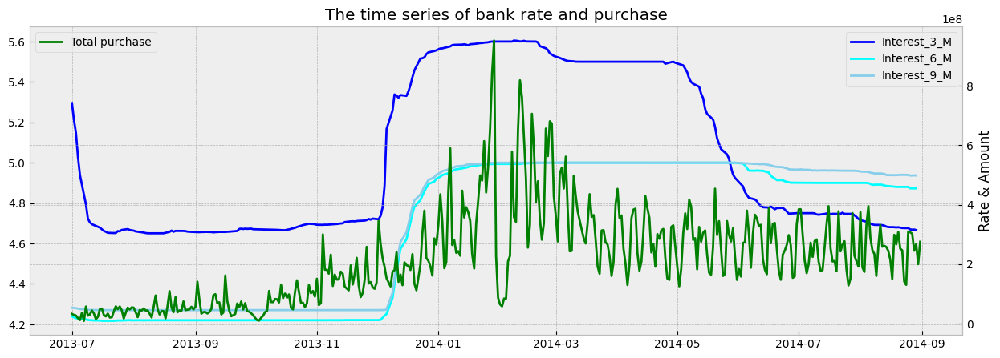

In [ ]:
# Plot the time series of certain bank interest rates and purchase amounts

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")

plt.legend(loc=2)
plt.title("The time series of bank rate and purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")
plt.show()

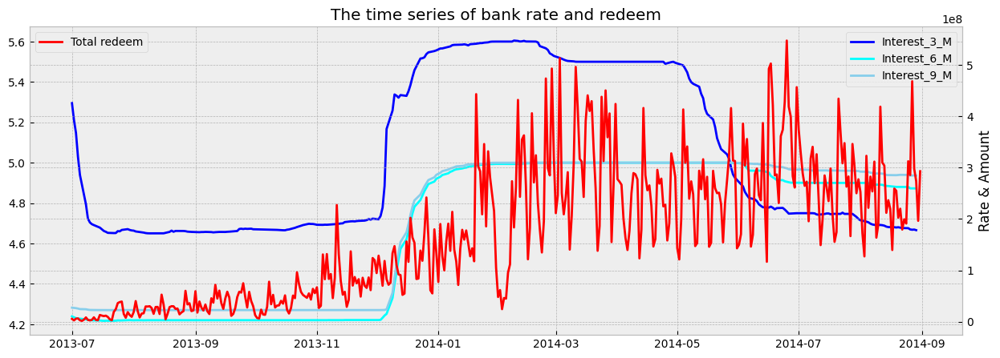

In [ ]:
# Plot the time series of certain bank interest rates and redemption amounts

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'r',label="Total redeem")

plt.legend(loc=2)
plt.title("The time series of bank rate and redeem")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

## 1.10) Analysis of Alipay interest rates

In [ ]:
# Read Alipay interest rates and add a timestamp

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: /content/downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 16.6MB/s]


<Axes: >

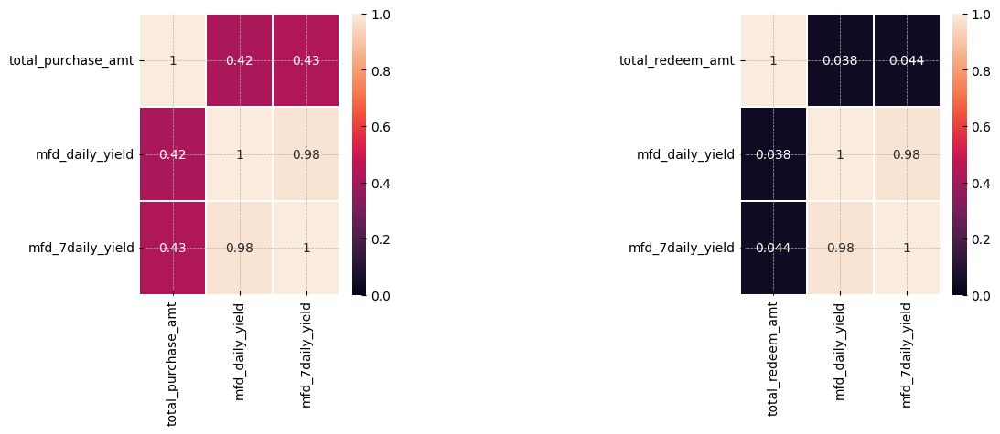

In [ ]:
# Plot the correlation between Alipay interest rates and the labels

share['last_date'] = share['date'] + datetime.timedelta(days=-1)
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

<Axes: >

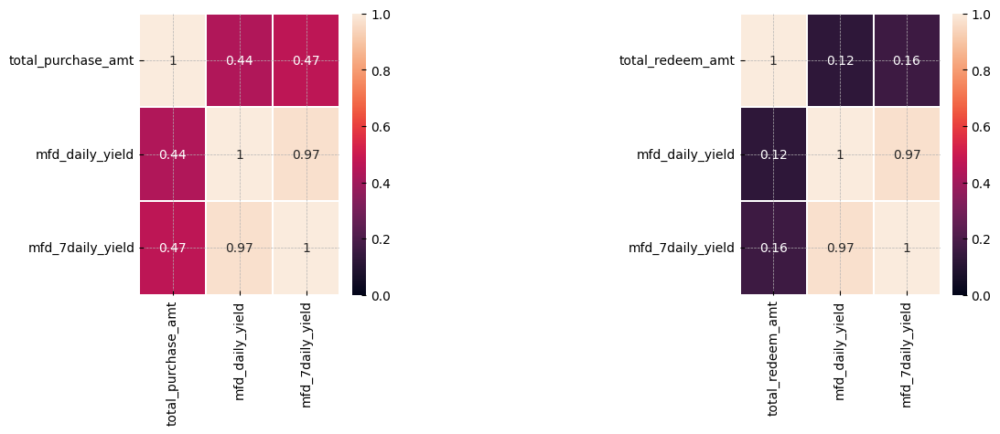

In [ ]:
# Plot the correlation between bank interest rates and the labels

share['last_week'] = share['week'] - 1
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

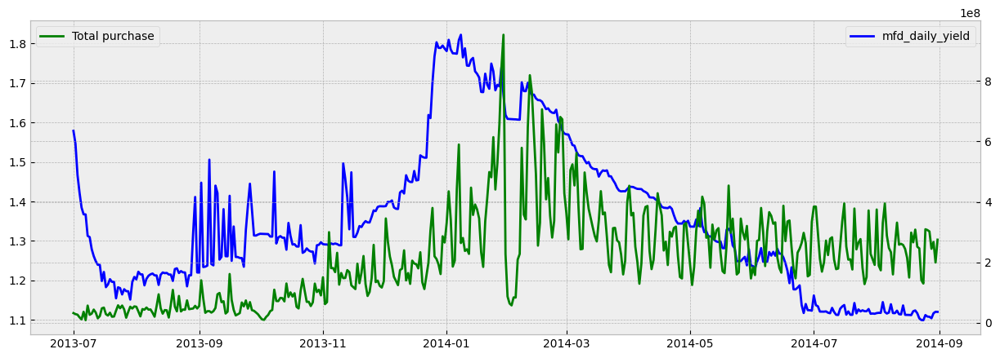

In [ ]:
# Plot the time series of Alipay interest rates and purchase amounts

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")
plt.legend(loc=2)
plt.show()

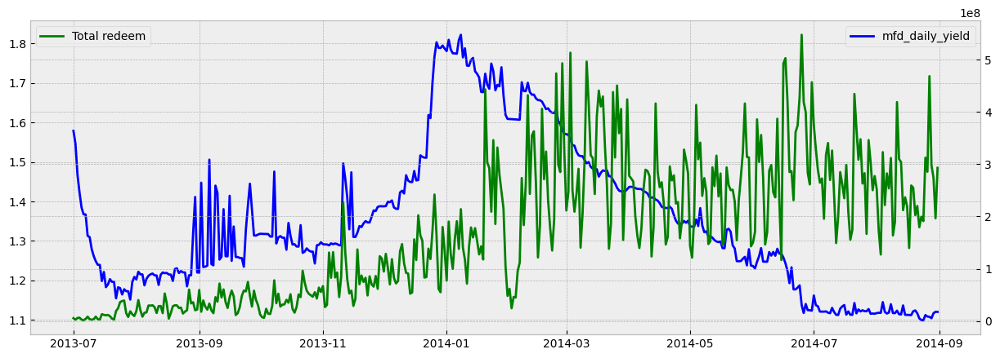

In [ ]:
# Plot the time series of Alipay interest rates and redemption amounts

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'g',label="Total redeem")
plt.legend(loc=2)
plt.show()

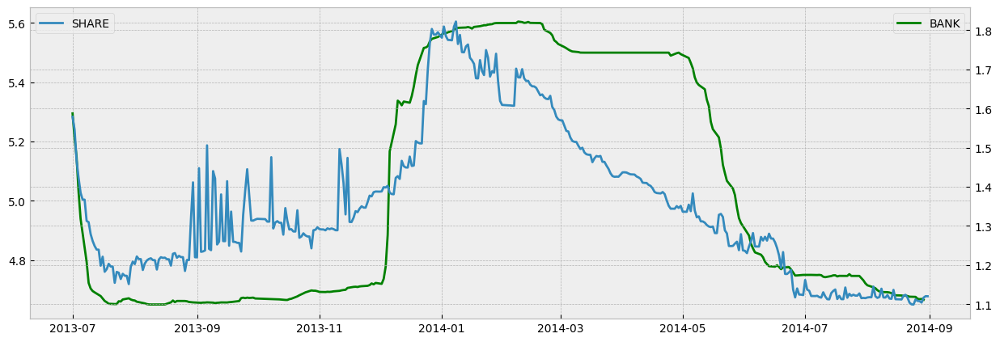

In [ ]:
#Plot the time series of bank interest rates and Alipay interest rates

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],c='g',label= 'BANK')

plt.legend()
ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],label='SHARE')
plt.legend(loc=2)
plt.show()

<br> From the figure, it can be observed that:
- Alipay interest rates seem to have a greater impact on purchase amounts.
- Bank interest rates seem to have a greater impact on redemption amounts.
- The effect of Alipay interest rates is temporary.
- The effect of bank interest rates is long-term.

<br> Based on the above analysis, we can identify the following characteristics:
- The day of the week
- Whether it is a weekend
- Whether it is a holiday
- Time until the next Monday
- Time until the next weekend
- Time until the peak holiday period
- Time from the start of the month
- Time until the end of the month
- Year-on-year weekly average, maximum, and minimum values for the last few months
- Transaction amount on the last day of each month

# step2: Feature Analysis

Note: All amounts are in fen (cents). For example, if a user buys 1 million fen in one day, it means they purchased 10,000 yuan.了1万

## 2.1)Analysis of Large and Small Users
From previous analysis, we can see that certain users have very large transaction amounts, which significantly impact the daily transaction volume. Here, we analyze large users (with transactions greater than 1 million) who remained active after April.

In [ ]:
# Obtain the set of large users

temp = balance_data[(balance_data['total_purchase_amt'] >= 1000000) | (balance_data['total_redeem_amt'] >= 1000000)]
big_users_set = set(temp[temp['date'] >= datetime.datetime(2014,4,1)]['user_id'])

In [ ]:
len(big_users_set)

3903

In [ ]:
balance_data['user_id'].nunique()

28041

There are 3,903 large users, making up 13% of the total.

In [ ]:
# Mark large users.

balance_data['big_user'] = 0
balance_data.loc[balance_data['user_id'].isin(big_users_set), 'big_user'] = 1

In [ ]:
# Analyze the difference in daily total transaction amounts between large and small users.

total_balance_bigNsmall = balance_data.groupby(['date','big_user'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

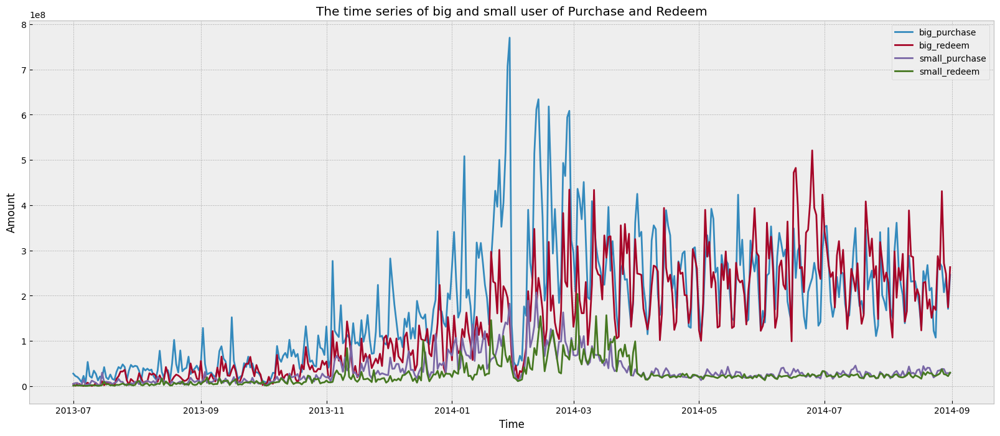

In [ ]:
# Plot the daily total transaction volume for large and small users.

fig = plt.figure(figsize=(20,8))
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt'],label='big_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt'],label='big_redeem')

plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'],label='small_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big and small user of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [ ]:
# Analyze the proportion of total purchase volume contributed by large and small users.

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'])

5.1456178397775805

In [ ]:
# Analyze the proportion of total redemption volume contributed by large and small users

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'])

5.422141272341089

## 2.2)Analyze the frequency of user transactions

In [ ]:
balance_data[balance_data['user_id']==1].sort_values('report_date').head(5)

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday,big_purchase,big_redeem,big_user
93,1,20140320,20111,0,20111,20111,0,20111,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-20,20,3,2014,12,3,0,0,0
59,1,20140321,20111,20111,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-21,21,3,2014,12,4,0,0,0
36,1,20140322,20113,20111,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-22,22,3,2014,12,5,0,0,0
94,1,20140323,20115,20113,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-23,23,3,2014,12,6,0,0,0
60,1,20140324,20117,20115,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-24,24,3,2014,13,0,0,0,0


In [ ]:
# Obtain the set of frequent transaction users

hot_users_set = set(frequency[frequency['freq'] > 30]['user_id'])

In [ ]:
balance_data[balance_data['user_id']==1].sort_values('report_date').head(5)

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday,big_purchase,big_redeem,big_user
93,1,20140320,20111,0,20111,20111,0,20111,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-20,20,3,2014,12,3,0,0,0
59,1,20140321,20111,20111,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-21,21,3,2014,12,4,0,0,0
36,1,20140322,20113,20111,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-22,22,3,2014,12,5,0,0,0
94,1,20140323,20115,20113,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-23,23,3,2014,12,6,0,0,0
60,1,20140324,20117,20115,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-24,24,3,2014,13,0,0,0,0


In [ ]:
# Obtain the transaction records of frequent users

balance_data['is_hot_users'] = 0
balance_data.loc[balance_data['user_id'].isin(hot_users_set) , 'is_hot_users'] = 1

In [ ]:
# Analyze the difference in daily total transaction amounts between frequent and non-frequent users

total_balance_hotNcold = balance_data.groupby(['date','is_hot_users'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

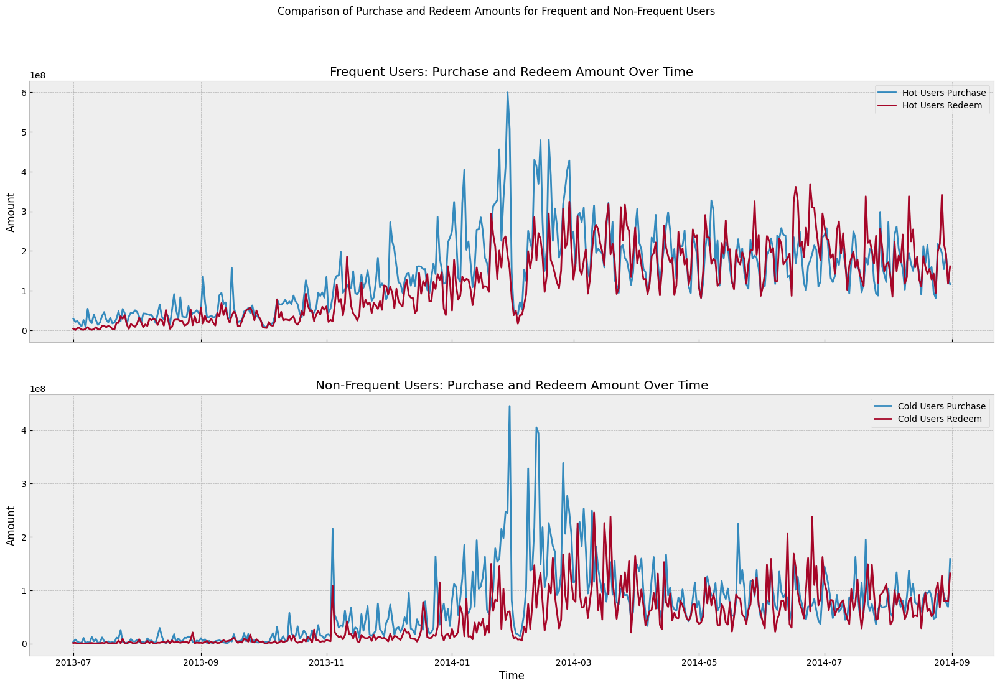

In [ ]:
# Plot the time series of total purchase and redemption amounts for frequent and non-frequent users

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 12), sharex=True)

# Plot the total purchase and redemption amounts for frequent users
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_purchase_amt'], label='Hot Users Purchase')
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_redeem_amt'], label='Hot Users Redeem')
axs[0].legend(loc='best')
axs[0].set_title("Frequent Users: Purchase and Redeem Amount Over Time")
axs[0].set_ylabel("Amount")

# Plot the total purchase and redemption amounts for non-frequent users
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_purchase_amt'], label='Cold Users Purchase')
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_redeem_amt'], label='Cold Users Redeem')
axs[1].legend(loc='best')
axs[1].set_title("Non-Frequent Users: Purchase and Redeem Amount Over Time")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Amount")

plt.suptitle("Comparison of Purchase and Redeem Amounts for Frequent and Non-Frequent Users")
plt.show()

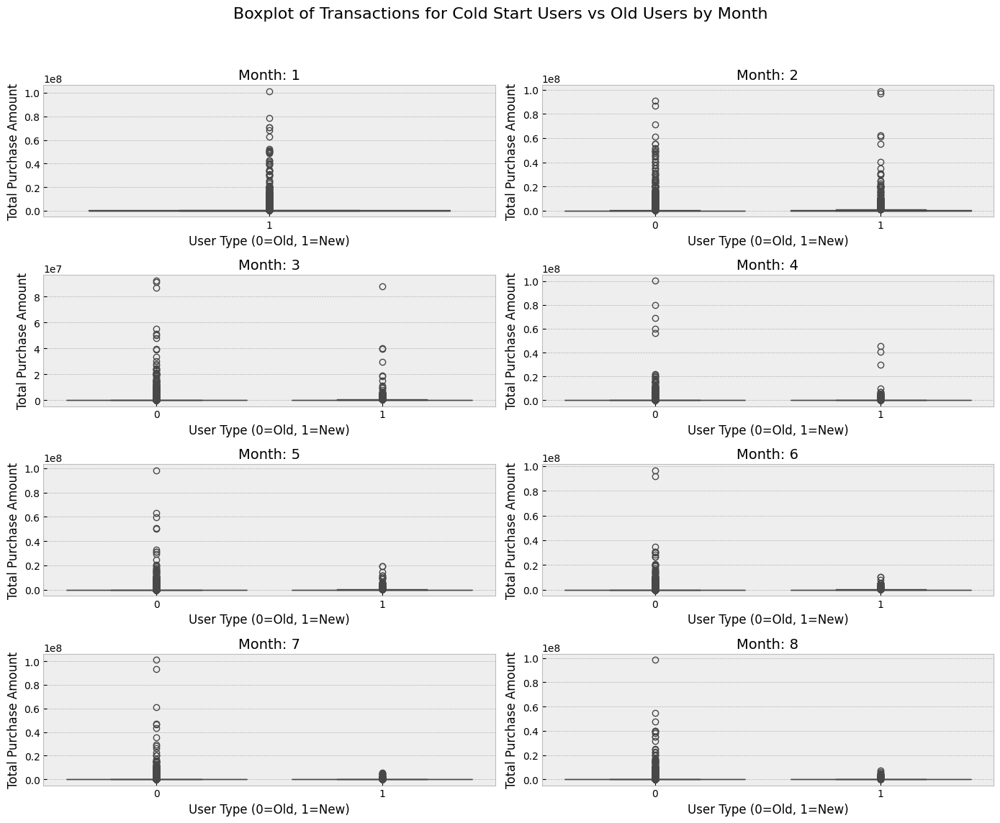

In [ ]:
# Plot the boxplot for transactions of cold-start users vs. old users
# Preprocess data
temp = balance_data[['year', 'month', 'user_id', 'total_purchase_amt', 'total_redeem_amt']].groupby(['year', 'month', 'user_id'], as_index=False).sum()
user_old_set = set()

# Create the plot
plt.figure(figsize=(14, 12))

for i in range(1, 9):
    # Data for the current month
    newset = set(temp[(temp['year'] == 2014) & (temp['month'] == i)]['user_id'])
    this_month = balance_data[(balance_data['year'] == 2014) & (balance_data['month'] == i)]
    this_month['cold'] = 0
    this_month.loc[this_month['user_id'].isin(newset - user_old_set), 'cold'] = 1

    # Create subplots
    ax = plt.subplot(4, 2, i)
    sns.boxplot(x="cold", y="total_purchase_amt", data=this_month[(this_month['direct_purchase_amt'] != 0) | (this_month['total_redeem_amt'] != 0)], ax=ax)

    # Set subplot titles and labels
    ax.set_title(f'Month: {i}', fontsize=14)
    ax.set_xlabel('User Type (0=Old, 1=New)', fontsize=12)
    ax.set_ylabel('Total Purchase Amount', fontsize=12)

    # Update the set of old users
    user_old_set = user_old_set | newset

# Main title
plt.suptitle('Boxplot of Transactions for Cold Start Users vs Old Users by Month', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## 2.3)Analyze other attributes of users

In [ ]:
# Other user attributes
users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', info = False)
users.head()

Downloading...
From: https://drive.google.com/uc?id=1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI
To: /content/downloaded_file.csv
100%|██████████| 746k/746k [00:00<00:00, 63.5MB/s]


,user_id,sex,city,constellation
0,2,1,6411949,狮子座
1,12,1,6412149,摩羯座
2,22,1,6411949,双子座
3,23,1,6411949,双鱼座
4,25,1,6481949,双鱼座


In [ ]:
# Add city, zodiac sign, and gender

balance_data = pd.merge(balance_data, users, on='user_id')

In [ ]:
# balance_data = balance_data.drop('sex_x	city_x constellation_x sex_y city_y constellation_y'.split(), axis=1)

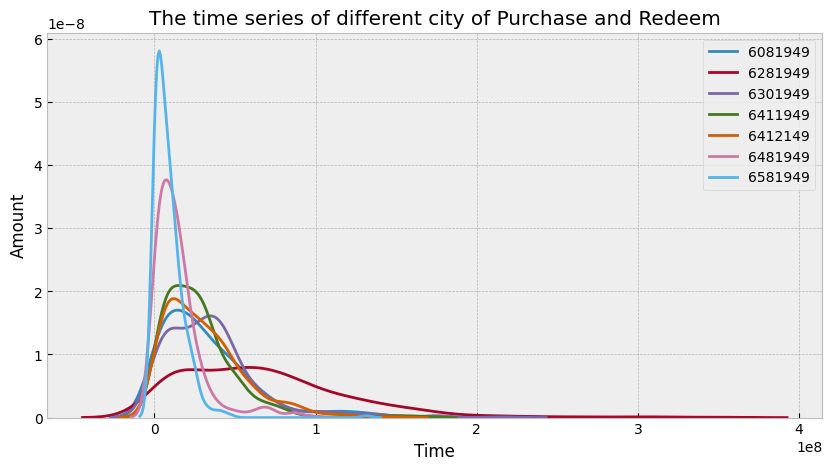

Text(0, 0.5, 'Amount')

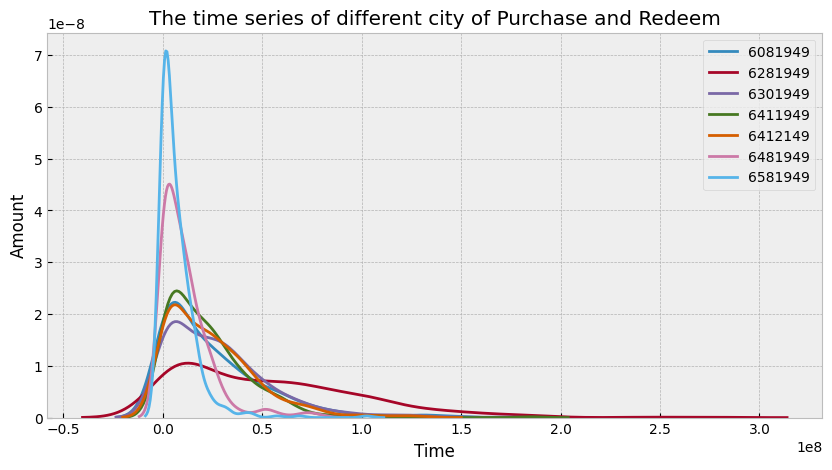

In [ ]:
# Analyze the difference in daily total transaction amounts for users in each city and plot the distribution estimation

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")

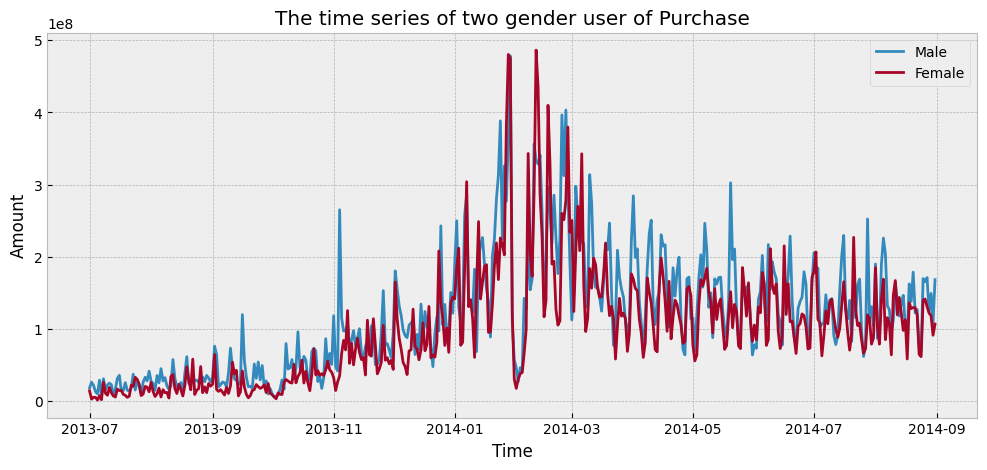

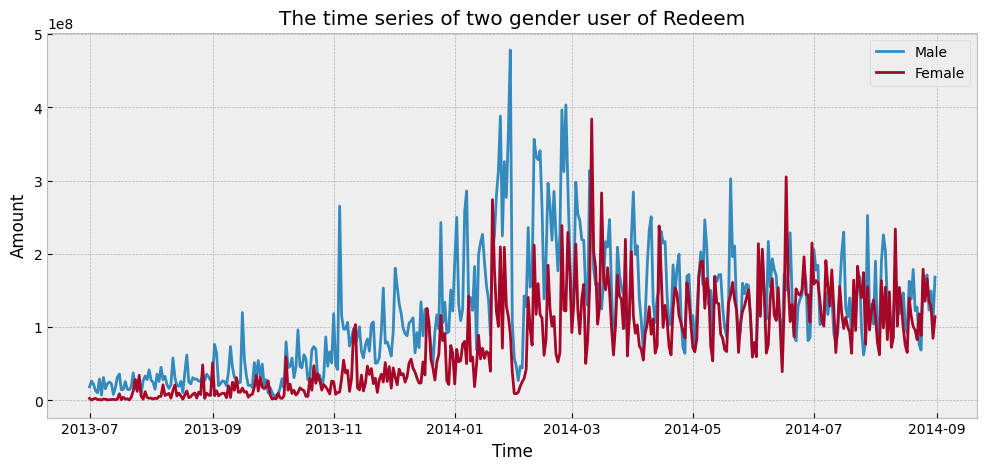

In [ ]:
# Analyze the difference in daily total transaction amounts for users of each gender and plot the time series

temp = balance_data.groupby(['date','sex'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_purchase_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_redeem_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [ ]:
# Change the Font to Chinese because there is Chinese Font in matplotlib

!wget -O TaipeiSansTCBeta-Regular.ttf https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_&export=download

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.font_manager import fontManager

fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
mpl.rc('font', family='Taipei Sans TC Beta')

--2024-10-16 03:03:22--  https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_
Resolving drive.google.com (drive.google.com)... 74.125.132.138, 74.125.132.102, 74.125.132.101, ...
Connecting to drive.google.com (drive.google.com)|74.125.132.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_ [following]
--2024-10-16 03:03:22--  https://drive.usercontent.google.com/download?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 64.233.181.132, 2607:f8b0:4001:c09::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|64.233.181.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20659344 (20M) [application/octet-stream]
Saving to: ‘TaipeiSansTCBeta-Regular.ttf’

TaipeiSansTCBeta-Re 100%[===================>]  19.70M  --.-KB/s    in 0.1s    

2024-10-16 03:03:

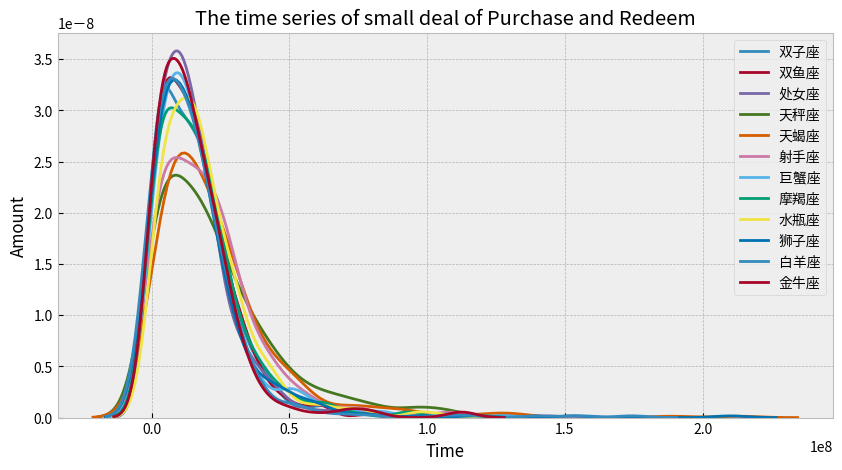

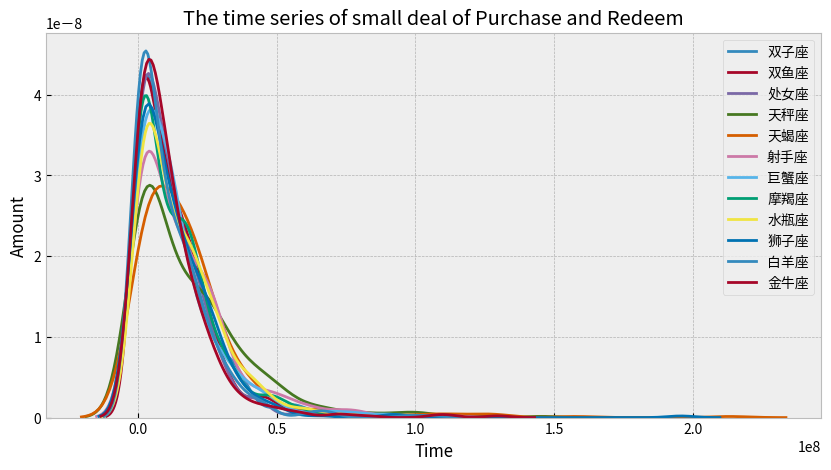

In [ ]:
# Analyze the difference in daily total transaction amounts for users of each zodiac sign and plot the distribution estimation

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 2.4)Other Analysis

In [ ]:
temp = balance_data.groupby(['date'], as_index=False)[['direct_purchase_amt','share_amt']].sum()

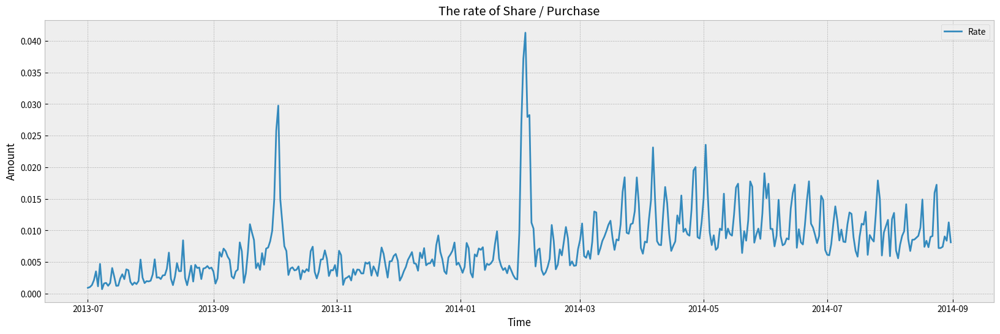

In [ ]:
# Plot the time series of daily interest growth/direct purchase amount

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'],  temp['share_amt'] / temp['direct_purchase_amt'] ,label='Rate')
plt.legend(loc='best')
plt.title("The rate of Share / Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [ ]:
# Load Alipay interest rate data

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: /content/downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 15.1MB/s]


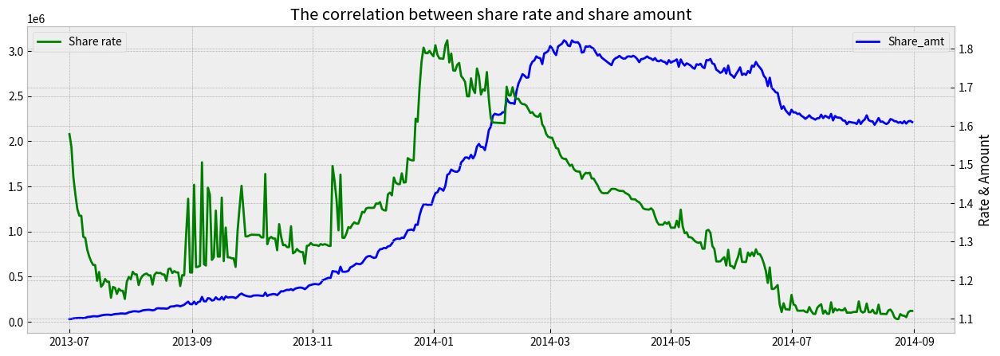

In [ ]:
# Plot the time series of Alipay interest rates and transaction amounts

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'],'b',label="Share_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and share amount")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

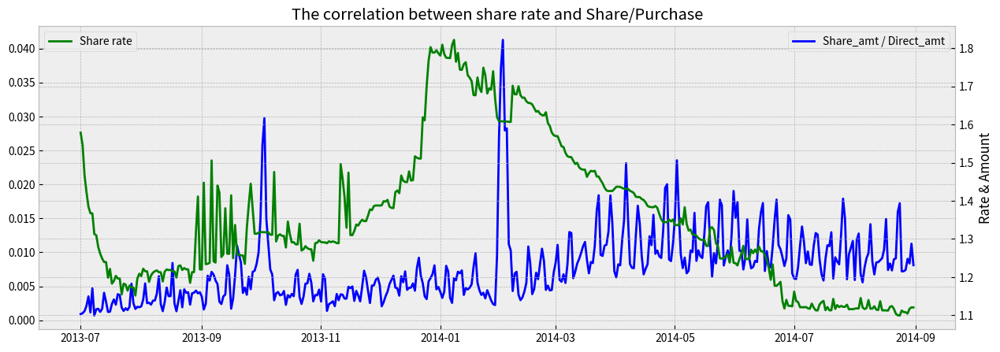

In [ ]:
# Plot the time series of Alipay interest rates and daily interest growth/direct purchase amount

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'] / temp['direct_purchase_amt'],'b',label="Share_amt / Direct_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and Share/Purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

In [ ]:
# Aggregate two different purchase methods

temp = balance_data.groupby(['date'], as_index=False)[['purchase_bal_amt','purchase_bank_amt']].sum()

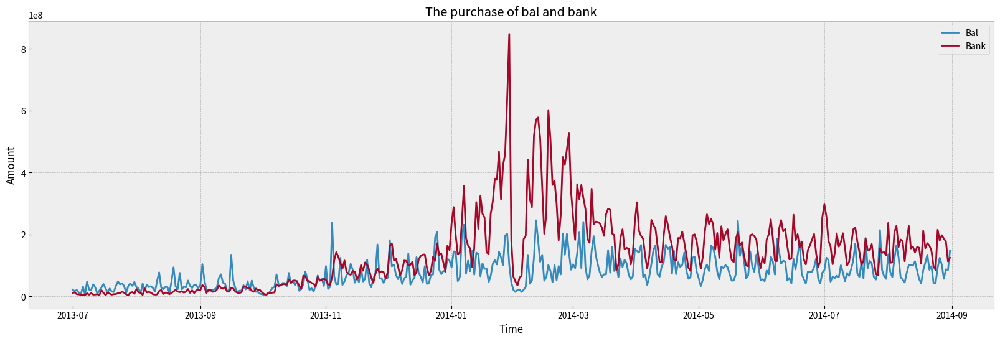

In [ ]:
# Plot the time series of daily purchase amount for different purchase methods

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['purchase_bal_amt'],label='Bal')
plt.plot(temp['date'], temp['purchase_bank_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The purchase of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

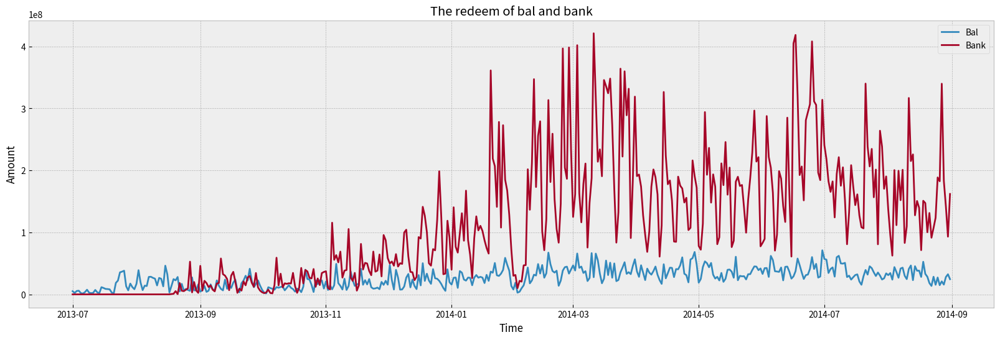

In [ ]:
# Plot the time series of daily redemption amount for different redemption methods

temp = balance_data.groupby(['date'], as_index=False)[['tftobal_amt','tftocard_amt']].sum()
fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['tftobal_amt'],label='Bal')
plt.plot(temp['date'], temp['tftocard_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The redeem of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

Although there is not much difference between purchasing via Alipay or bank cards, the difference in redemption is quite significant.

#Step 3: Time Series Rules

#### Periodic Factor Model

Since the time series data from Yu’e Bao exhibits strong periodic characteristics, we adopt the periodic factor model for this project.

- **Calculate periodic factors**
- **Calculate base**
- **Prediction = base * factors**

### About the Periodic Factor Model

#### Quick Start with Basic Rules

Assume the following data is given, and the task is to predict the daily traffic for the fourth week.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday | Weekly Average |
| :- | :- | :- | :- | :- | :- | :- | :- |
| Week 1 | 20 | 10 | 70 | 50 | 250 | 200 | 100 | 100 |
| Week 2 | 26 | 18 | 66 | 50 | 180 | 140 | 80 | 80 |
| Week 3 | 15 | 8  | 67 | 60 | 270 | 160 | 120 | 100 |

It’s obvious that there is a periodic fluctuation from Monday to Sunday. The core task of the prediction is to capture this periodicity as accurately as possible.

1. **Step One**: Divide by the weekly average to get a ratio.
2. **Step Two**: Take the median of each column.

You will get a set of robust periodic factors.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Week 1 | 0.2 | 0.1 | 0.7 | 0.5 | 2.5 | 2 | 1 |
| Week 2 | 0.325 | 0.225 | 0.825 | 0.625 | 2.25 | 1.75 | 1 |
| Week 3 | 0.15 | 0.08 | 0.67 | 0.6 | 2.7 | 1.6 | 1.2 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |

When making a prediction, you can simply multiply the periodic factors by a base to make the next week’s prediction. For example, if we take the average traffic of the last week, 100, as the base, multiplying it by the periodic factors gives us the prediction for the next week:

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| Prediction (base=100) | 20 | 10 | 70 | 60 | 250 | 175 | 100 |

This example uses only three weeks of data, but in real-world applications, you would use a longer period. The number of weeks to use can be determined based on the performance of the test set.

### Optimizing Periodic Factors

Taking the median of each column is a simple and effective way to extract periodic factors. The median is robust and not affected by extreme values, but it loses a lot of information. In practice, this method can be further optimized. For example, both the mean and the median can be extracted, and then combined. The ratio of this combination can be determined by the performance on the test set. You can also assign different weights based on the time distance from the predicted week.

### Optimizing the Base

Directly using the average traffic of the last week as the base may not be the best approach. Perhaps the average of the last three or five days reflects the most recent situation better. However, we cannot directly take the average of the last three days of traffic (since the last three days are weekends, which would skew the base higher). We need to remove the periodic factor first, and then take the average. The specific method is to divide the traffic by the periodic factor.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Week 3 | 15 | 8 | 67 | 60 | 270 | 160 | 120 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| De-seasonalized Traffic | 75 | 80 | 95.7 | 100 | 108 | 91.4 | 120 |

In this way, we can take the average of the last three days, (108 + 91.4 + 120) / 3 = 106.5, as the base. The number of days to consider can also be determined by the performance of the test set. Of course, different weights can also be assigned to each day using certain functions.

In [ ]:
# Load data

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=47425c94-0ab7-46d0-b948-2fa924ff3329
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:03<00:00, 45.3MB/s]


In [ ]:
# Create a deep copy of the data

data = total_balance.copy()
data

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2
...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4
210,2014-09-27,NaN,NaN,27,9,2014,39,5
211,2014-09-28,NaN,NaN,28,9,2014,39,6
212,2014-09-29,NaN,NaN,29,9,2014,40,0


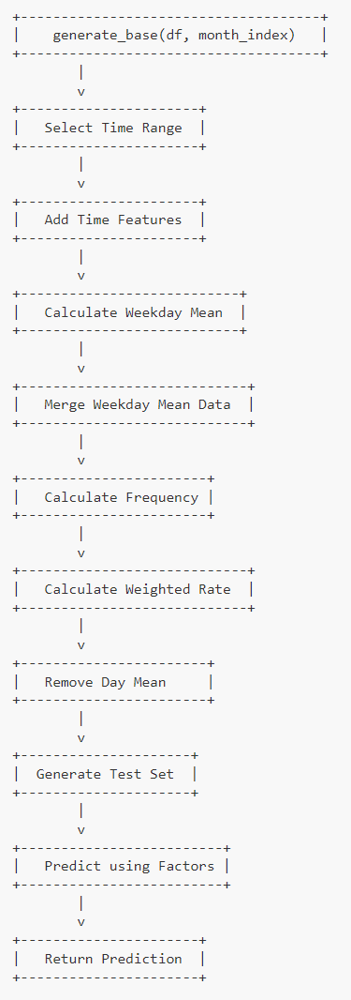

**"Next-Day Factor"** refers to predicting the value change at a future time point in time series forecasting based on certain historical data features. In this context, the next-day factor refers to predicting the value change of the next time point (the next day) based on certain historical features (such as the day of the week, date, etc.).

 **Process and Steps**:

1. **Data Filtering and Processing**:
   - Select data starting from "2014-03-01" up to a specific "month_index." The "month_index" is used to select data from a specific time range.
   - **Result**: The dataset contains only data from "2014-03-01" to the specified month.

2. **Adding Timestamps**:
   - Various time features such as the day of the week, date, week number, and month are added.
   - **Result**: Columns like "weekday" (day of the week), "day" (date), "week" (week number), and "month" are added to the dataset.

3. **Calculating Next-Day Factor**:
   - The average purchase and redemption amounts for each day of the week are calculated and divided by the overall average to get the next-day factor.
   - **Result**: The `mean_of_each_weekday` DataFrame contains the average purchase and redemption amounts for each weekday and their corresponding next-day factors.

4. **Merging Statistics with the Original Dataset**:
   - The next-day factors are merged into the original dataset for further calculations.
   - **Result**: The original dataset now includes columns for purchase and redemption next-day factors.

5. **Counting the Frequency of Each Day (1-31)**:
   - Count how often each date appears on each weekday, along with its corresponding next-day factor.
   - **Result**: The `weekday_count` DataFrame contains the frequency of each date on specific weekdays and their calculated next-day factors for purchase and redemption.

6. **Weighting Next-Day Factors by Frequency to Obtain Date Factors**:
   - The next-day factors are weighted by the frequency of each date to derive the date factors for purchase and redemption.
   - **Result**: The `day_rate` DataFrame contains the date factors for purchase and redemption based on the weighted next-day factors.

7. **Removing the Mean from All Dates to Get the Base**:
   - The average purchase and redemption amounts for each date are calculated. The weighted date factors are combined with the average to get the adjusted base value.
   - **Result**: The `day_pre` DataFrame contains the base values for purchase and redemption for each date.

8. **Generating Test Set Data**:
   - Test set data is generated based on month, date, and base values.
   - **Result**: The test set contains the date, purchase, and redemption base values.

9. **Obtaining Final Predictions Based on Base and Next-Day Factor**:
   - The test set data is merged with the next-day factors, and the purchase and redemption amounts are recalculated to obtain the final predictions.
   - **Result**: The `day_pre` DataFrame is updated with the final predicted purchase and redemption amounts, adjusted using the next-day factors.

This process outlines how historical data patterns, such as weekday trends and date factors, are used to predict future purchase and redemption amounts based on the next-day factor methodology.

In [ ]:

# Define a method to generate time series rule-based prediction results
def generate_base(df: pd.DataFrame, month_index: int) -> pd.DataFrame:
    # Select a fixed time period dataset
    total_balance = df.copy()  # Copy the input DataFrame to avoid modifying the original data
    total_balance = total_balance[['date', 'total_purchase_amt', 'total_redeem_amt']]  # Select specific columns of data
    total_balance = total_balance[(total_balance['date'] >= pd.to_datetime('2014/3/1')) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(month_index)))]  # Filter data for a specific time period

    # Add timestamps
    total_balance['weekday'] = total_balance['date'].dt.weekday  # Add day of the week information
    total_balance['day'] = total_balance['date'].dt.day          # Add day information
    total_balance['week'] = total_balance['date'].dt.isocalendar().week  # Add week number information
    total_balance['month'] = total_balance['date'].dt.month      # Add month information

    # Calculate the next-day factors
    mean_of_each_weekday = total_balance[['weekday'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('weekday', as_index=False).mean()  # Calculate the average purchase and redemption amounts for each weekday
    for name in ['total_purchase_amt', 'total_redeem_amt']:
        mean_of_each_weekday = mean_of_each_weekday.rename(columns={name: name+'_weekdaymean'})  # Add a suffix to the calculated result to distinguish the next-day factors
    mean_of_each_weekday['total_purchase_amt_weekdaymean'] /= np.mean(total_balance['total_purchase_amt'])  # Calculate the next-day factor for purchase amounts
    mean_of_each_weekday['total_redeem_amt_weekdaymean'] /= np.mean(total_balance['total_redeem_amt'])  # Calculate the next-day factor for redemption amounts

    # Merge calculated results into the original dataset
    total_balance = pd.merge(total_balance, mean_of_each_weekday, on='weekday', how='left')  # Merge next-day factors into the original dataset
    # print(total_balance)

    # Count the frequency of each day (1-31) occurring on specific weekdays
    weekday_count = total_balance[['day', 'weekday', 'date']].groupby(['day', 'weekday'], as_index=False).count()  # Count how often each day appears on each weekday
    weekday_count = pd.merge(weekday_count, mean_of_each_weekday, on='weekday')  # Merge calculated results with the next-day factors

    # Weight the next-day factors by frequency to obtain date factors
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))  # Calculate the weighted date factor for purchase amounts based on frequency
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))  # Calculate the weighted date factor for redemption amounts based on frequency
    day_rate = weekday_count.drop(['weekday', 'date'], axis=1).groupby('day', as_index=False).sum()  # Sum the weighted factors for each date

    # Remove the mean for all dates in the training set to obtain the base by subtracting date residuals
    day_mean = total_balance[['day'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('day', as_index=False).mean()  # Calculate the mean purchase and redemption amounts for each date
    day_pre = pd.merge(day_mean, day_rate, on='day', how='left')  # Merge the weighted factors with the mean for each date
    day_pre['total_purchase_amt'] /= day_pre['total_purchase_amt_weekdaymean']  # Divide the purchase amount by the next-day factor for purchases
    day_pre['total_redeem_amt'] /= day_pre['total_redeem_amt_weekdaymean']  # Divide the redemption amount by the next-day factor for redemptions

    # Generate test set data
    for index, row in day_pre.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            break
        day_pre.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']), 0, 0, 0)  # Generate the test set dates based on the month and day

    # Obtain final prediction results based on the base and next-day factors
    day_pre['weekday'] = day_pre['date'].dt.weekday  # Add weekday information
    day_pre = day_pre[['date', 'weekday'] + ['total_purchase_amt', 'total_redeem_amt']]  # Select necessary columns
    day_pre = pd.merge(day_pre, mean_of_each_weekday, on='weekday')  # Merge next-day factors
    day_pre['total_purchase_amt'] *= day_pre['total_purchase_amt_weekdaymean']  # Adjust the purchase amount based on the next-day factor for purchases
    day_pre['total_redeem_amt'] *= day_pre['total_redeem_amt_weekdaymean']  # Adjust the redemption amount based on the next-day factor for redemptions

    day_pre = day_pre.sort_values('date')[['date'] + ['total_purchase_amt', 'total_redeem_amt']]  # Sort by date and select necessary columns
    return day_pre  # Return the generated time series prediction results DataFrame


In [ ]:
# Generate prediction results (and residuals)

base_list = []
for i in range(4, 10):
    base_list.append(generate_base(data, i).reset_index(drop=True))

base = pd.concat(base_list).reset_index(drop=True)

In [ ]:
for i in ['total_purchase_amt','total_redeem_amt']:
    base = base.rename(columns={i: i+'_base'})

In [ ]:
base_res = pd.merge(data.reset_index(drop=True), base.reset_index(drop=True), on='date', how='left').reset_index(drop=True)
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468


In [ ]:
base_res['purchase_residual'] = base_res['total_purchase_amt'] / base_res['total_purchase_amt_base']
base_res['redeem_residual'] = base_res['total_redeem_amt'] / base_res['total_redeem_amt_base']

In [ ]:
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base,purchase_residual,redeem_residual
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163,NaN,NaN
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830,NaN,NaN
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353,NaN,NaN
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468,NaN,NaN


In [ ]:
# rename result table

base_res = base_res[['date','total_purchase_amt','total_redeem_amt','purchase_residual','redeem_residual','total_purchase_amt_base', 'total_redeem_amt_base']]
for i in base_res.columns:
    if i == 'date':
        base_res[i] = base_res[i].astype(str)
        base_res[i] = base_res[i].str.replace('-','')

In [ ]:
from collections.abc import Iterable

# Split the dataset
def split_data_underline(data):
    data['date'] = pd.to_datetime(data['date'])
    trainset = data[(datetime.datetime(2014, 4, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 8, 1))]
    testset = data[(datetime.datetime(2014, 8, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 9, 1))]
    return trainset, testset

trainset, testset = split_data_underline(base_res)

# Define evaluation function
def AE(y: Iterable, yhat: Iterable) -> Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: float = 0.3) -> float:
    purchase_score = sum(np.exp(-AE(purchase, purchasehat) / h) * 10)
    redeem_score = sum(np.exp(-AE(redeem, redeemhat) / h) * 10)
    return purchase_score * 0.45 + redeem_score * 0.55

# Calculate the score on the test set
score = total_AE(
    testset['total_purchase_amt'],
    testset['total_redeem_amt'],
    testset['total_purchase_amt_base'],
    testset['total_redeem_amt_base']
)

print("Score on the test set:", score)


Score on the test set: 186.60893633571055


# step4: Feature Engineering

In [ ]:
# Set a global index variable for future operations

labels = ['total_purchase_amt','total_redeem_amt']
date_indexs = ['week','year','month','weekday','day']

In [ ]:
# Load the dataset
balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=61245c96-95e9-4a67-83e9-a34ec3da9c56
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:02<00:00, 53.7MB/s]


**Feature Extraction**

Currently, there are three main approaches for time series forecasting:

- The first is traditional time series forecasting methods, with typical examples being ARIMA and exponential smoothing.
- The second is machine learning-based methods, with LightGBM and XGBoost being the most commonly used.
- The third is deep learning-based methods, such as RNN and LSTM.

Nowadays, the predictive accuracy of traditional time series methods is generally lower than that of machine learning and deep learning methods. However, the latter relies heavily on feature engineering, and with good feature tuning, it can achieve very high predictive accuracy.

## 1、Static Features Based on Date

**Static Features Based on Date**

### 1.1 Extract "is" Features

**Boolean Features:**

- Whether it is the beginning/end of the year
- Whether it is the beginning/end of the month
- Whether it is a weekend
- Whether it is a holiday
- Whether it is a special date
- Whether it is morning/afternoon/evening
- ...

In [ ]:
# Get the set of holidays

def get_holiday_set() -> Set[datetime.date]:
    holiday_set = set()
    # Qingming Festival
    holiday_set = holiday_set | {datetime.date(2014, 4, 5), datetime.date(2014, 4, 6), datetime.date(2014, 4, 7)}
    # Labor Day
    holiday_set = holiday_set | {datetime.date(2014, 5, 1), datetime.date(2014, 5, 2), datetime.date(2014, 5, 3)}
    # Dragon Boat Festival
    holiday_set = holiday_set | {datetime.date(2014, 5, 31), datetime.date(2014, 6, 1), datetime.date(2014, 6, 2)}
    # Mid-Autumn Festival
    holiday_set = holiday_set | {datetime.date(2014, 9, 6), datetime.date(2014, 9, 7), datetime.date(2014, 9, 8)}
    # National Day
    holiday_set = holiday_set | {datetime.date(2014, 10, 1), datetime.date(2014, 10, 2), datetime.date(2014, 10, 3),
                                 datetime.date(2014, 10, 4), datetime.date(2014, 10, 5), datetime.date(2014, 10, 6),
                                 datetime.date(2014, 10, 7)}
    # Mid-Autumn Festival (2013)
    holiday_set = holiday_set | {datetime.date(2013, 9, 19), datetime.date(2013, 9, 20), datetime.date(2013, 9, 21)}
    # National Day (2013)
    holiday_set = holiday_set | {datetime.date(2013, 10, 1), datetime.date(2013, 10, 2), datetime.date(2013, 10, 3),
                                 datetime.date(2013, 10, 4), datetime.date(2013, 10, 5), datetime.date(2013, 10, 6),
                                 datetime.date(2013, 10, 7)}
    return holiday_set


In [ ]:
# Extract all "is" features

def extract_is_feature(data: pd.DataFrame) -> pd.DataFrame:
    total_balance = data.copy().reset_index(drop=True)

    # Is it the weekend?
    total_balance['is_weekend'] = 0
    total_balance.loc[total_balance['weekday'].isin((5, 6)), 'is_weekend'] = 1

    # Is it a holiday?
    total_balance['is_holiday'] = 0
    total_balance.loc[total_balance['date'].isin(get_holiday_set()), 'is_holiday'] = 1

    # Is it the first day of a holiday?
    last_day_flag = 0
    total_balance['is_firstday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 0 and row['is_holiday'] == 1:
            total_balance.loc[index, 'is_firstday_of_holiday'] = 1
        last_day_flag = row['is_holiday']

    # Is it the last day of a holiday?
    total_balance['is_lastday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1 and total_balance.loc[index+1, 'is_holiday'] == 0:
             total_balance.loc[index, 'is_lastday_of_holiday'] = 1

    # Is it the first working day after a holiday?
    total_balance['is_firstday_of_work'] = 0
    last_day_flag = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 1 and row['is_holiday'] == 0:
            total_balance.loc[index, 'is_firstday_of_work'] = 1
        last_day_flag = row['is_lastday_of_holiday']

    # Is it a working day?
    total_balance['is_work'] = 1
    total_balance.loc[(total_balance['is_holiday'] == 1) | (total_balance['is_weekend'] == 1), 'is_work'] = 0
    special_work_day_set = {datetime.date(2014, 5, 4), datetime.date(2014, 9, 28)}
    total_balance.loc[total_balance['date'].isin(special_work_day_set), 'is_work'] = 1

    # Is tomorrow a working day?
    total_balance['is_gonna_work_tomorrow'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_work'] == 0 and total_balance.loc[index+1, 'is_work'] == 1:
             total_balance.loc[index, 'is_gonna_work_tomorrow'] = 1

    # Did you work yesterday?
    total_balance['is_worked_yesterday'] = 0
    for index, row in total_balance.iterrows():
        if index <= 1:
            continue
        if total_balance.loc[index-1, 'is_work'] == 1:
             total_balance.loc[index, 'is_worked_yesterday'] = 1

    # Is it the day before a holiday?
    total_balance['is_lastday_of_workday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_holiday'] == 0 and total_balance.loc[index+1, 'is_holiday'] == 1:
             total_balance.loc[index, 'is_lastday_of_workday'] = 1

    # Is it a Sunday, but still a working day?
    total_balance['is_work_on_sunday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['weekday'] == 6 and row['is_work'] == 1:
             total_balance.loc[index, 'is_work_on_sunday'] = 1

    # Is it the first day of the month?
    total_balance['is_firstday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 1, 'is_firstday_of_month'] = 1

    # Is it the second day of the month?
    total_balance['is_secday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 2, 'is_secday_of_month'] = 1

    # Is it the beginning of the month?
    total_balance['is_premonth'] = 0
    total_balance.loc[total_balance['day'] <= 10, 'is_premonth'] = 1

    # Is it the middle of the month?
    total_balance['is_midmonth'] = 0
    total_balance.loc[(10 < total_balance['day']) & (total_balance['day'] <= 20), 'is_midmonth'] = 1

    # Is it the end of the month?
    total_balance['is_tailmonth'] = 0
    total_balance.loc[20 < total_balance['day'], 'is_tailmonth'] = 1

    # Is it the first week of the month?
    total_balance['is_first_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 1, 'is_first_week'] = 1

    # Is it the second week of the month?
    total_balance['is_second_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 2, 'is_second_week'] = 1

    # Is it the third week of the month?
    total_balance['is_third_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 3, 'is_third_week'] = 1

    # Is it the fourth week of the month?
    total_balance['is_fourth_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 0, 'is_fourth_week'] = 1

    return total_balance.reset_index(drop=True)


In [ ]:
# Extract "is" Features into the Dataset

total_balance = extract_is_feature(total_balance)

In [ ]:
# Encode Next-Day Features

def encode_data(data: pd.DataFrame, feature_name: str = 'weekday', encoder=OneHotEncoder()) -> pd.DataFrame:
    """
    Perform one-hot encoding on the given DataFrame and return the encoded DataFrame.

    Parameters:
    - data: pd.DataFrame, the dataset to be encoded.
    - feature_name: str, the name of the feature to be one-hot encoded, default is 'weekday'.
    - encoder: the encoder object, default is OneHotEncoder().

    Returns:
    - pd.DataFrame, the encoded DataFrame.

    Raises:
    - No exception handling.
    """
    # Copy the dataset
    total_balance = data.copy()

    # Perform one-hot encoding on the feature using the encoder
    week_feature = encoder.fit_transform(np.array(total_balance[feature_name]).reshape(-1, 1)).toarray()

    # Convert the encoded feature to a DataFrame
    week_feature = pd.DataFrame(week_feature, columns=[feature_name + '_onehot_' + str(x) for x in range(len(week_feature[0]))])

    # Concatenate the encoded feature with the original dataset
    featureWeekday = pd.concat([total_balance, week_feature], axis=1)

    # Return the encoded DataFrame
    return featureWeekday



In [ ]:
# Extract Encode Next-Day Features into the Dataset

total_balance = encode_data(total_balance)

In [ ]:
# Generate the set of "is" features

# Get the list of column names that contain "is"
is_columns = [x for x in total_balance.columns if 'is' in x]

# Extract columns that contain "is"
feature = total_balance[is_columns + date_indexs + labels + ['date']]


### 1.2 Analysis of Label Distribution for "is" Features



In [ ]:
def draw_boxplot(data: pd.DataFrame, label: str = 'total_purchase_amt') -> None:
    # Set plot style
    sns.set(style="whitegrid")

    # Create subplots
    f, axes = plt.subplots(5, 4, figsize=(18, 18))

    # Get column names
    global date_indexs, labels
    count = 0
    # Define color palette
    colors = sns.color_palette("Set2")

    for i in [x for x in data.columns if x not in date_indexs + labels + ['date']]:
        # Draw box plot and specify color
        sns.boxenplot(x=i, y=label, data=data, ax=axes[count // 4][count % 4], palette=colors)

        # Remove x-axis and y-axis labels
        axes[count // 4][count % 4].set_xlabel(None)
        axes[count // 4][count % 4].set_ylabel(None)

        # Set feature name as the subplot title
        axes[count // 4][count % 4].set_title(i, color='#ff6c42')

        count += 1


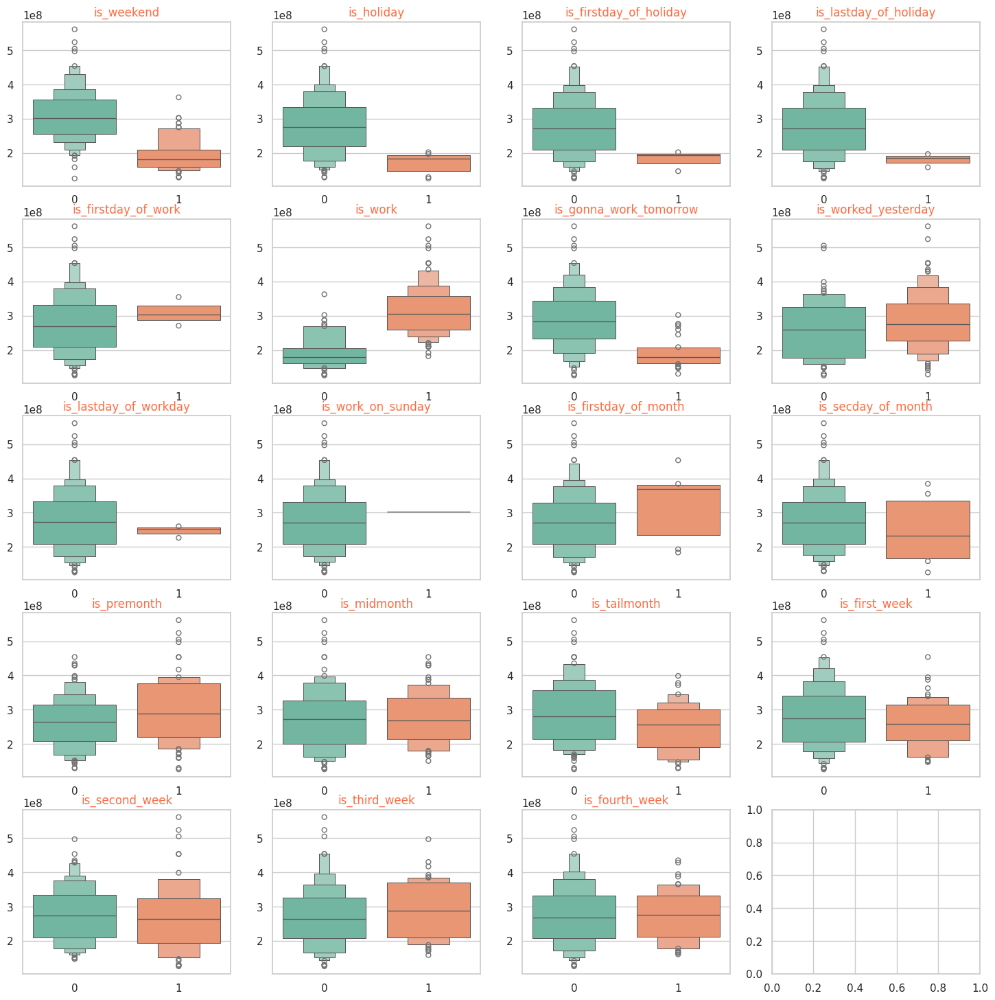

In [ ]:
draw_boxplot(feature,label = 'total_purchase_amt')

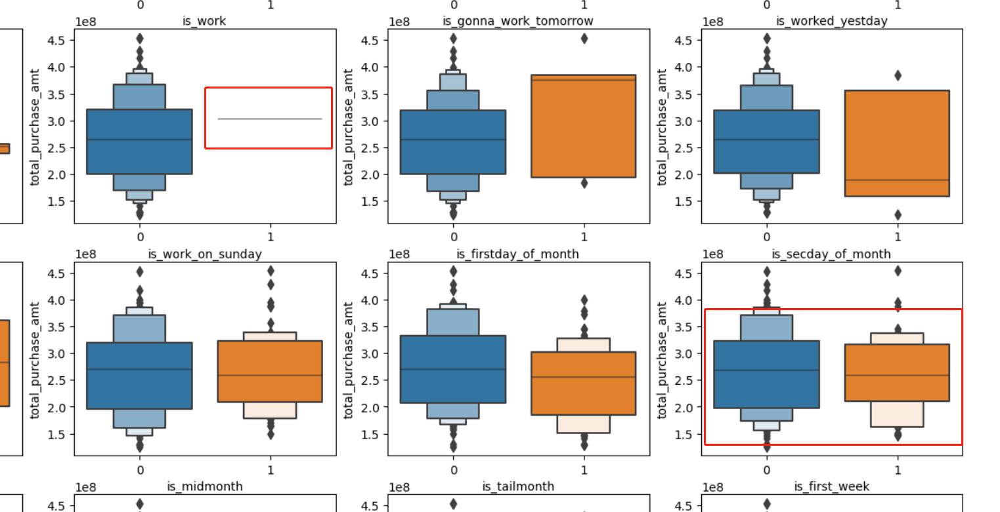

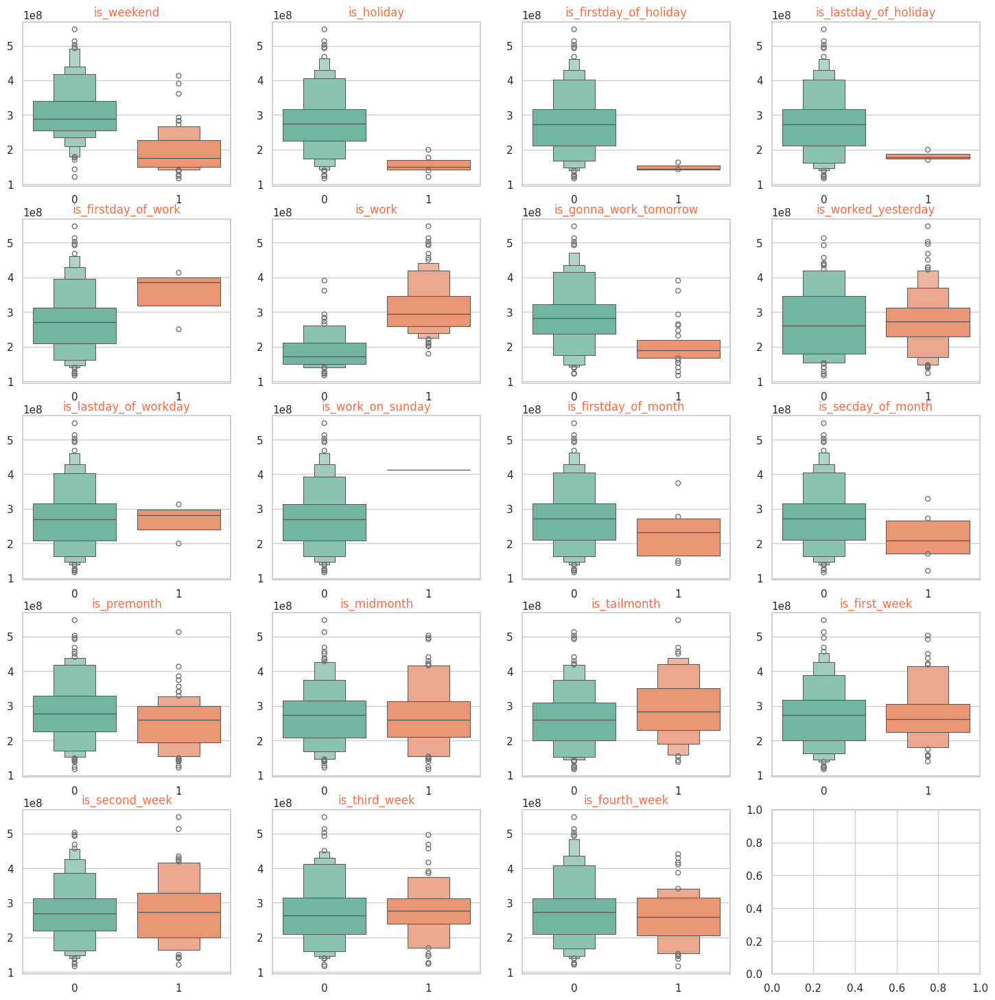

In [ ]:
draw_boxplot(feature,label = 'total_redeem_amt')

In [ ]:
## Exclude Features That Appear Less Useful

purchase_feature_seems_useless = [
      # Sample size is too small, making it ineffective for modeling; however, if confirmed as a useful rule, results can be adjusted.
      'is_work_on_sunday',
      # Median differences are not significant
      'is_first_week'
]



### 1.3 IS Feature Correlation Analysis

In [ ]:
# Plot correlation heatmap

def draw_correlation_heatmap(data: pd.DataFrame, way: str = 'pearson') -> None:
    feature = data.copy()
    plt.figure(figsize=(20, 10))
    plt.title('The ' + way + ' correlation between total purchase and each feature')

    # Draw the heatmap for the correlation matrix
    sns.heatmap(feature[[x for x in feature.columns if x not in ['total_redeem_amt', 'date']]].corr(way),
                linecolor='white',
                linewidths=0.2,
                annot=True,
                fmt=".3f",  # Keep three decimal places
                annot_kws={"size": 8},  # Adjust the font size
                cmap="RdBu")  # Color map


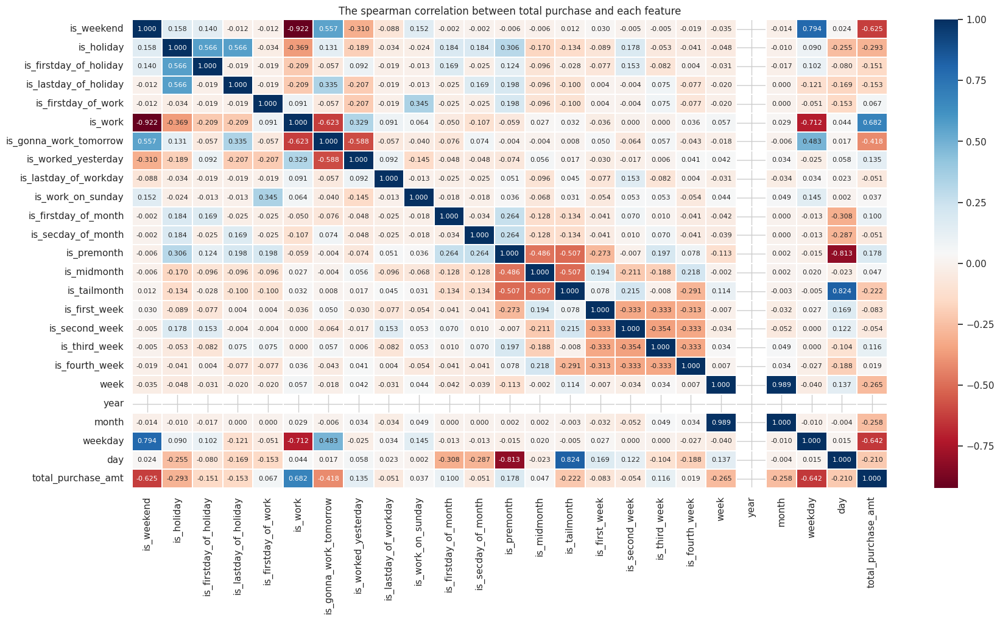

In [ ]:
draw_correlation_heatmap(feature, 'spearman')

In [ ]:
# Remove Low-Correlation Features

temp = np.abs(feature[[x for x in feature.columns
                       if x not in ['total_redeem_amt', 'date'] ]].corr('spearman')['total_purchase_amt'])
feature_low_correlation = list(set(temp[temp < 0.1].index))

In [ ]:
feature_low_correlation

['is_firstday_of_month',
 'is_work_on_sunday',
 'is_second_week',
 'is_firstday_of_work',
 'is_midmonth',
 'is_first_week',
 'is_lastday_of_workday',
 'is_secday_of_month',
 'is_fourth_week']

## 2、Distance-based Features

### 2.1 Extract Distance Features

In [ ]:
# Extract Distance Features

def extract_distance_feature(data: pd.DataFrame) -> pd.DataFrame:
    total_balance = data.copy()

    # Days until the next non-working day
    total_balance['dis_to_nowork'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 0:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 1:
                    total_balance.loc[index - step, 'dis_to_nowork'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_nowork'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 1:
            total_balance.loc[index, 'dis_from_nowork'] = step
        else:
            step = 0

    # Days until the next working day
    total_balance['dis_to_work'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 0:
                    total_balance.loc[index - step, 'dis_to_work'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_work'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 0:
            total_balance.loc[index, 'dis_from_work'] = step
        else:
            step = 0

    # Days until the next holiday
    total_balance['dis_to_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiday'] = step
        else:
            step = 0

    # Days until the last day of the holiday
    total_balance['dis_to_holiendday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_lastday_of_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_lastday_of_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiendday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiendday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_lastday_of_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiendday'] = step
        else:
            step = 0

    # Days from the start of the month
    total_balance['dis_from_startofmonth'] = np.abs(total_balance['day'])

    # Days from the middle of the month
    total_balance['dis_from_middleofmonth'] = np.abs(total_balance['day'] - 15)

    # Days from the middle of the week
    total_balance['dis_from_middleofweek'] = np.abs(total_balance['weekday'] - 3)

    # Days from the end of the week (Sunday)
    total_balance['dis_from_endofweek'] = np.abs(total_balance['weekday'] - 6)

    return total_balance


In [ ]:
# Concatenate Distance Features to the Original Dataset

total_balance = extract_distance_feature(total_balance)

### 2.2 Distance Feature Analysis

In [ ]:
# Get Column Names of Distance Features

feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]
dis_feature_indexs = [x for x in feature.columns if (x not in date_indexs + labels + ['date']) & ('dis_' in x)]

**Point Plot**

A point plot is a type of chart used to display the relationship between two variables. It is particularly useful for showing the relationship between continuous and categorical variables, and is often employed to compare the mean or median across different groups.

The functions of a point plot include:

1. **Displaying Trends**: Point plots help visualize the trends in the means or medians of variables across different categories or groups, making it easier to understand patterns in the data.

2. **Comparing Differences**: Point plots allow for direct comparison of the means or medians of variables across different categories or groups, helping to uncover patterns and trends in the data.

3. **Showing Confidence Intervals**: Point plots typically display confidence intervals, which help assess the accuracy of the estimated means or medians and provide information about the variability within the data.

4. **Highlighting Outliers**: Point plots can assist in identifying outliers, which may indicate special cases or unusual events within the data.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def draw_point_feature(data: pd.DataFrame) -> None:
    """
    Draw point plots for features against total_purchase_amt.

    Args:
        data: The input DataFrame containing features and total_purchase_amt.
    """
    # Copy the data
    feature = data.copy()

    # Create subplots
    f, axes = plt.subplots(data.shape[1] // 3, 3, figsize=(30, data.shape[1] // 3 * 4))

    # Counter
    count = 0

    # Iterate over feature columns to draw point plots
    for i in [x for x in feature.columns if (x not in date_indexs + labels + ['date'])]:
        # Draw point plot
        sns.pointplot(x=i, y="total_purchase_amt",
                      marker="o",  # Set marker style to circle
                      data=feature,  # Data source
                      ax=axes[count // 3][count % 3] if data.shape[1] > 3 else axes[count])  # Set subplot position

        # Update counter
        count += 1

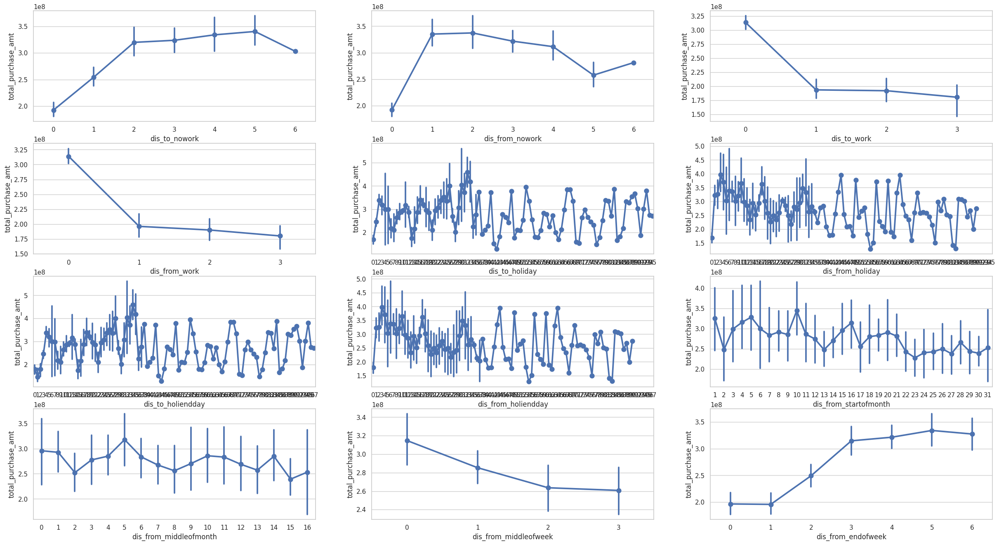

In [ ]:
draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [ ]:
# Handle time points that are too far apart

def dis_change(x):
    if x > 5:
        x = 10
    return x

In [ ]:
# Handle special distances

dis_holiday_feature = [x for x in total_balance.columns if 'dis' in x and 'holi' in x]
dis_month_feature = [x for x in total_balance.columns if 'dis' in x and 'month' in x]
total_balance[dis_holiday_feature] = total_balance[dis_holiday_feature].applymap(dis_change)
total_balance[dis_month_feature] = total_balance[dis_month_feature].applymap(dis_change)

In [ ]:
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

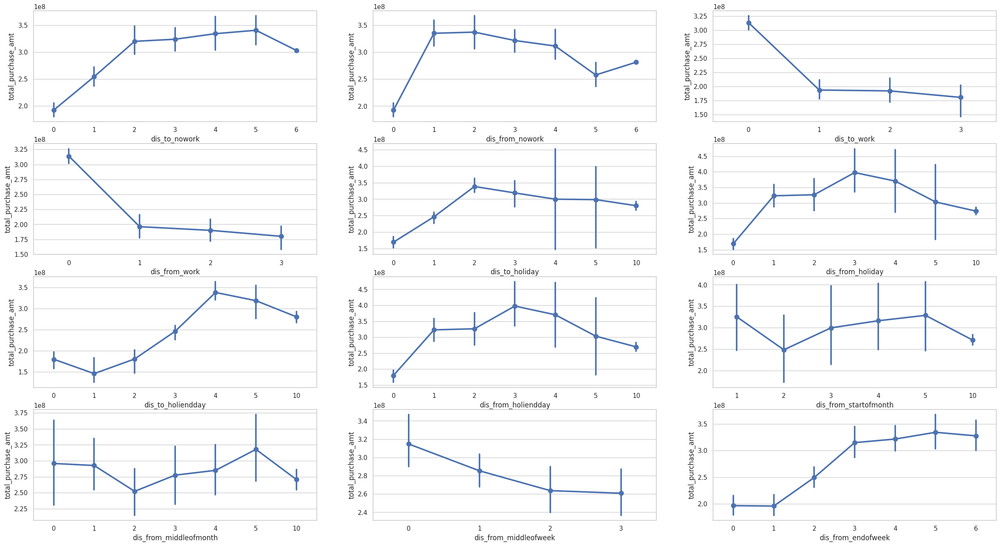

In [ ]:
# Draw the processed point plot

draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [ ]:
## Exclude features that appear to be less useful
purchase_feature_seems_useless += [
                                  #即使做了处理，但方差太大，不可信，规律不明显
                                  'dis_to_holiday',
                                  #方差太大，不可信
                                  'dis_from_startofmonth',
                                  #方差太大，不可信
                                  'dis_from_middleofmonth'
]

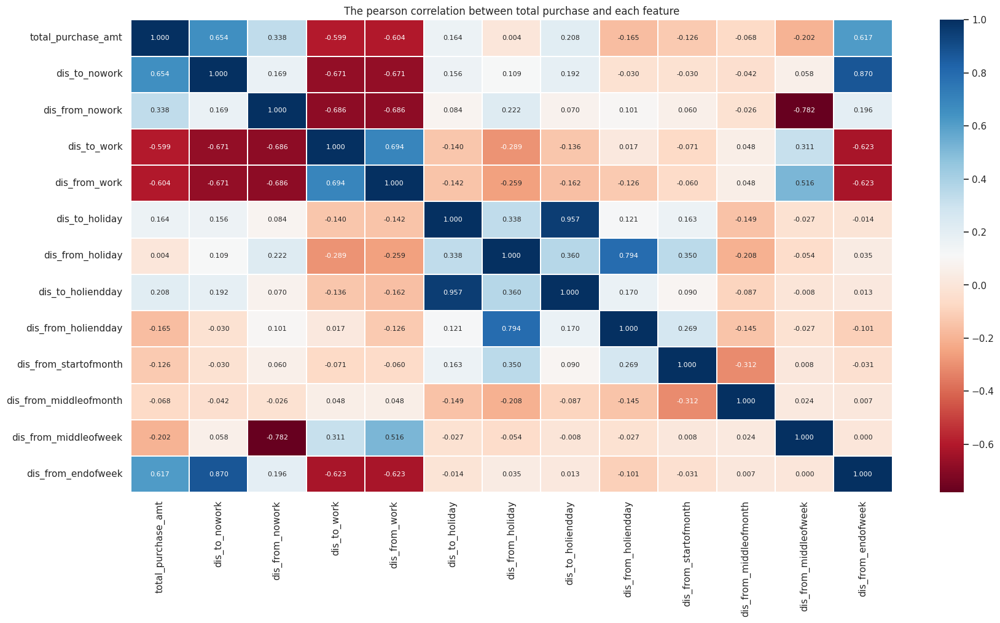

In [ ]:
# Draw the correlation plot
draw_correlation_heatmap(feature[['total_purchase_amt'] + dis_feature_indexs])

In [ ]:
# Exclude features with poor correlation

temp = np.abs(feature[[x for x in feature.columns
                       if ('dis' in x) | (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
feature_low_correlation += list(set(temp[temp < 0.1].index) )

In [ ]:
feature_low_correlation

['is_firstday_of_month',
 'is_work_on_sunday',
 'is_second_week',
 'is_firstday_of_work',
 'is_midmonth',
 'is_first_week',
 'is_lastday_of_workday',
 'is_secday_of_month',
 'is_fourth_week',
 'dis_from_holiday',
 'dis_from_middleofmonth']

## 3、Peak and Trough Features

### 3.1 Extracting Peak Characteristics

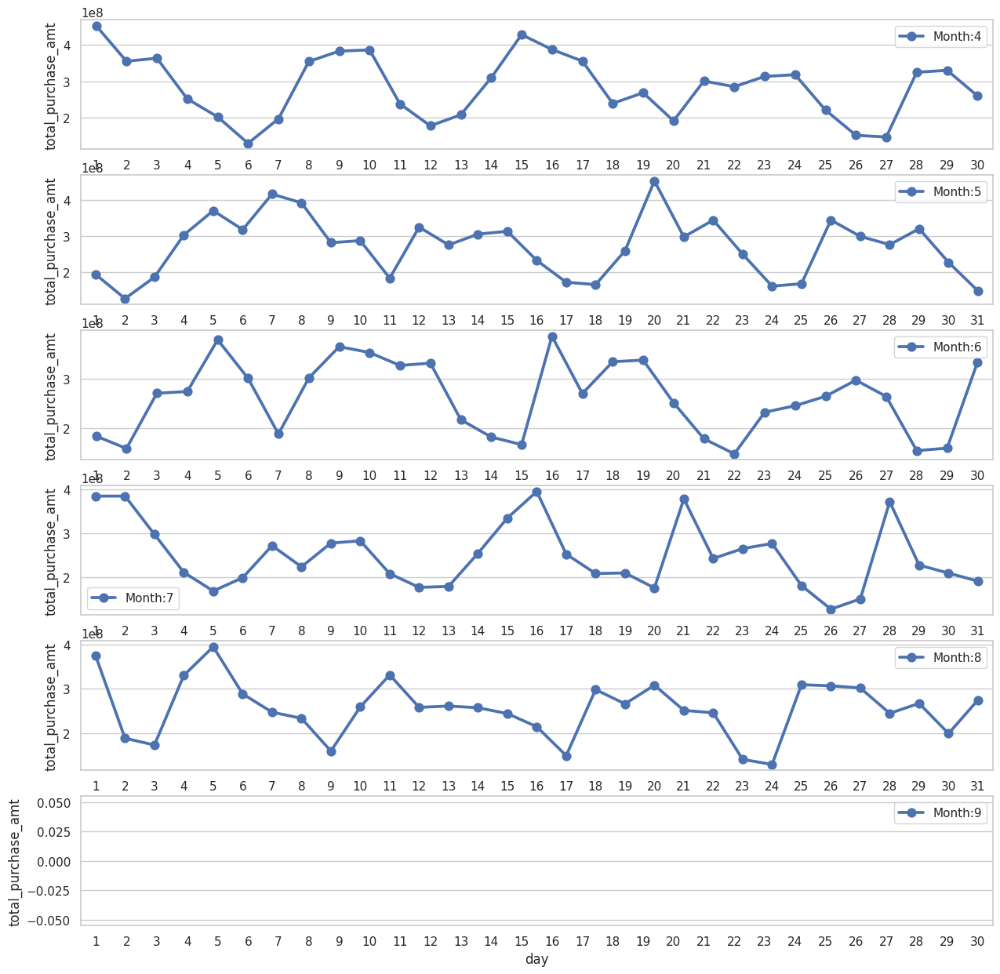

In [ ]:
# Observing Peak Characteristics #Purchase
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(15,15))
for i in range(4, 10):
    plt.subplot(6,1,i - 3)
    total_balance_2 = total_balance[(total_balance['date'].dt.date >= datetime.date(2014,i,1)) \
                                    & (total_balance['date'].dt.date < datetime.date(2014,i+1,1))]
    sns.pointplot(x=total_balance_2['day'],y=total_balance_2['total_purchase_amt'], label='Month:' + str(i))
    plt.legend()
plt.show()


In [ ]:
# Purchase
# - 04/01 (Tuesday)                             04/06 (Sunday, second day of Qingming Festival)
# - 04/10 (Thursday, similar to Tuesday)        04/12 (Saturday, similar to Sunday)
# - 04/15 (Tuesday)                             04/20 (Sunday)
# - 04/24 (Thursday, similar level to Tuesday)   04/27 (Sunday)
# - 04/29 (Tuesday)                             05/02 (Friday, second day of Labor Day)
# - 05/07 (Wednesday, large difference from Tuesday, possibly influenced by Labor Day)   05/11 (Sunday)
# - 05/12 (Monday, with some difference from Tuesday)  05/18 (Sunday)
# - 05/19 (Tuesday)                             05/25 (Sunday)
# - 05/26 (Monday, with some difference from Tuesday)  05/31 (Saturday, end of the month)
# - 06/05 (Thursday, large difference from Tuesday, possibly influenced by Dragon Boat Festival)   06/07 (Saturday, possibly influenced by Dragon Boat Festival)
# - 06/09 (Monday, similar to Tuesday)          06/15 (Sunday)
# - 06/16 (Monday, large difference from Tuesday)   06/22 (Sunday)
# - 06/26 (Thursday, not much difference from Tuesday)   06/29 (Sunday)
# - 07/01 (Tuesday)                             07/05 (Saturday, not much difference from Sunday)
# - 07/07 (Monday, with difference from Tuesday)   07/13 (Sunday)
# - 07/16 (Wednesday, with some difference from Tuesday)   07/20 (Sunday)
# - 07/21 (Monday, significant difference from Tuesday)   07/26 (Saturday, similar to Sunday)
# - 07/28 (Monday, significant difference from Tuesday)   08/03 (Sunday)
# - 08/05 (Tuesday)                             08/09 (Saturday, large difference from Sunday)
# - 08/11 (Monday, large difference from Tuesday)   08/17 (Sunday)
# - 08/18 (Monday, not much difference from Tuesday)   08/24 (Sunday)

In [ ]:
# Set Peak Dates

def extract_peak_feature(data: pd.DataFrame) -> pd.DataFrame:
    total_balance = data.copy()
    # Days from the purchase peak (i.e., Tuesday)
    total_balance['dis_from_purchase_peak'] = np.abs(total_balance['weekday'] - 1)

    # Days from the purchase valley (i.e., Sunday), same as dis_from_endofweek
    total_balance['dis_from_purchase_valley'] = np.abs(total_balance['weekday'] - 6)

    return total_balance


In [ ]:
# Extracting Peak Characteristics

total_balance = extract_peak_feature(total_balance)
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

### 3.2 Analyz Peak Characteristics

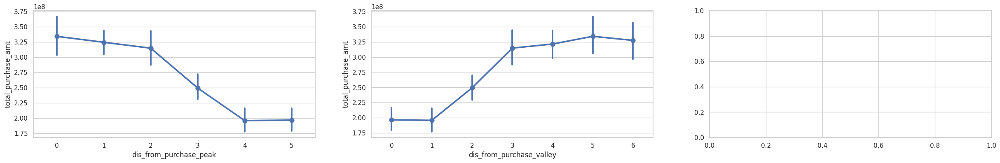

In [ ]:
draw_point_feature(feature[['total_purchase_amt'] + ['dis_from_purchase_peak','dis_from_purchase_valley']])

### 3.3 Analyze Peak Feature Correlations

In [ ]:
temp = np.abs(feature[[x for x in feature.columns if ('peak' in x) or ('valley' in x) or (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
temp

,total_purchase_amt
total_purchase_amt,1.0000
dis_from_purchase_peak,0.6396
dis_from_purchase_valley,0.6170


## 4、Add cycle factors as features

### 4.1 Extract cycle factors


In [ ]:
def generate_rate(df, month_index):
    """
    Generate weekly and daily average purchase and redeem ratios.

    Parameters:
        df: DataFrame containing date, total purchase amount, and total redeem amount.
        month_index: The month index for which to generate the ratios.

    Returns:
        weekday_rate: The average weekly ratio.
        day_rate: The average daily ratio.
    """

    # Copy the input DataFrame
    total_balance = df.copy()

    # Extract date, total purchase amount, and total redeem amount from the balance
    pure_balance = total_balance[['date','total_purchase_amt','total_redeem_amt']]

    # Filter the data to include only dates before the specified month
    pure_balance = pure_balance[(pure_balance['date'].dt.date >= datetime.date(2014, 3, 1)) \
                                & (pure_balance['date'].dt.date < datetime.date(2014, month_index, 1))]

    # Extract the weekday, day, week, and month from the date
    pure_balance['weekday'] = pure_balance['date'].dt.weekday
    pure_balance['day'] = pure_balance['date'].dt.day
    pure_balance['week'] = pure_balance['date'].dt.isocalendar().week
    pure_balance['month'] = pure_balance['date'].dt.month

    # Calculate the average purchase and redeem ratio for each weekday
    weekday_rate = pure_balance[['weekday']+labels].groupby('weekday', as_index=False).mean()
    for name in labels:
        weekday_rate = weekday_rate.rename(columns={name: name+'_weekdaymean'})
    weekday_rate['total_purchase_amt_weekdaymean'] /= np.mean(pure_balance['total_purchase_amt'])
    weekday_rate['total_redeem_amt_weekdaymean'] /= np.mean(pure_balance['total_redeem_amt'])

    # Merge the weekly average ratio with the original data
    pure_balance = pd.merge(pure_balance, weekday_rate, on='weekday', how='left')

    # Calculate the daily purchase and redeem ratio
    weekday_count = pure_balance[['day','weekday','date']].groupby(['day','weekday'], as_index=False).count()
    weekday_count = pd.merge(weekday_count, weekday_rate, on='weekday')
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    day_rate = weekday_count.drop(['weekday','date'], axis=1).groupby('day', as_index=False).sum()

    # Rename the columns
    weekday_rate.columns = ['weekday','purchase_weekdayrate','redeem_weekdayrate']
    day_rate.columns = ['day','purchase_dayrate','redeem_dayrate']

    # Add the date to the day_rate DataFrame
    day_rate['date'] = datetime.datetime(2014, month_index, 1)
    for index, row in day_rate.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            continue
        day_rate.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']))

    # Add the weekday and calculate the daily purchase and redeem ratios
    day_rate['weekday'] = day_rate['date'].dt.weekday
    day_rate = pd.merge(day_rate, weekday_rate, on='weekday')
    day_rate['purchase_dayrate'] = day_rate['purchase_weekdayrate'] / day_rate['purchase_dayrate']
    day_rate['redeem_dayrate'] = day_rate['redeem_weekdayrate'] / day_rate['redeem_dayrate']

    # Add the month information
    weekday_rate['month'] = month_index
    day_rate['month'] = month_index

    # Return the weekly and daily ratios
    return weekday_rate, day_rate[['day','purchase_dayrate','redeem_dayrate','month']].sort_values('day')


In [ ]:
# Generate cycle factors and merge them into the dataset
weekday_rate_list = []
day_rate_list = []
for i in range(3, 10):
    weekday_rate, day_rate = generate_rate(total_balance, i)
    weekday_rate_list.append(weekday_rate.reset_index(drop=True))
    day_rate_list.append(day_rate.reset_index(drop=True))

weekday_rate_list = pd.concat(weekday_rate_list).reset_index(drop=True)
day_rate_list = pd.concat(day_rate_list).reset_index(drop=True)
total_balance = pd.merge(total_balance, weekday_rate_list, on=['weekday','month'], how='left')
total_balance = pd.merge(total_balance, day_rate_list, on=['day','month'], how='left')

In [ ]:
# Perform special handling of cycle factors Use the median to fill in missing values

for i in [x for x in total_balance.columns
          if 'rate' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 4.2 Analyze the correlation of cycle factors

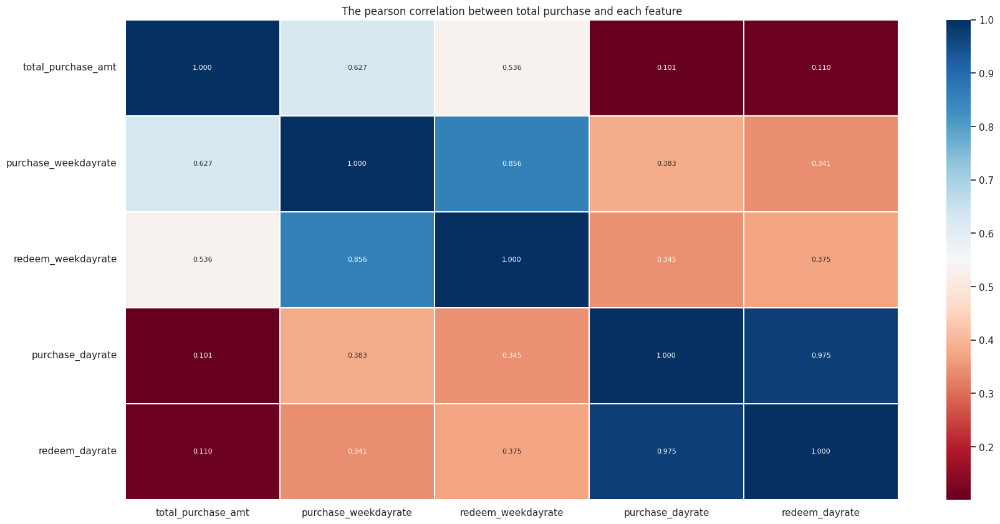

In [ ]:
# Plot the correlation graph
draw_correlation_heatmap(total_balance[['total_purchase_amt']
                                       + [x for x in total_balance.columns
                                          if 'rate' in x and x not in labels + date_indexs]])

In [ ]:
# Remove features with low correlation
feature = total_balance.drop(date_indexs, axis=1)

## 5、Add dynamic time-series features

### 5.1 Extract dynamic features
Mainly involves calculating the purchase amount for different days of the week and computing statistical characteristics such as the median, mean, minimum, maximum, standard deviation, and skewness.

In [ ]:
def get_amtfeature_with_time(data: pd.DataFrame) -> pd.DataFrame:
    # Copy part of the input dataset, keeping the necessary columns (labels, date_indexs, and 'date')
    df_tmp_ = data[labels + date_indexs + ['date']].copy()
    total_balance = data.copy()  # Copy the entire input dataset

    # Select data where the date is greater than or equal to March 3, 2014
    df_tmp_ = df_tmp_[(df_tmp_['date'].dt.date >= datetime.date(2014, 3, 3))]

    # Add new features: day of the week, week number, day, and month from the date
    df_tmp_['weekday'] = df_tmp_['date'].dt.weekday + 1
    df_tmp_['week'] = df_tmp_['date'].dt.isocalendar().week - min(df_tmp_['date'].dt.isocalendar().week) + 1
    df_tmp_['day'] = df_tmp_['date'].dt.day
    df_tmp_['month'] = df_tmp_['date'].dt.month

    # Reset the index
    df_tmp_.reset_index(inplace=True)
    del df_tmp_['index']

    # Create a new DataFrame to store the purchase amount for each day of the week
    df_purchase = pd.DataFrame(columns=['weekday1', 'weekday2', 'weekday3', 'weekday4',
                                        'weekday5', 'weekday6', 'weekday7'])
    count = 0

    # Iterate through the data, storing the purchase amount for each week in the corresponding columns of df_purchase
    for i in range(len(df_tmp_)):
        df_purchase.loc[count, 'weekday'+str(df_tmp_.loc[i, 'weekday'])] = df_tmp_.loc[i, 'total_purchase_amt']
        if df_tmp_.loc[i, 'weekday'] == 7:
            count = count + 1

    # Initialize columns to store the dynamic features
    df_tmp_['purchase_weekday_median'] = np.nan
    df_tmp_['purchase_weekday_mean'] = np.nan
    df_tmp_['purchase_weekday_min'] = np.nan
    df_tmp_['purchase_weekday_max'] = np.nan
    df_tmp_['purchase_weekday_std'] = np.nan
    df_tmp_['purchase_weekday_skew'] = np.nan

    # Calculate dynamic features: median, mean, minimum, maximum, standard deviation, and skewness of purchase amount
    for i in range(len(df_tmp_)):
        if i > 4*7-1:  # Start calculating from March 31, 2014
            df_tmp_.loc[i, 'purchase_weekday_median'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                       'weekday'+str(df_tmp_.loc[i, 'weekday'])].median()
            df_tmp_.loc[i, 'purchase_weekday_mean'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].mean()
            df_tmp_.loc[i, 'purchase_weekday_min'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].min()
            df_tmp_.loc[i, 'purchase_weekday_max'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].max()
            df_tmp_.loc[i, 'purchase_weekday_std'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].std()
            df_tmp_.loc[i, 'purchase_weekday_skew'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].skew()

    # List of feature columns to be merged into the overall dataset
    colList = ['purchase_weekday_median', 'purchase_weekday_mean', 'purchase_weekday_min',
               'purchase_weekday_max', 'purchase_weekday_std', 'purchase_weekday_skew']

    # Merge the new feature columns into the original dataset based on day and month
    total_balance = pd.merge(total_balance, df_tmp_[colList+['day', 'month']], on=['day', 'month'], how='left')

    return total_balance


In [ ]:
# Merge features into the dataset

total_balance = get_amtfeature_with_time(total_balance)

In [ ]:
# Perform special handling of dynamic features

for i in [x for x in total_balance.columns
          if '_weekday_' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 5.2 Analyze the correlation of dynamic features

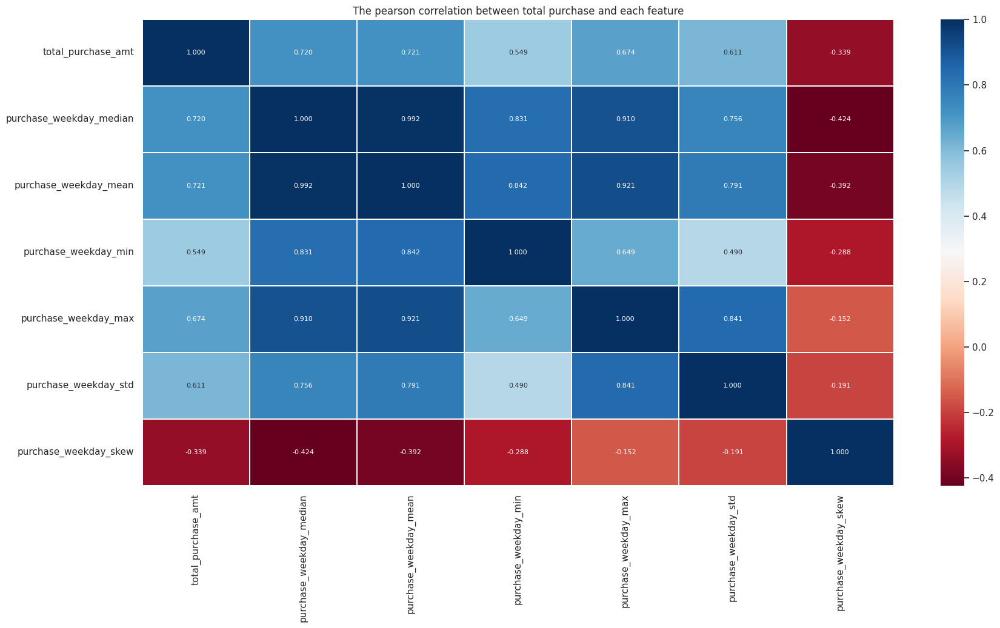

In [ ]:
# Plot the correlation graph of dynamic features

draw_correlation_heatmap(total_balance[['total_purchase_amt'] +
                                      ['purchase_weekday_median',
                                      'purchase_weekday_mean','purchase_weekday_min',
                                       'purchase_weekday_max','purchase_weekday_std',
                                       'purchase_weekday_skew'
                                      ]])

In [ ]:
# Check if 'is_worked_yestday' is in the DataFrame columns
if 'is_worked_yestday' not in feature.columns:
    # If not, either create the column or remove it from the selection
    # Option 1: Create a placeholder column (if you know how to generate it)
    # feature['is_worked_yestday'] = ...  # your logic to create the column

    # Option 2: Remove the column from the selection
    columns_to_select = labels + ['dis_to_nowork', 'dis_to_work', 'dis_from_work', 'purchase_weekdayrate',
       'redeem_dayrate', 'weekday_onehot_5', 'weekday_onehot_6',
       'dis_from_nowork', 'is_holiday', 'weekday_onehot_1', 'weekday_onehot_2',
       'weekday_onehot_0', 'dis_from_middleofweek', 'dis_from_holiendday',
       'weekday_onehot_3', 'is_lastday_of_holiday', 'is_firstday_of_holiday',
       'weekday_onehot_4', 'is_second_week',
       'is_third_week', 'dis_from_startofmonth', 'dis_from_holiday', 'total_purchase_amt',
       'total_redeem_amt', 'date']

    # Remove 'is_worked_yestday' if it's in the list
    if 'is_worked_yestday' in columns_to_select:
        columns_to_select.remove('is_worked_yestday')

    feature[columns_to_select].to_csv('residual_purchase_origined.csv', index=False)
else:
    # If the column is present, the code should work as intended
    feature[labels + ['dis_to_nowork', 'dis_to_work', 'dis_from_work', 'purchase_weekdayrate',
       'redeem_dayrate', 'weekday_onehot_5', 'weekday_onehot_6',
       'dis_from_nowork', 'is_holiday', 'weekday_onehot_1', 'weekday_onehot_2',
       'weekday_onehot_0', 'dis_from_middleofweek', 'dis_from_holiendday',
       'weekday_onehot_3', 'is_lastday_of_holiday', 'is_firstday_of_holiday',
       'weekday_onehot_4', 'is_worked_yestday', 'is_second_week',
       'is_third_week', 'dis_from_startofmonth', 'dis_from_holiday', 'total_purchase_amt',
       'total_redeem_amt', 'date']].to_csv('residual_purchase_origined.csv', index=False)

#  Feature elimination and removal

### 1.1 Remove features that cannot effectively split the dataset

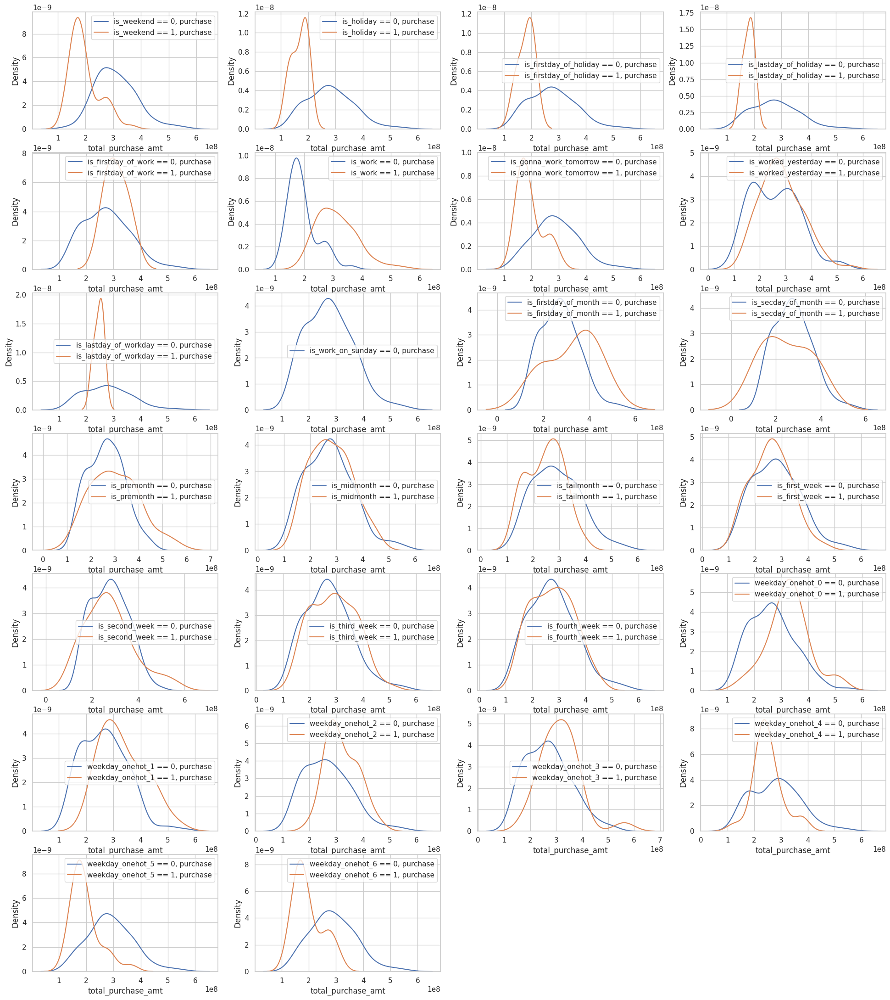

In [ ]:
# Plot the distribution estimation graph of each feature dividing the dataset
plt.figure(figsize=(4 * 6, 6 * len(feature.columns) / 6))
count = 0
for i in [x for x in feature.columns
          if (x not in labels + date_indexs + ['date'])
          & ('amt' not in x) & ('dis' not in x) & ('rate' not in x)]:
    count += 1
    # if feature[feature[i] == 0].empty:
    #     continue
    plt.subplot(12, 4, count)

    ax = sns.kdeplot(feature[feature[i] == 0]['total_purchase_amt'], label= str(i) + ' == 0, purchase')
    ax = sns.kdeplot(feature[feature[i] == 1]['total_purchase_amt'], label= str(i) + ' == 1, purchase')
    plt.legend()

In [ ]:
# Remove features that do not clearly separate the dataset

purchase_feature_seems_useless += ['is_gonna_work_tomorrow','is_fourth_week','weekday_onehot_4']

# Select the best-performing features

In [ ]:
# Split the dataset

def split_data_underline(data):
    import datetime
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

### 1.1 Using the SHAP package to select top features

> SHAP values represent the fair score of features depending on their contribution towards the total score in the set of features.

> SHAP also visualizes how the score changes when the feature value is low/high for each data point.

The basic principle of SHAP is to calculate the impact of different feature values by considering all possible combinations of features and their influence on the prediction results. Specifically, SHAP values measure each feature's contribution to the model's output, representing the average effect of each feature value on the prediction outcome across all possible combinations of features. This average effect can be used to explain a model's prediction for an individual result.

In [ ]:
duplicated_col = feature.columns.duplicated()
feature = feature.loc[:,~duplicated_col]

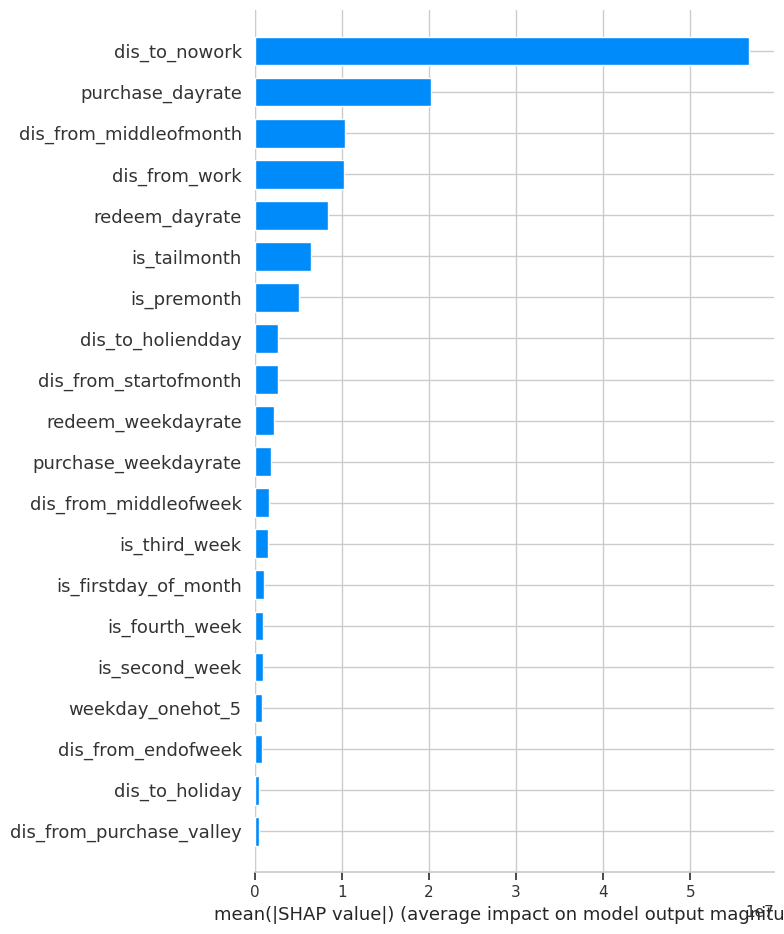

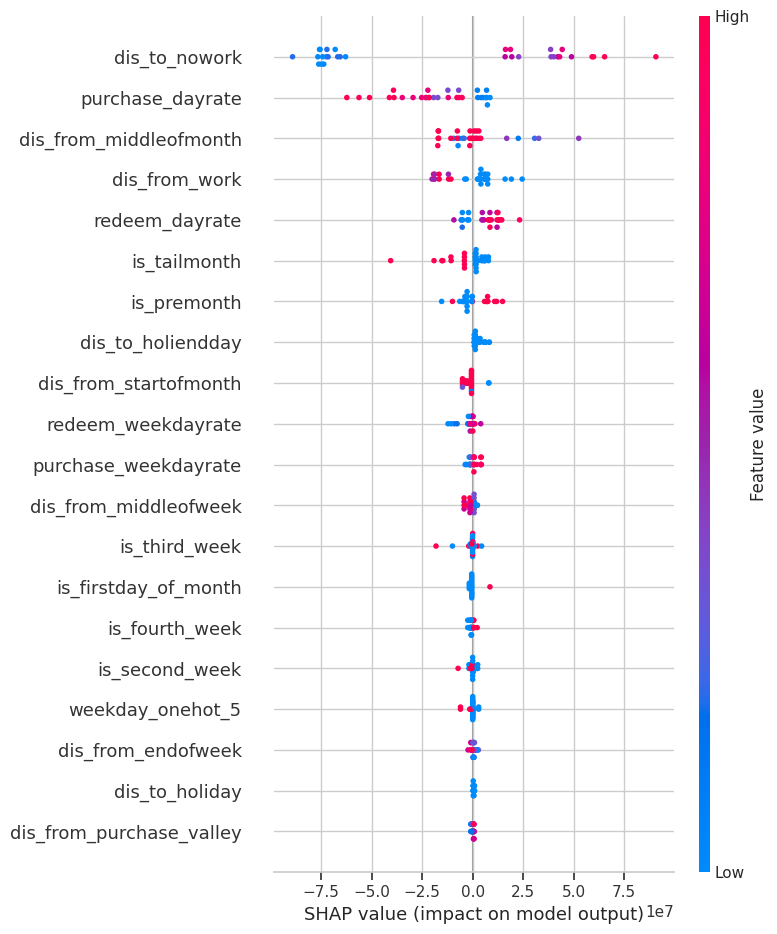

In [ ]:
shap.initjs()
from sklearn import tree
model = tree.DecisionTreeRegressor()
train, test = split_data_underline(feature.dropna())
features = [x for x in train.columns if x not in date_indexs]
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])

explainer = shap.TreeExplainer(model)
shap_testues = explainer.shap_values(test[features].drop(labels+['date'], axis=1))

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1), plot_type='bar')

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1))

tree_important_purchase = pd.DataFrame(np.mean(np.abs(shap_testues), axis=0),[x for x in features if x not in labels + date_indexs + ['date']]).reset_index()

In [ ]:
tree_important_purchase = tree_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
tree_important_purchase = list(tree_important_purchase[:30]['index'])

In [ ]:
tree_important_purchase

['dis_to_nowork',
 'purchase_dayrate',
 'dis_from_middleofmonth',
 'dis_from_work',
 'redeem_dayrate',
 'is_tailmonth',
 'is_premonth',
 'dis_to_holiendday',
 'dis_from_startofmonth',
 'redeem_weekdayrate',
 'purchase_weekdayrate',
 'dis_from_middleofweek',
 'is_third_week',
 'is_firstday_of_month',
 'is_fourth_week',
 'is_second_week',
 'weekday_onehot_5',
 'dis_from_endofweek',
 'dis_to_holiday',
 'dis_from_purchase_valley',
 'weekday_onehot_0',
 'is_lastday_of_holiday',
 'is_first_week',
 'is_lastday_of_workday',
 'weekday_onehot_1',
 'dis_from_holiendday',
 'is_midmonth',
 'dis_from_nowork',
 'weekday_onehot_2',
 'is_gonna_work_tomorrow']

In [ ]:
# Output the selected features

def draw_cloud(feature_index: List[str])->None:
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    ciyun = WordCloud(background_color='white', max_font_size=40)
    ciyun.generate(text=''.join([x+' ' for x in feature_index if x != 'total_purchase_amt']))
    plt.imshow(ciyun, interpolation='bilinear')
    plt.axis("off")


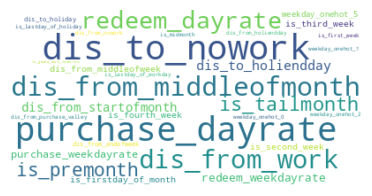

In [ ]:
draw_cloud(tree_important_purchase)

### 1.2 Using the Permutation Importance package to select top features

Permutation Importance is a method used to explain the feature importance in machine learning models. It works by randomly shuffling (i.e., permuting) the feature values and then observing how the model's performance changes, thereby measuring the feature's importance. The basic idea is that if a feature is important for the model's prediction, shuffling its values will significantly degrade the model's performance. Conversely, if a feature is not important for the prediction, shuffling its values should result in minimal change to the model's performance.

In [ ]:
model = LinearRegression()
train, test = split_data_underline(feature.dropna())
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])
perm = PermutationImportance(model, random_state=42).fit(test[features].drop(labels+['date'], axis=1), test['total_purchase_amt'])
liner_important_purchase = pd.DataFrame(np.abs(perm.feature_importances_), [x for x in features if x not in labels + date_indexs + ['date']]).reset_index()
eli5.show_weights(perm, feature_names=list(str(x) for x in features if x not in labels + ['date']))


In [ ]:
liner_important_purchase = liner_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
liner_important_purchase = list(liner_important_purchase[:30]['index'])


In [ ]:
draw_cloud(liner_important_purchase)

### 1.3 Take the intersection of the feature sets to select the final top features

In [ ]:
winer_features_purchase = list(set(tree_important_purchase)\
                     & set(liner_important_purchase))

In [ ]:
draw_cloud(winer_features_purchase)

In [ ]:
# Split the dataset

labels = ['total_purchase_amt', 'total_redeem_amt']

def split_data_underline(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

def split_data_online(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    testset = data[(datetime.date(2014,9,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,10,1))]
    return trainset, testset

In [ ]:
# Define the evaluation function

def AE(y: Iterable, yhat: Iterable)->Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: int = 0.3)->Iterable:
    return sum(map(lambda x : np.exp(-x/h)*10, AE(purchase, purchasehat))) * 0.45 + sum(map(lambda x : np.exp(-x/h)*10, AE(redeem, redeemhat))) * 0.55

In [ ]:
# Validate the model over different time periods
def week_evalution_single(data: pd.DataFrame, model: object, types: str)->pd.DataFrame:
    results = []
    a_month = relativedelta(months=1)
    for i in [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]:
        trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
        testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < i + a_month)]
        if len(testset) == 0 or len(trainset) == 0:
            i = datetime.date(2014, 4, 20)
            trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
            testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014, 9, 1))]
        feature = [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']]

        model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
        result_lr = model.predict(testset[feature])

        h = 0.3
        results.append(sum(AE(testset['total_' + types + '_amt'], result_lr).apply(lambda x : np.exp(-x/h))*10))
    return pd.DataFrame(results)

In [ ]:
# Output the rating table
def draw_eva_table(df: pd.DataFrame)->pd.DataFrame:
    rest = df.copy()
    rest['interval'] = [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]
    return rest

In [ ]:
# Visualize the generated results

def visual(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->None:
    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_purchase_lr, label='predicted_purchase')
    plt.plot(testset['date'], testset['total_purchase_amt'], label='real_purchase')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict purchase")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_purchase_lr - testset['total_purchase_amt'])

    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_redeem_lr, label='predicted_redeem')
    plt.plot(testset['date'], testset['total_redeem_amt'], label='real_redeem')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict redeem")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_redeem_lr - testset['total_redeem_amt'])

In [ ]:
# Define a function to extract the best offline features

def feature_extract(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], List[float]]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    score = -1
    for i in features:
        score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types))
        if score_update > score:
            score = score_update
            results.append(i)
    return results, score

def robust_feature_extract(data: pd.DataFrame, model: object, types: str):
    results = []
    score = -1
    for i in range(10):
        results_update, score_update = feature_extract(data, model, types)
        if score_update > score:
            score = score_update
            results = results_update
        print(results_update, score_update)
    return results

In [ ]:
# Define AIC and BIC evaluation metrics

def AIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + 2 * (n_features + 1)
def BIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + (n_features + 1) * np.log10(L)

In [ ]:
# Use the AIC metric to blend the model

def feature_extract_AIC(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], float]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    test_score = 1e9
    train_score = 0
    for i in features:
        test_score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types)[0])
        if test_score_update < test_score:
            test_score = test_score_update
            results.append(i)

    trainset, testset = split_data_underline(data)
    feature = results
    model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
    train_result_lr = model.predict(trainset[feature])
    delta = mean_squared_error(train_result_lr, trainset['total_' + types + '_amt'])
    #delta = np.sum(AE(trainset['total_' + types + '_amt'], train_result_lr).apply(lambda x : np.exp(-x/0.1))*10)
    return results, AIC(len(trainset), delta, len(feature))

def multi_model(data: pd.DataFrame, model: object, types: str)->Tuple[List[List[str]], float]:
    features = []
    weights = []
    for i in range(100):
        results_update, score_update = feature_extract_AIC(data, model, types)
        features.append(results_update)
        weights.append(score_update)
    avg = np.mean(weights)
    weights = [x - avg for x in weights]
    weights = [np.power((-1 * x / 2), 10) for x in weights]
    summ = np.sum(weights)
    weights = [x / summ for x in weights]
    return features, weights

In [ ]:
# Generate online results
def generate_online_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_online(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [ ]:
def generate_under_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_underline(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [ ]:
# Generate the format for online submission
def normalize_upload_file(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->pd.DataFrame:
    testset['total_purchase_amt'] = result_purchase_lr
    testset['total_redeem_amt'] = result_redeem_lr
    online_upload = testset[['date','total_purchase_amt','total_redeem_amt']]
    online_upload['date'] = online_upload['date'].astype(str)
    online_upload['date'] = online_upload['date'].str.replace('-','')
    return online_upload

In [ ]:
# Visualize the online results

def draw_result(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame):
    fig = plt.figure(figsize=(12,6))
    plt.plot(testset['date'], result_purchase_lr, label='online_purchase', linewidth = 0.7, linestyle = '--', marker = 'o')
    plt.plot(testset['date'], result_redeem_lr, label='online_redeem', linewidth = 1.2, marker = '*')
    plt.legend(loc='best')
    plt.title("The predict values")
    plt.xlabel("Time")
    plt.ylabel("Amount")

In [ ]:
# Overload the DataFrame addition operation

def add_two_df(df1, df2, features = None, left_a = 0.45, right_a = 0.55):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] = (data[i] * left_a + df2[i] * right_a)
    return data

In [ ]:
# Overload the DataFrame multiplication operation

def scale_df(df1, features = None, eta = 1):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] *= eta
    return data

**Translation:**

# Feature Elimination





##1. Using only IS features

In [ ]:
winer_features_purchase

In [ ]:
data = feature[['date','total_purchase_amt','total_redeem_amt']+winer_features_purchase].copy()
data['date'] = pd.to_datetime(data['date'])

In [ ]:
trainset, testset = split_data_underline(data)
result_purchase_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_purchase_amt')
result_redeem_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_redeem_amt')

### 1.1 August Prediction

In [ ]:
total_AE(result_purchase_lr, result_redeem_lr, testset['total_purchase_amt'], testset['total_redeem_amt'])

In [ ]:
draw_eva_table(week_evalution_single(data, model=LinearRegression(), types = 'purchase'))

### 1.2 Sliding Window Testing

In [ ]:
draw_eva_table(week_evalution_single(data, LinearRegression(), 'redeem'))

### 1.3 Comparative Analysis

In [ ]:
visual(result_purchase_lr, result_redeem_lr, testset)

In [ ]:
result_purchase_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_purchase_amt')
result_redeem_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_redeem_amt')

### 1.4 September Prediction

In [ ]:
trainset, testset = split_data_online(data)
draw_result(result_purchase_lr, result_redeem_lr, testset)

In [ ]:
# from datetime import datetime
# now = datetime.now().strftime("%Y-%m-%d")
# save_path = '路径'
# normalize_upload_file(result_purchase_lr, result_redeem_lr, testset).to_csv(save_path+f'{now}_only_is.csv',index=False,header=None)

## 1.5 Multi-model Comparative Analysis

In [ ]:
def multi_model_eva(data, types: str = 'purchase'):
    results = pd.DataFrame()
    models = [
        LinearRegression(),
        DecisionTreeRegressor(),
        RandomForestRegressor(),
        GradientBoostingRegressor(),
        MLPRegressor(solver='lbfgs'),
        xgb.XGBRegressor(objective='reg:squarederror'),
        Lasso(),
        Ridge(),
        ElasticNet(),
        BayesianRidge(),
        HuberRegressor(),
        SVR(),
        KNeighborsRegressor()
    ]

    # Initialize tqdm to track progress
    progress_bar = tqdm(models, desc="Evaluating Models", unit="model")

    for model in progress_bar:
        model_name = repr(model).split('(')[0]
        if results.empty:
            results = draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name})
        else:
            results = pd.merge(results,
                               draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name}),
                               on='interval')

        # Update tqdm description with current model name
        progress_bar.set_postfix({'Current Model': model_name})

    results = results[['interval'] + [x for x in results.columns if x != 'interval']]
    return results

multi_result = add_two_df(multi_model_eva(data, 'purchase'), multi_model_eva(data, 'redeem')).set_index('interval')
multi_result

multi_result.plot(figsize = (12,5),kind = 'line', marker = 'o', linewidth = 0.7, linestyle = '--')
plt.title('Model Comparison')
plt.xlabel('Interval')
plt.ylabel('Score')

In [ ]:
from prophet import Prophet

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=0b5e9fd4-2df2-470f-bee9-f774564d5124
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:01<00:00, 154MB/s]
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbxbunlqh/whnmv53u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpbxbunlqh/1_kzh6km.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21544', 'data', 'file=/tmp/tmpbxbunlqh/whnmv53u.json', 'init=/tmp/tmpbxbunlqh/1_kzh6km.json', 'output', 'file=/tmp/tmpbxbunlqh/prophet_model9yoyvml7/prophet_model-20240922040543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:05:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:05:44 - cmdstanpy - 

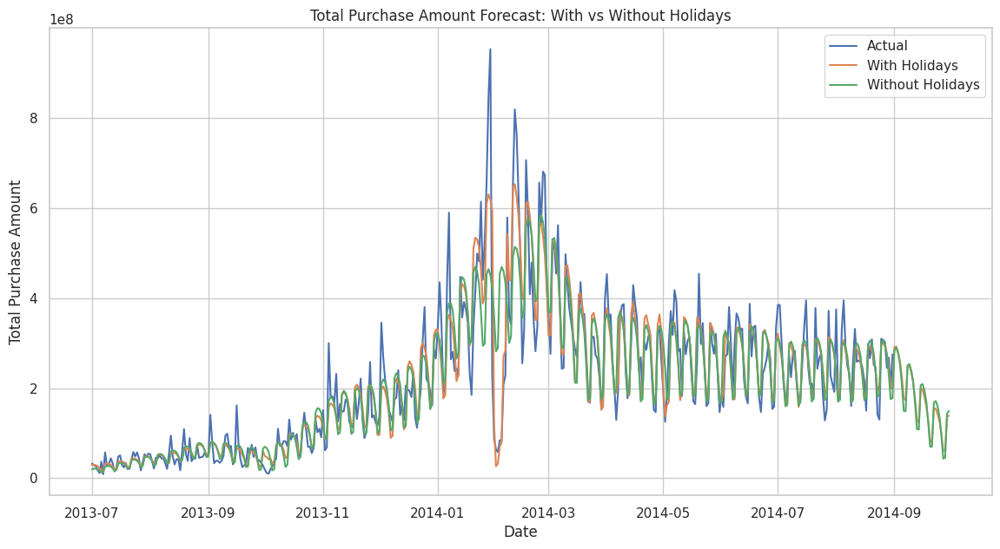

In [ ]:
# Prepare the data format required for the Prophet model

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date=None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

df_purchase = total_balance[['date', 'total_purchase_amt']].rename(columns={'date': 'ds', 'total_purchase_amt': 'y'})

# Add special date data
special_dates = [
    '2014-04-01', '2014-04-06', '2014-04-10', '2014-04-12', '2014-04-15', '2014-04-20',
    '2014-04-24', '2014-04-27', '2014-04-29', '2014-05-02', '2014-05-07', '2014-05-11',
    '2014-05-12', '2014-05-18', '2014-05-19', '2014-05-25', '2014-05-26', '2014-05-31',
    '2014-06-05', '2014-06-07', '2014-06-09', '2014-06-15', '2014-06-16', '2014-06-22',
    '2014-06-26', '2014-06-29', '2014-07-01', '2014-07-05', '2014-07-07', '2014-07-13',
    '2014-07-16', '2014-07-20', '2014-07-21', '2014-07-26', '2014-07-28', '2014-08-03',
    '2014-08-05', '2014-08-09', '2014-08-11', '2014-08-17', '2014-08-18', '2014-08-24'
]

holidays = pd.DataFrame({
    'holiday': 'special_day',
    'ds': pd.to_datetime(special_dates),
    'lower_window': 0,
    'upper_window': 1
})

# Create and train the Prophet model with holidays
m_with_holidays = Prophet(
    holidays=holidays,
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_with_holidays.add_country_holidays(country_name='CN')  # Add Chinese holidays
m_with_holidays.fit(df_purchase)

# Create and train the Prophet model without holidays
m_without_holidays = Prophet(
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_without_holidays.fit(df_purchase)

# Generate dates for the next 30 days
future = m_with_holidays.make_future_dataframe(periods=30)

# Make predictions
forecast_with_holidays = m_with_holidays.predict(future)
forecast_without_holidays = m_without_holidays.predict(future)

# Visualize the results comparison
plt.figure(figsize=(14, 7))
plt.plot(df_purchase['ds'], df_purchase['y'], label='Actual')
plt.plot(forecast_with_holidays['ds'], forecast_with_holidays['yhat'], label='With Holidays')
plt.plot(forecast_without_holidays['ds'], forecast_without_holidays['yhat'], label='Without Holidays')
# plt.fill_between(forecast_with_holidays['ds'], forecast_with_holidays['yhat_lower'], forecast_with_holidays['yhat_upper'], alpha=0.2)
# plt.fill_between(forecast_without_holidays['ds'], forecast_without_holidays['yhat_lower'], forecast_without_holidays['yhat_upper'], alpha=0.2)
plt.title('Total Purchase Amount Forecast: With vs Without Holidays')
plt.xlabel('Date')
plt.ylabel('Total Purchase Amount')
plt.legend()
plt.show()
